In [ ]:
import zipfile

with zipfile.ZipFile("/content/drive/MyDrive/class40.zip", "r") as zip_ref:
    zip_ref.extractall("./")

# Nadam batch size 16

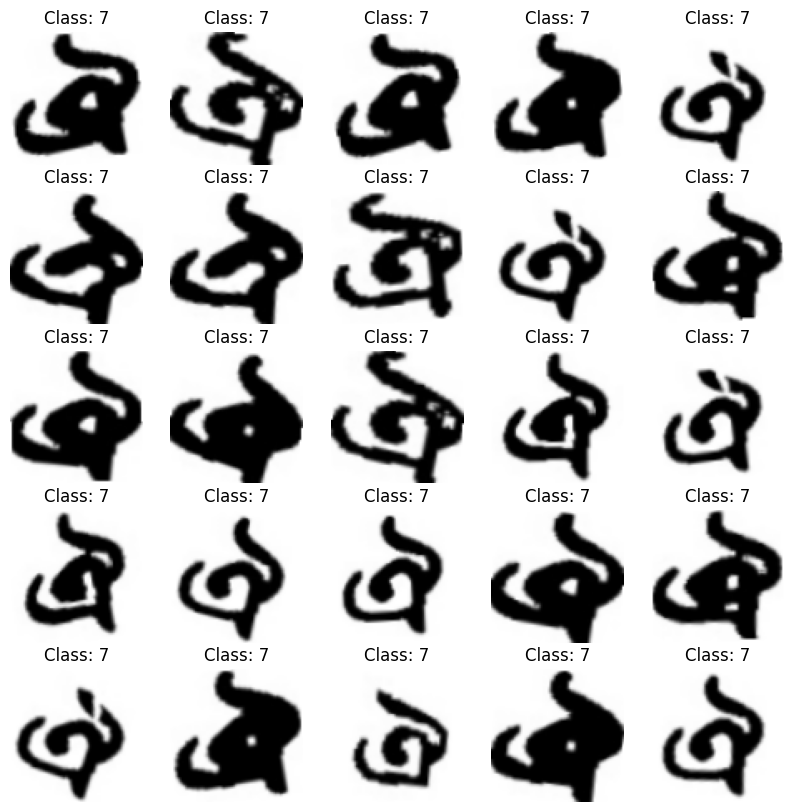

Epoch 1/10
1330/1330 [==============================] - 29s 19ms/step - loss: 1.8063 - accuracy: 0.9340 - val_loss: 0.5309 - val_accuracy: 0.9741
Epoch 2/10
1330/1330 [==============================] - 25s 19ms/step - loss: 0.4000 - accuracy: 0.9890 - val_loss: 0.3743 - val_accuracy: 0.9821
Epoch 3/10
1330/1330 [==============================] - 26s 19ms/step - loss: 0.3647 - accuracy: 0.9899 - val_loss: 0.3136 - val_accuracy: 0.9920
Epoch 4/10
1330/1330 [==============================] - 26s 19ms/step - loss: 0.2959 - accuracy: 0.9916 - val_loss: 0.2881 - val_accuracy: 0.9902
Epoch 5/10
1330/1330 [==============================] - 26s 19ms/step - loss: 0.2575 - accuracy: 0.9926 - val_loss: 0.2466 - val_accuracy: 0.9929
Epoch 6/10
1330/1330 [==============================] - 26s 20ms/step - loss: 0.2214 - accuracy: 0.9920 - val_loss: 0.2063 - val_accuracy: 0.9920
Epoch 7/10
1330/1330 [==============================] - 26s 20ms/step - loss: 0.3252 - accuracy: 0.9874 - val_loss: 0.3300 -

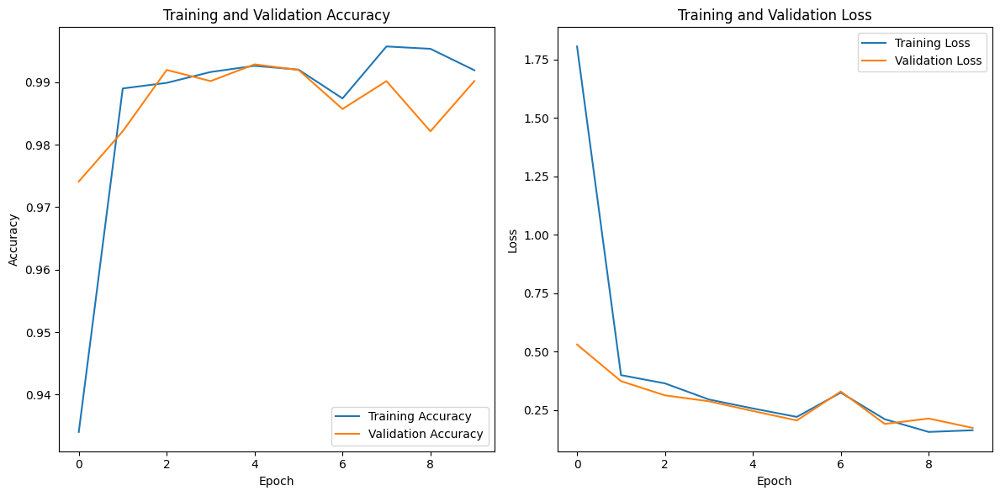

300/300 [==============================] - 7s 22ms/step


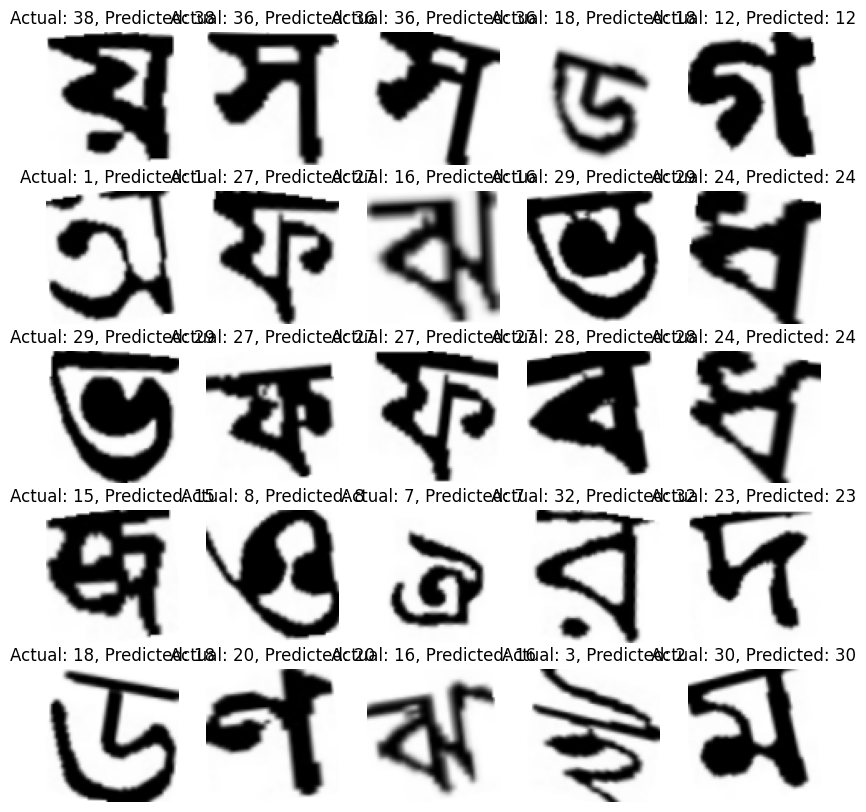

F1 Score: 0.987669892787188


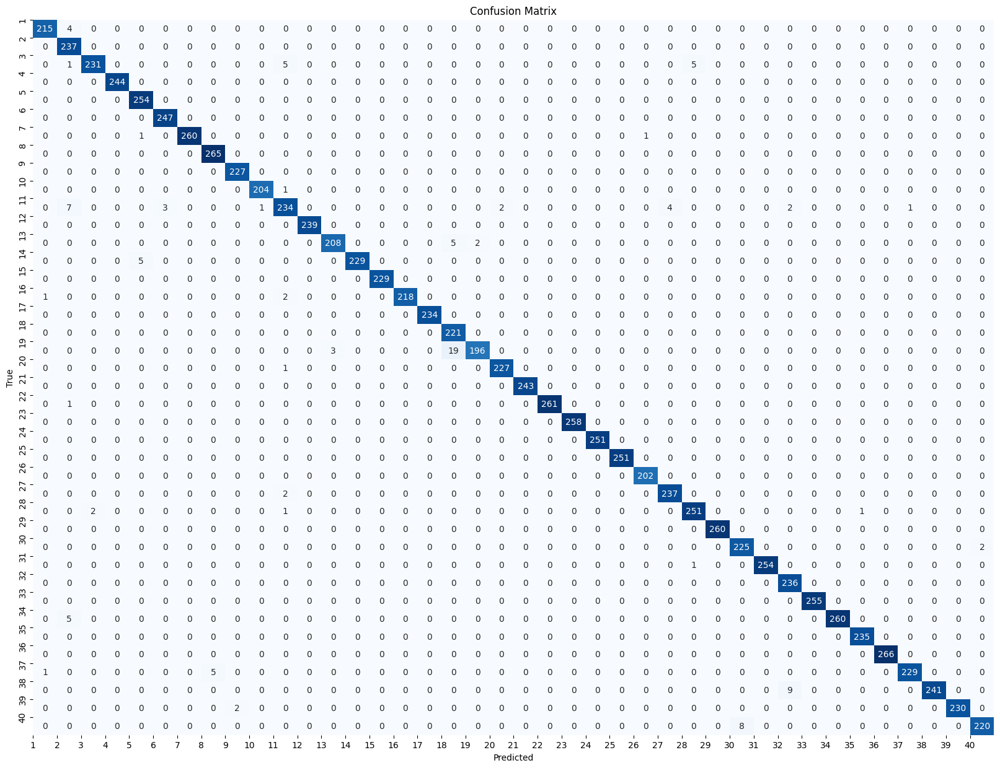

Classification Report:
              precision    recall  f1-score   support

           1       0.99      0.98      0.99       219
           2       0.93      1.00      0.96       237
           3       0.99      0.95      0.97       242
           4       1.00      1.00      1.00       244
           5       0.98      1.00      0.99       254
           6       0.99      1.00      0.99       247
           7       1.00      0.99      1.00       262
           8       0.98      1.00      0.99       265
           9       0.99      1.00      1.00       227
          10       1.00      1.00      1.00       205
          11       0.95      0.92      0.94       254
          12       1.00      1.00      1.00       239
          13       0.99      0.97      0.98       215
          14       1.00      0.98      0.99       234
          15       1.00      1.00      1.00       229
          16       1.00      0.99      0.99       221
          17       1.00      1.00      1.00       234
    

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Nadam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Display sample images and their labels
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(f"Class: {labels[i]}")
    plt.axis('off')
plt.show()

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

# Load pre-trained VGG16 model without fully connected layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

# Add custom classification layers with dropout
vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

# Merge CNN and VGG16 models
merged_model = concatenate([cnn_output, vgg_output])

# Create the final model
output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with Nadam optimizer and a batch size of 16
model.compile(optimizer=Nadam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model for 10 epochs
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=16,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Plot training and validation accuracy curves along with training and validation loss curves
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Display sample images with their actual and predicted classes
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow(x_test_balanced[i])
    plt.title(f"Actual: {y_test_balanced[i]}, Predicted: {predicted_classes[i]}")
    plt.axis('off')
plt.show()

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)


# Nadam batch size 64

Epoch 1/20
333/333 [==============================] - 26s 53ms/step - loss: 4.6181 - accuracy: 0.8822 - val_loss: 0.4165 - val_accuracy: 0.9893
Epoch 2/20
333/333 [==============================] - 16s 48ms/step - loss: 0.3366 - accuracy: 0.9967 - val_loss: 0.3412 - val_accuracy: 0.9946
Epoch 3/20
333/333 [==============================] - 16s 48ms/step - loss: 0.2987 - accuracy: 0.9939 - val_loss: 0.3251 - val_accuracy: 0.9848
Epoch 4/20
333/333 [==============================] - 16s 49ms/step - loss: 0.2886 - accuracy: 0.9932 - val_loss: 0.3034 - val_accuracy: 0.9937
Epoch 5/20
333/333 [==============================] - 16s 49ms/step - loss: 0.2433 - accuracy: 0.9983 - val_loss: 0.2340 - val_accuracy: 0.9946
Epoch 6/20
333/333 [==============================] - 16s 49ms/step - loss: 0.2089 - accuracy: 0.9988 - val_loss: 0.1984 - val_accuracy: 0.9964
Epoch 7/20
333/333 [==============================] - 16s 49ms/step - loss: 0.1783 - accuracy: 0.9990 - val_loss: 0.1712 - val_accuracy:

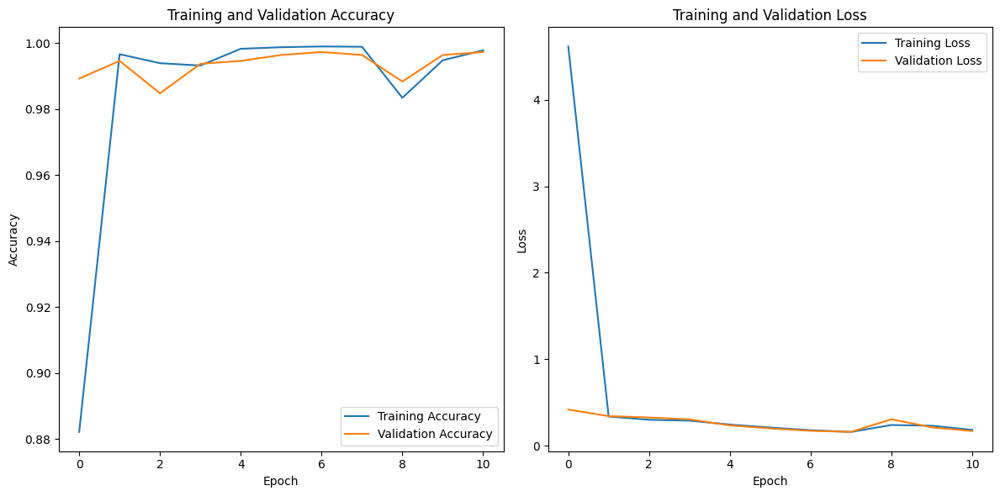

300/300 [==============================] - 7s 22ms/step
F1 Score: 0.9957323818991212


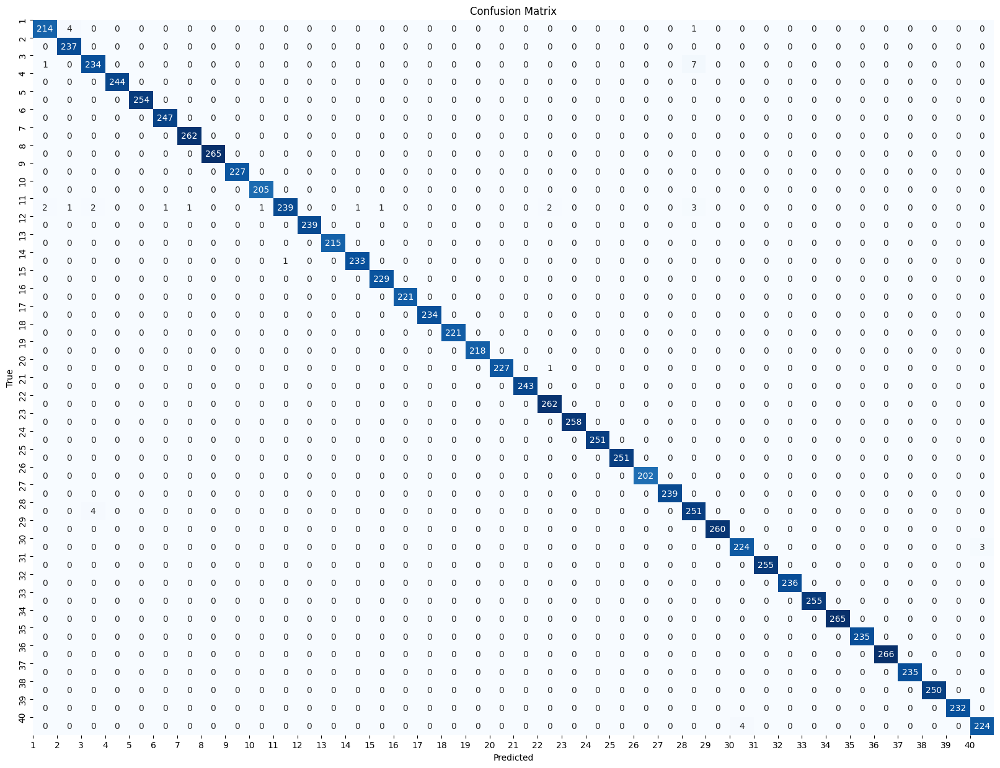

Classification Report:
              precision    recall  f1-score   support

           1       0.99      0.98      0.98       219
           2       0.98      1.00      0.99       237
           3       0.97      0.97      0.97       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      1.00      1.00       227
          10       1.00      1.00      1.00       205
          11       1.00      0.94      0.97       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Nadam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

# Load pre-trained VGG16 model without fully connected layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

# Add custom classification layers with dropout
vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

# Merge CNN and VGG16 models
merged_model = concatenate([cnn_output, vgg_output])

# Create the final model
output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with Nadam optimizer and a batch size of 64
model.compile(optimizer=Nadam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model for 20 epochs
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=64,
    epochs=20,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Plot training and validation accuracy curves along with training and validation loss curves
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)


# Nadam batch size 32

Epoch 1/20
665/665 [==============================] - 22s 29ms/step - loss: 1.5899 - accuracy: 0.9312 - val_loss: 0.3359 - val_accuracy: 0.9902
Epoch 2/20
665/665 [==============================] - 19s 28ms/step - loss: 0.2836 - accuracy: 0.9949 - val_loss: 0.2642 - val_accuracy: 0.9920
Epoch 3/20
665/665 [==============================] - 19s 28ms/step - loss: 0.2630 - accuracy: 0.9935 - val_loss: 0.3112 - val_accuracy: 0.9839
Epoch 4/20
665/665 [==============================] - 19s 29ms/step - loss: 0.2322 - accuracy: 0.9949 - val_loss: 0.2709 - val_accuracy: 0.9795
Epoch 5/20
665/665 [==============================] - 19s 29ms/step - loss: 0.2259 - accuracy: 0.9946 - val_loss: 0.1691 - val_accuracy: 0.9982
Epoch 6/20
665/665 [==============================] - 19s 29ms/step - loss: 0.1907 - accuracy: 0.9935 - val_loss: 0.2266 - val_accuracy: 0.9946
Epoch 7/20
665/665 [==============================] - 19s 29ms/step - loss: 0.1959 - accuracy: 0.9947 - val_loss: 0.1787 - val_accuracy:

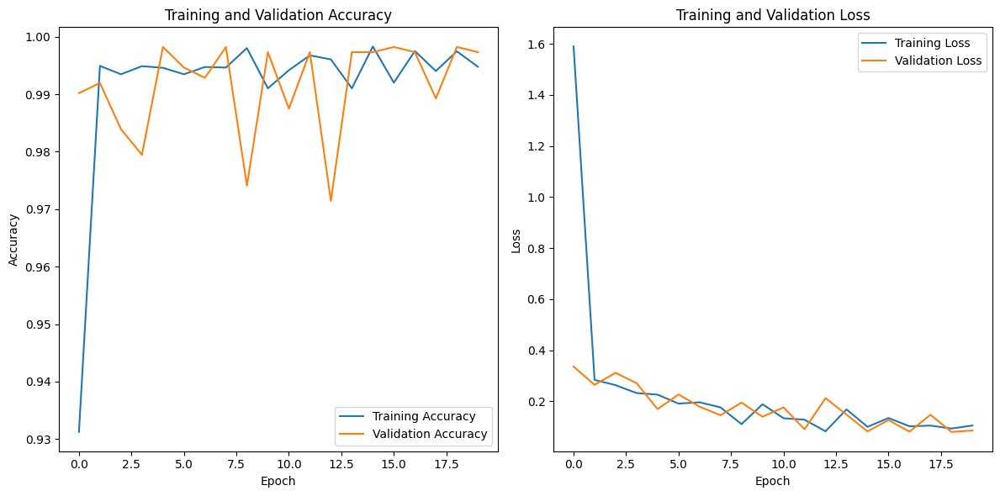

300/300 [==============================] - 7s 22ms/step
F1 Score: 0.9966183692600323


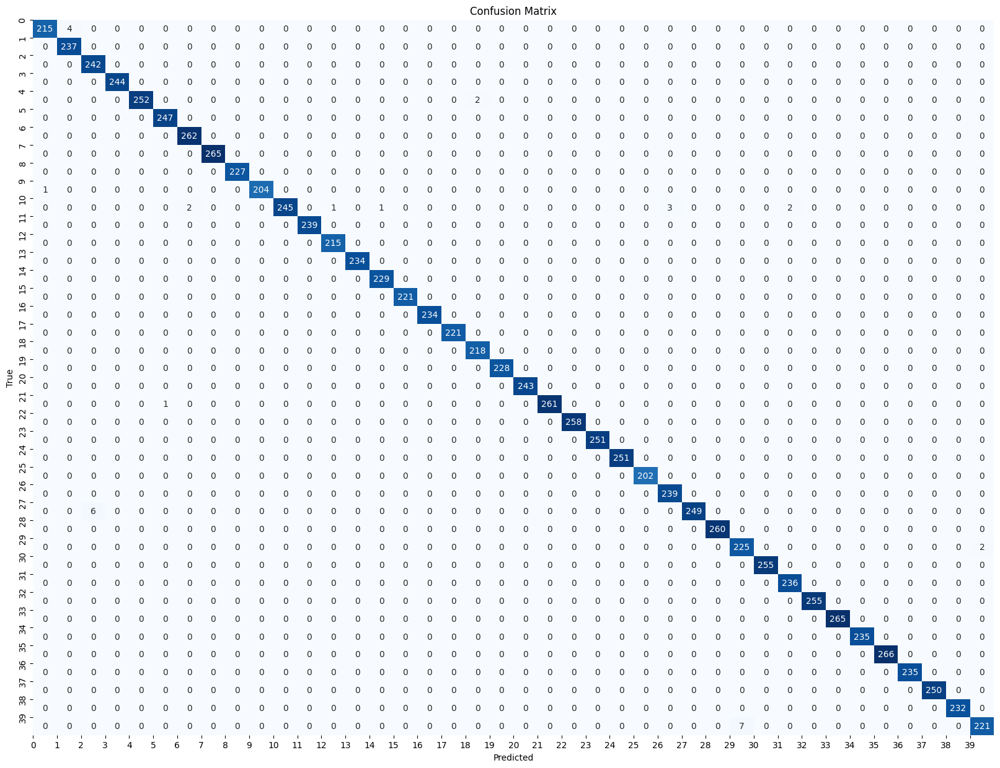

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       219
           1       0.98      1.00      0.99       237
           2       0.98      1.00      0.99       242
           3       1.00      1.00      1.00       244
           4       1.00      0.99      1.00       254
           5       1.00      1.00      1.00       247
           6       0.99      1.00      1.00       262
           7       1.00      1.00      1.00       265
           8       1.00      1.00      1.00       227
           9       1.00      1.00      1.00       205
          10       1.00      0.96      0.98       254
          11       1.00      1.00      1.00       239
          12       1.00      1.00      1.00       215
          13       1.00      1.00      1.00       234
          14       1.00      1.00      1.00       229
          15       1.00      1.00      1.00       221
          16       1.00      1.00      1.00       234
    

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Nadam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    # Automatically detect the number of classes
    num_classes = len(os.listdir(dataset_dir))

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  # Adjust labels to start from 0
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels, num_classes

# Load the dataset
dataset_dir = '/content/class40'
images, labels, num_classes = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

# Load pre-trained VGG16 model without fully connected layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

# Add custom classification layers with dropout
vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

# Merge CNN and VGG16 models
merged_model = concatenate([cnn_output, vgg_output])

# Create the final model
output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with Nadam optimizer and a batch size of 32
model.compile(optimizer=Nadam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model for 20 epochs
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=32,
    epochs=20,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Plot training and validation accuracy curves along with training and validation loss curves
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 0 to num_classes - 1
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(0, num_classes))  # Adjust x-axis labels
plt.yticks(np.arange(num_classes), np.arange(0, num_classes))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Adam optimizer batch size 32

Training with batch size: 32
Epoch 1/10
665/665 [==============================] - 21s 28ms/step - loss: 3.1967 - accuracy: 0.9269 - val_loss: 0.4159 - val_accuracy: 0.9920
Epoch 2/10
665/665 [==============================] - 18s 28ms/step - loss: 0.3782 - accuracy: 0.9923 - val_loss: 0.4079 - val_accuracy: 0.9875
Epoch 3/10
665/665 [==============================] - 18s 28ms/step - loss: 0.3590 - accuracy: 0.9916 - val_loss: 0.3320 - val_accuracy: 0.9937
Epoch 4/10
665/665 [==============================] - 19s 28ms/step - loss: 0.2916 - accuracy: 0.9961 - val_loss: 0.2556 - val_accuracy: 0.9973
Epoch 5/10
665/665 [==============================] - 19s 28ms/step - loss: 0.2813 - accuracy: 0.9922 - val_loss: 0.2748 - val_accuracy: 0.9937
Epoch 6/10
665/665 [==============================] - 19s 28ms/step - loss: 0.2687 - accuracy: 0.9939 - val_loss: 0.2296 - val_accuracy: 0.9946
Epoch 7/10
665/665 [==============================] - 19s 28ms/step - loss: 0.2041 - accuracy: 0.9966 - val

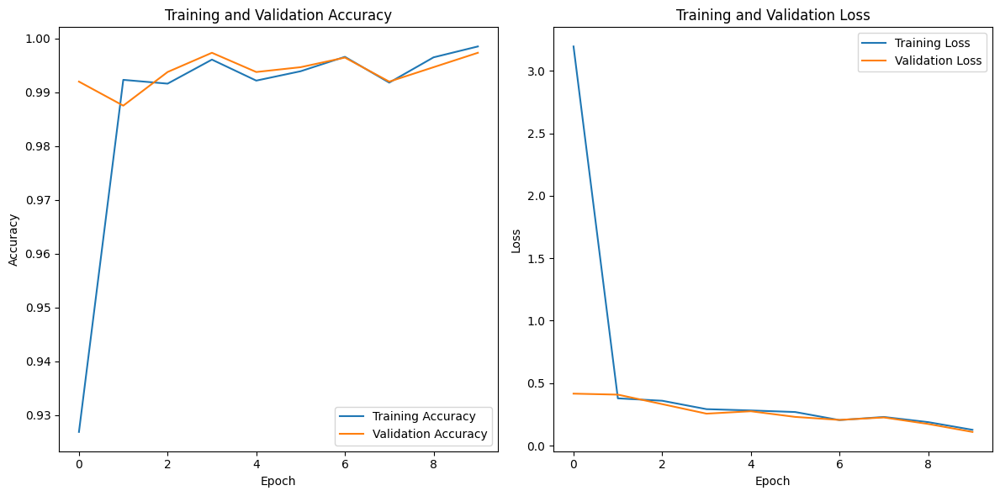

300/300 [==============================] - 7s 22ms/step
F1 Score: 0.9953174364376551


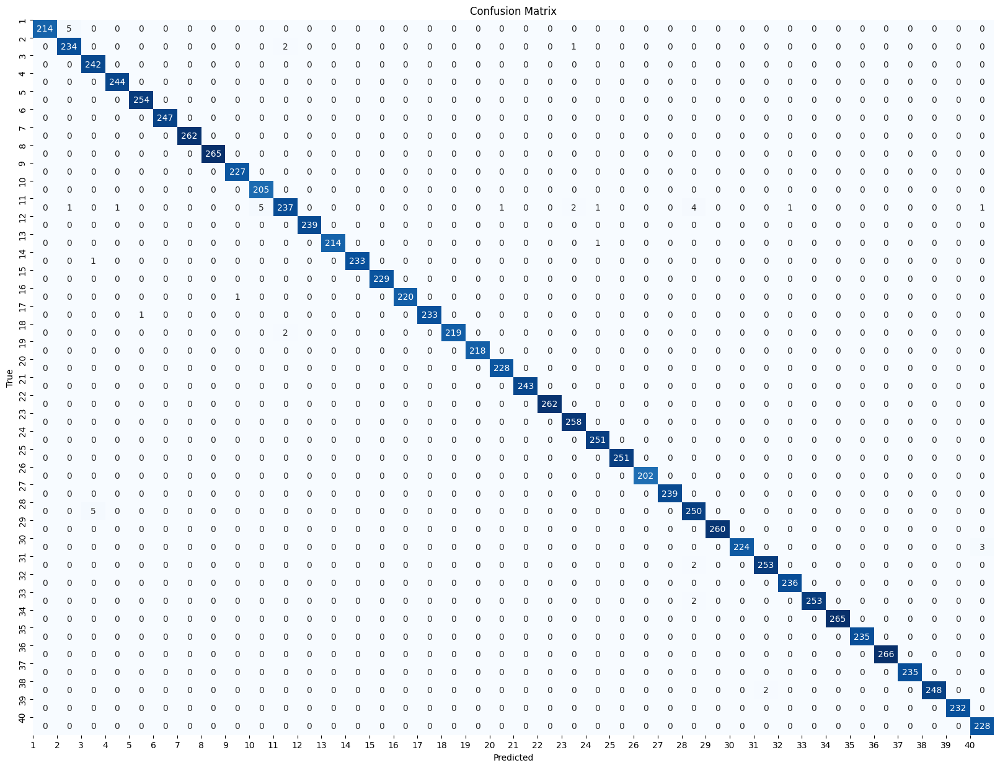

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.98      0.99       219
           2       0.97      0.99      0.98       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      1.00      1.00       227
          10       0.98      1.00      0.99       205
          11       0.98      0.93      0.96       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

# Load pre-trained VGG16 model without fully connected layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

# Add custom classification layers with dropout
vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

# Merge CNN and VGG16 models
merged_model = concatenate([cnn_output, vgg_output])

# Create the final model
output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with batch size 32
batch_size = 32
print(f"Training with batch size: {batch_size}")
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Plot training and validation accuracy curves along with training and validation loss curves
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)


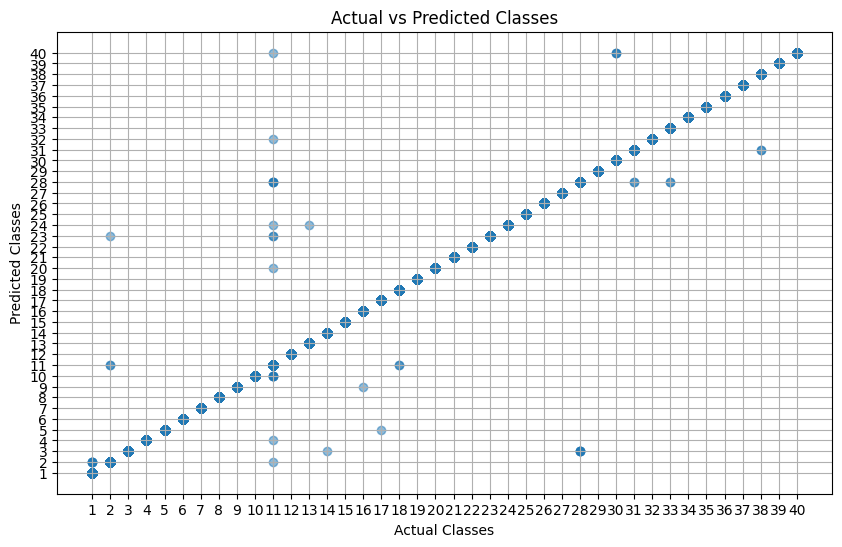

In [ ]:
# Plotting actual vs predicted classes
plt.figure(figsize=(10, 6))
plt.scatter(y_test_balanced, predicted_classes, alpha=0.5)
plt.xlabel('Actual Classes')
plt.ylabel('Predicted Classes')
plt.title('Actual vs Predicted Classes')
plt.xticks(np.arange(1, 41))
plt.yticks(np.arange(1, 41))
plt.grid(True)
plt.show()


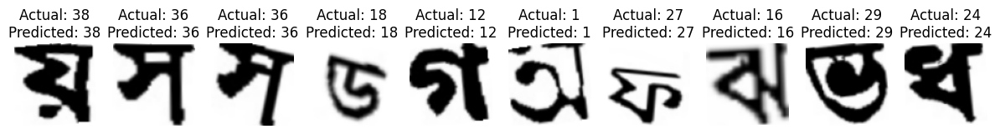

In [ ]:
# Function to display sample images along with actual and predicted classes
def display_sample_images(images, actual_labels, predicted_labels, class_names, num_samples=10):
    plt.figure(figsize=(15, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.show()

# Display sample images with actual and predicted classes
class_names = [str(i) for i in range(0, 41)]  # Assuming your class names are numbers from 0 to 41
display_sample_images(x_test_balanced, y_test_balanced, predicted_classes, class_names)



# adam 64

58889256/58889256 [==============================] - 4s 0us/step
Training with batch size: 64
Epoch 1/10
333/333 [==============================] - 25s 52ms/step - loss: 5.8933 - accuracy: 0.8992 - val_loss: 0.4161 - val_accuracy: 0.9911
Epoch 2/10
333/333 [==============================] - 16s 47ms/step - loss: 0.3779 - accuracy: 0.9966 - val_loss: 0.3431 - val_accuracy: 0.9955
Epoch 3/10
333/333 [==============================] - 16s 48ms/step - loss: 0.3196 - accuracy: 0.9964 - val_loss: 0.3300 - val_accuracy: 0.9911
Epoch 4/10
333/333 [==============================] - 16s 49ms/step - loss: 0.3509 - accuracy: 0.9918 - val_loss: 0.3361 - val_accuracy: 0.9929
Epoch 5/10
333/333 [==============================] - 17s 50ms/step - loss: 0.3089 - accuracy: 0.9964 - val_loss: 0.2803 - val_accuracy: 0.9964
Epoch 6/10
333/333 [==============================] - 17s 51ms/step - loss: 0.2786 - accuracy: 0.9957 - val_loss: 0.2731 - val_accuracy: 0.9946
Epoch 7/10
333/333 [======================

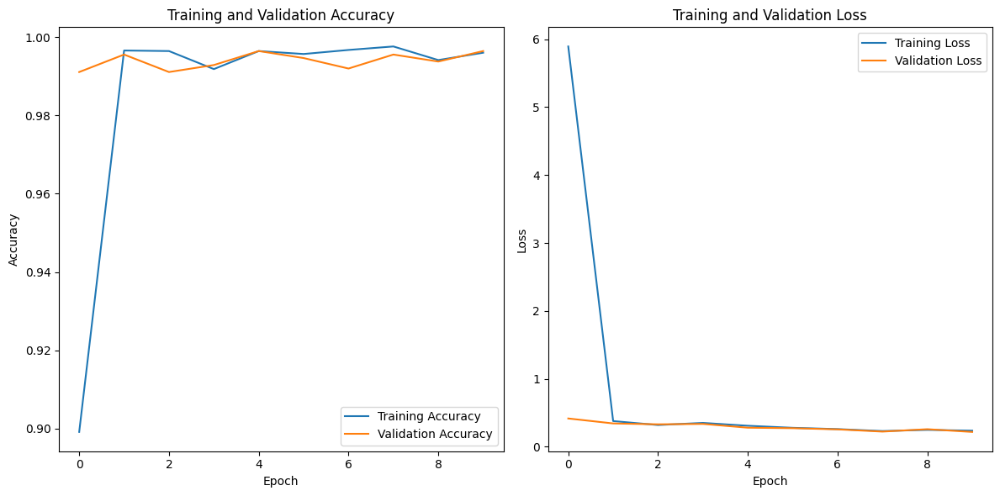

300/300 [==============================] - 7s 22ms/step
F1 Score: 0.9965536803139219


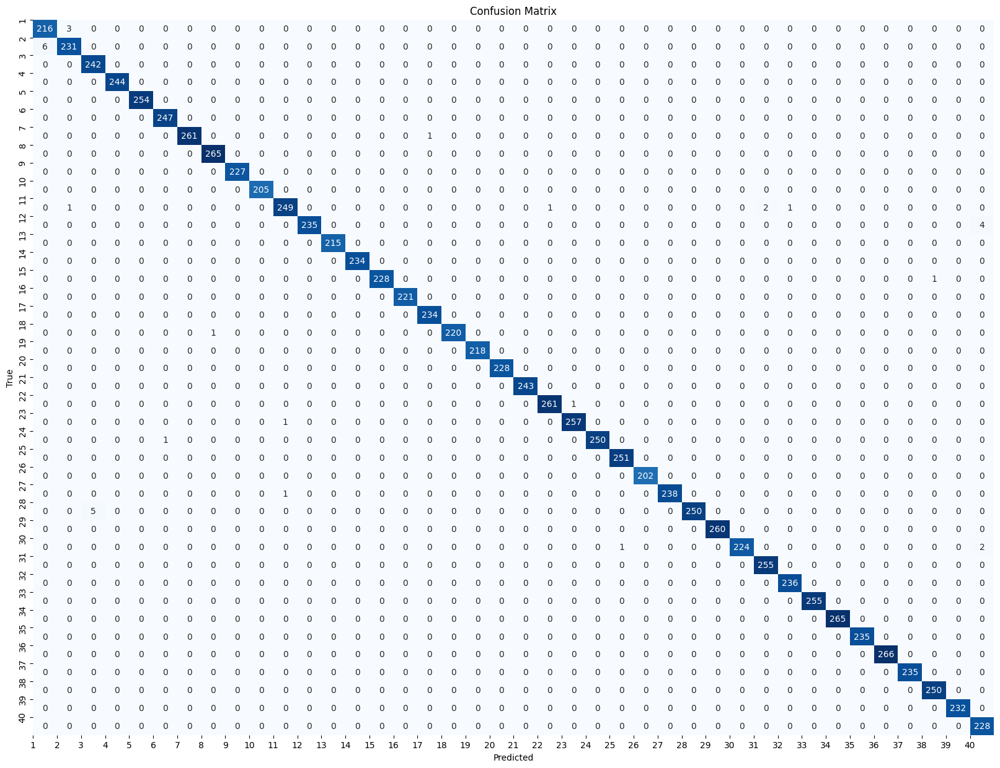

Classification Report:
              precision    recall  f1-score   support

           1       0.97      0.99      0.98       219
           2       0.98      0.97      0.98       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      1.00      1.00       227
          10       1.00      1.00      1.00       205
          11       0.99      0.98      0.99       254
          12       1.00      0.98      0.99       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

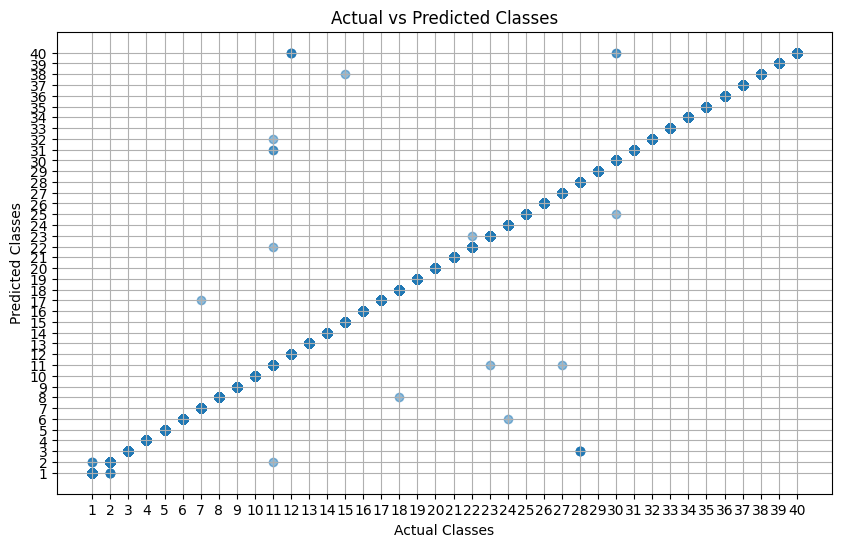

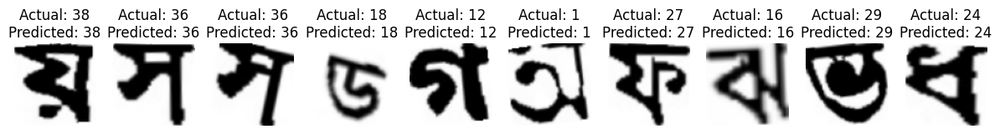

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

# Load pre-trained VGG16 model without fully connected layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

# Add custom classification layers with dropout
vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

# Merge CNN and VGG16 models
merged_model = concatenate([cnn_output, vgg_output])

# Create the final model
output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with batch size 64
batch_size = 64
print(f"Training with batch size: {batch_size}")
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Plot training and validation accuracy curves along with training and validation loss curves
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)
# Plotting actual vs predicted classes
plt.figure(figsize=(10, 6))
plt.scatter(y_test_balanced, predicted_classes, alpha=0.5)
plt.xlabel('Actual Classes')
plt.ylabel('Predicted Classes')
plt.title('Actual vs Predicted Classes')
plt.xticks(np.arange(1, 41))
plt.yticks(np.arange(1, 41))
plt.grid(True)
plt.show()
# Function to display sample images along with actual and predicted classes
def display_sample_images(images, actual_labels, predicted_labels, class_names, num_samples=10):
    plt.figure(figsize=(15, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.show()

# Display sample images with actual and predicted classes
class_names = [str(i) for i in range(0, 41)]  # Assuming your class names are numbers from 0 to 41
display_sample_images(x_test_balanced, y_test_balanced, predicted_classes, class_names)

# adam **16**

58889256/58889256 [==============================] - 2s 0us/step
Training with batch size: 16
Epoch 1/10
1330/1330 [==============================] - 30s 18ms/step - loss: 2.0267 - accuracy: 0.9415 - val_loss: 0.4019 - val_accuracy: 0.9902
Epoch 2/10
1330/1330 [==============================] - 23s 17ms/step - loss: 0.3335 - accuracy: 0.9924 - val_loss: 0.3596 - val_accuracy: 0.9821
Epoch 3/10
1330/1330 [==============================] - 24s 18ms/step - loss: 0.3288 - accuracy: 0.9896 - val_loss: 0.2851 - val_accuracy: 0.9929
Epoch 4/10
1330/1330 [==============================] - 24s 18ms/step - loss: 0.2493 - accuracy: 0.9919 - val_loss: 0.3022 - val_accuracy: 0.9866
Epoch 5/10
1330/1330 [==============================] - 24s 18ms/step - loss: 0.2678 - accuracy: 0.9900 - val_loss: 0.2787 - val_accuracy: 0.9920
Epoch 6/10
1330/1330 [==============================] - 24s 18ms/step - loss: 0.2142 - accuracy: 0.9937 - val_loss: 0.1656 - val_accuracy: 0.9982
Epoch 7/10
1330/1330 [========

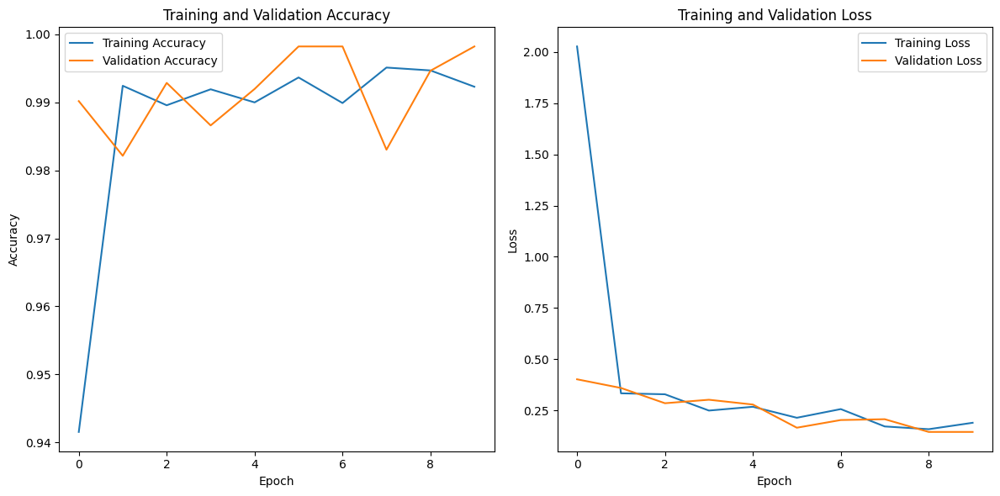

300/300 [==============================] - 7s 24ms/step
F1 Score: 0.9948267764019956


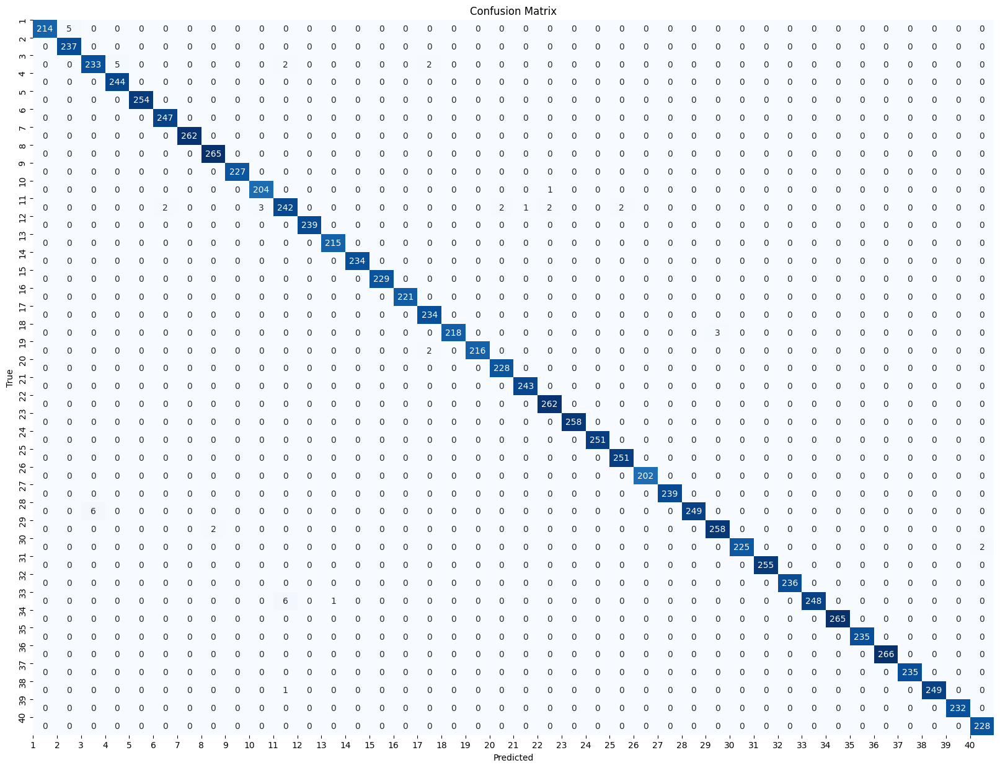

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.98      0.99       219
           2       0.98      1.00      0.99       237
           3       0.97      0.96      0.97       242
           4       0.98      1.00      0.99       244
           5       1.00      1.00      1.00       254
           6       0.99      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       0.99      1.00      1.00       265
           9       1.00      1.00      1.00       227
          10       0.99      1.00      0.99       205
          11       0.96      0.95      0.96       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       0.98      1.00      0.99       234
    

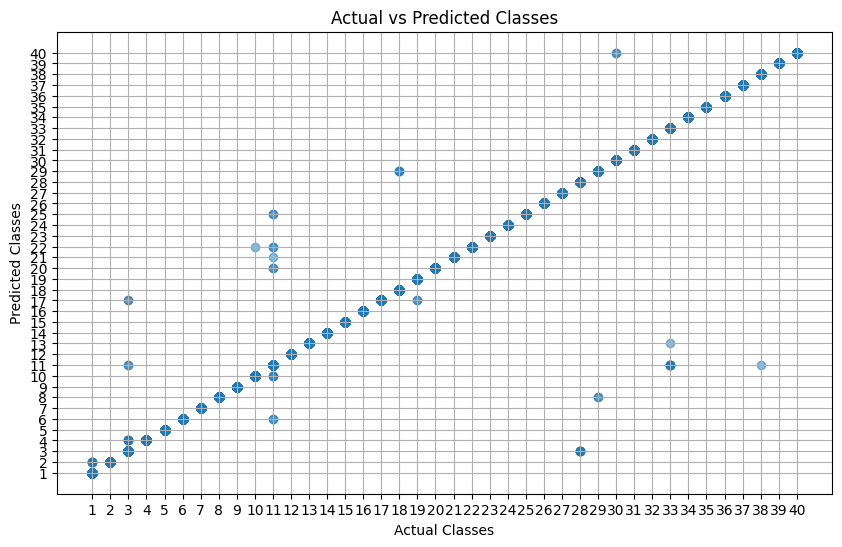

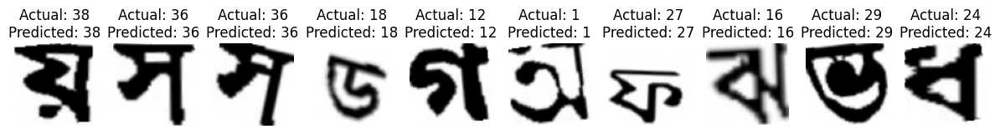

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

# Load pre-trained VGG16 model without fully connected layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

# Add custom classification layers with dropout
vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

# Merge CNN and VGG16 models
merged_model = concatenate([cnn_output, vgg_output])

# Create the final model
output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with batch size 64
batch_size = 16
print(f"Training with batch size: {batch_size}")
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Plot training and validation accuracy curves along with training and validation loss curves
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)
# Plotting actual vs predicted classes
plt.figure(figsize=(10, 6))
plt.scatter(y_test_balanced, predicted_classes, alpha=0.5)
plt.xlabel('Actual Classes')
plt.ylabel('Predicted Classes')
plt.title('Actual vs Predicted Classes')
plt.xticks(np.arange(1, 41))
plt.yticks(np.arange(1, 41))
plt.grid(True)
plt.show()
# Function to display sample images along with actual and predicted classes
def display_sample_images(images, actual_labels, predicted_labels, class_names, num_samples=10):
    plt.figure(figsize=(15, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.show()

# Display sample images with actual and predicted classes
class_names = [str(i) for i in range(0, 41)]  # Assuming your class names are numbers from 0 to 41
display_sample_images(x_test_balanced, y_test_balanced, predicted_classes, class_names)

# adam 128

Training with batch size: 128
Epoch 1/10
167/167 [==============================] - 25s 112ms/step - loss: 15.1288 - accuracy: 0.8343 - val_loss: 0.4724 - val_accuracy: 0.9955
Epoch 2/10
167/167 [==============================] - 15s 91ms/step - loss: 0.4196 - accuracy: 0.9978 - val_loss: 0.3727 - val_accuracy: 0.9955
Epoch 3/10
167/167 [==============================] - 15s 92ms/step - loss: 0.3521 - accuracy: 0.9986 - val_loss: 0.3337 - val_accuracy: 0.9964
Epoch 4/10
167/167 [==============================] - 16s 93ms/step - loss: 0.3151 - accuracy: 0.9985 - val_loss: 0.3167 - val_accuracy: 0.9902
Epoch 5/10
167/167 [==============================] - 16s 96ms/step - loss: 0.2872 - accuracy: 0.9984 - val_loss: 0.2733 - val_accuracy: 0.9964
Epoch 6/10
167/167 [==============================] - 17s 99ms/step - loss: 0.2764 - accuracy: 0.9964 - val_loss: 0.3171 - val_accuracy: 0.9821
Epoch 7/10
167/167 [==============================] - 18s 105ms/step - loss: 0.3344 - accuracy: 0.9897 -

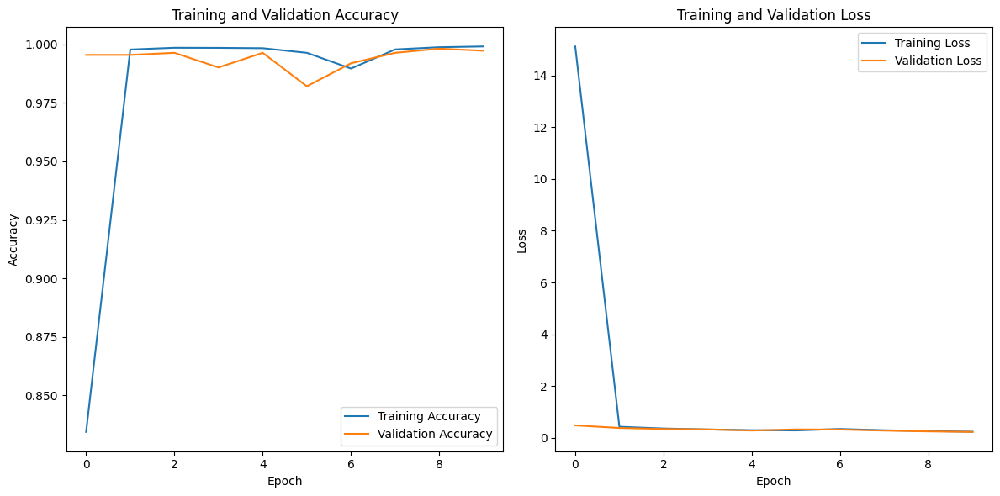

300/300 [==============================] - 8s 25ms/step
F1 Score: 0.9975913140066506


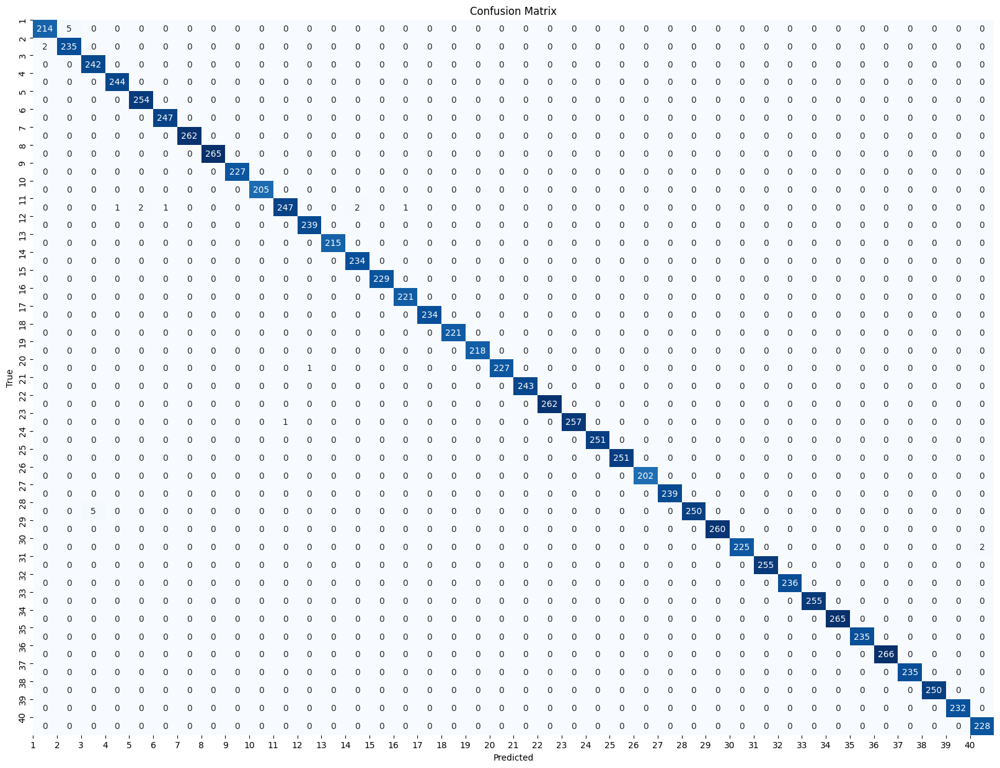

Classification Report:
              precision    recall  f1-score   support

           1       0.99      0.98      0.98       219
           2       0.98      0.99      0.99       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       0.99      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      1.00      1.00       227
          10       1.00      1.00      1.00       205
          11       1.00      0.97      0.98       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       0.99      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

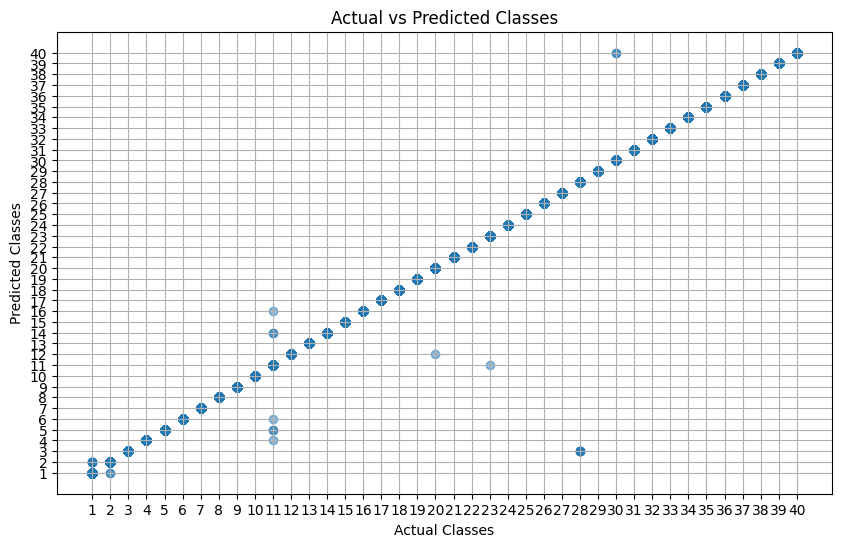

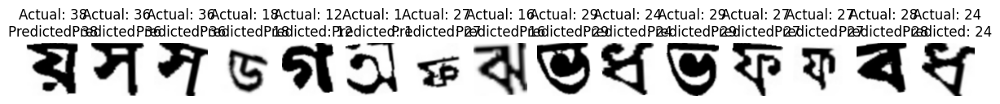

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

# Load pre-trained VGG16 model without fully connected layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

# Add custom classification layers with dropout
vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

# Merge CNN and VGG16 models
merged_model = concatenate([cnn_output, vgg_output])

# Create the final model
output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with batch size 128
batch_size = 128
print(f"Training with batch size: {batch_size}")
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Plot training and validation accuracy curves along with training and validation loss curves
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)
# Plotting actual vs predicted classes
plt.figure(figsize=(10, 6))
plt.scatter(y_test_balanced, predicted_classes, alpha=0.5)
plt.xlabel('Actual Classes')
plt.ylabel('Predicted Classes')
plt.title('Actual vs Predicted Classes')
plt.xticks(np.arange(1, 41))
plt.yticks(np.arange(1, 41))
plt.grid(True)
plt.show()
# Function to display sample images along with actual and predicted classes
def display_sample_images(images, actual_labels, predicted_labels, class_names, num_samples=15):
    plt.figure(figsize=(15, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.show()

# Display sample images with actual and predicted classes
class_names = [str(i) for i in range(0, 41)]  # Assuming your class names are numbers from 0 to 41
display_sample_images(x_test_balanced, y_test_balanced, predicted_classes, class_names)

# ADAgrad Batch size **16**

58889256/58889256 [==============================] - 0s 0us/step
Training with batch size: 16
Epoch 1/10
1330/1330 [==============================] - 29s 17ms/step - loss: 3.0177 - accuracy: 0.8859 - val_loss: 1.2857 - val_accuracy: 0.9929
Epoch 2/10
1330/1330 [==============================] - 23s 18ms/step - loss: 1.2616 - accuracy: 0.9966 - val_loss: 1.2526 - val_accuracy: 0.9955
Epoch 3/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.2318 - accuracy: 0.9986 - val_loss: 1.2264 - val_accuracy: 0.9964
Epoch 4/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.2112 - accuracy: 0.9990 - val_loss: 1.2105 - val_accuracy: 0.9955
Epoch 5/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.1929 - accuracy: 0.9988 - val_loss: 1.1905 - val_accuracy: 0.9964
Epoch 6/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.1762 - accuracy: 0.9986 - val_loss: 1.1719 - val_accuracy: 0.9973
Epoch 7/10
1330/1330 [========

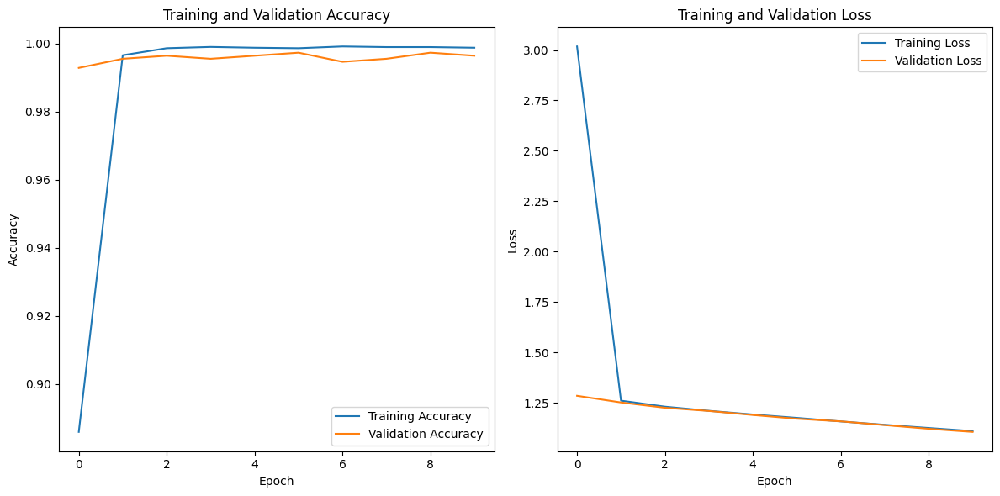

300/300 [==============================] - 7s 22ms/step
F1 Score: 0.9957495748284135


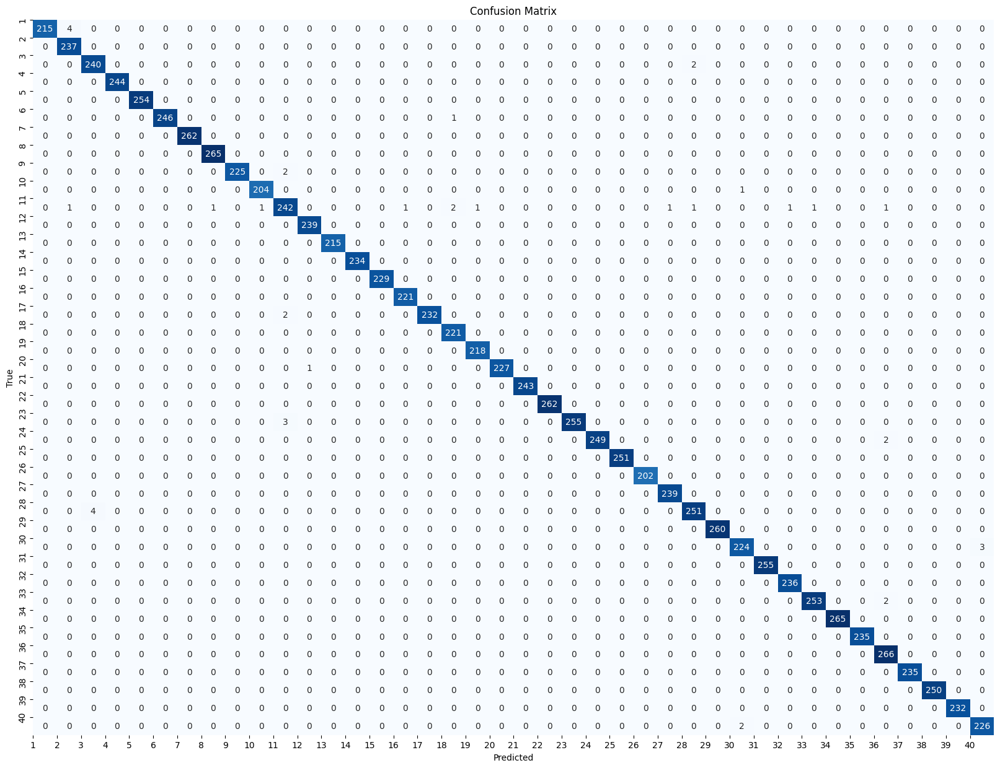

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.98      0.99       219
           2       0.98      1.00      0.99       237
           3       0.98      0.99      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      0.99      1.00       227
          10       1.00      1.00      1.00       205
          11       0.97      0.95      0.96       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      0.99      1.00       234
    

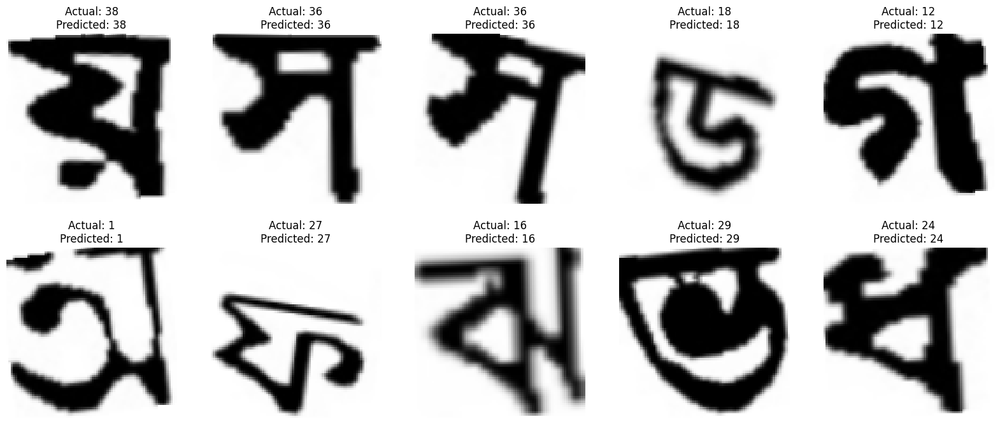

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Adagrad  # Modified optimizer
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

# Load pre-trained VGG16 model without fully connected layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

# Add custom classification layers with dropout
vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

# Merge CNN and VGG16 models
merged_model = concatenate([cnn_output, vgg_output])

# Create the final model
output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with batch size 16 and Adagrad optimizer
batch_size = 16
print(f"Training with batch size: {batch_size}")
model.compile(optimizer=Adagrad(), loss='categorical_crossentropy', metrics=['accuracy'])  # Modified optimizer

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Plot training and validation accuracy curves along with training and validation loss curves
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Function to display sample images along with actual and predicted classes
def display_sample_images(images, actual_labels, predicted_labels, class_names, num_samples=10):
    plt.figure(figsize=(20, 8))
    for i in range(num_samples):
        plt.subplot(2, num_samples//2, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.show()

# Display sample images with actual and predicted classes
class_names = [str(i) for i in range(0, 41)]  # Assuming your class names are numbers from 0 to 41
display_sample_images(x_test_balanced, y_test_balanced, predicted_classes, class_names)


### **ADAGRAD 32**


Training with optimizer: Adagrad, batch size: 32
Epoch 1/10
665/665 [==============================] - 20s 28ms/step - loss: 4.4177 - accuracy: 0.7749 - val_loss: 1.3873 - val_accuracy: 0.9688
Epoch 2/10
665/665 [==============================] - 19s 28ms/step - loss: 1.3235 - accuracy: 0.9883 - val_loss: 1.2838 - val_accuracy: 0.9929
Epoch 3/10
665/665 [==============================] - 19s 29ms/step - loss: 1.2682 - accuracy: 0.9970 - val_loss: 1.2606 - val_accuracy: 0.9946
Epoch 4/10
665/665 [==============================] - 20s 30ms/step - loss: 1.2477 - accuracy: 0.9989 - val_loss: 1.2457 - val_accuracy: 0.9955
Epoch 5/10
665/665 [==============================] - 20s 31ms/step - loss: 1.2347 - accuracy: 0.9989 - val_loss: 1.2337 - val_accuracy: 0.9982
Epoch 6/10
665/665 [==============================] - 20s 30ms/step - loss: 1.2237 - accuracy: 0.9989 - val_loss: 1.2236 - val_accuracy: 0.9973
Epoch 7/10
665/665 [==============================] - 19s 29ms/step - loss: 1.2138 - a

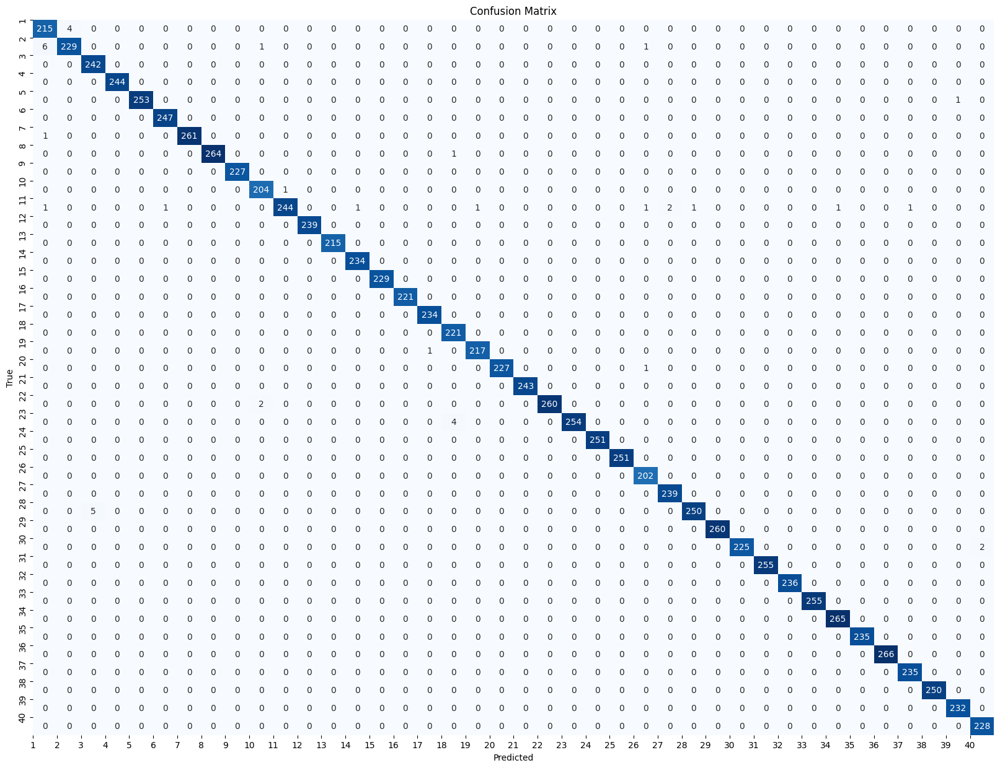

Classification Report:
              precision    recall  f1-score   support

           1       0.96      0.98      0.97       219
           2       0.98      0.97      0.97       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      1.00      1.00       227
          10       0.99      1.00      0.99       205
          11       1.00      0.96      0.98       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


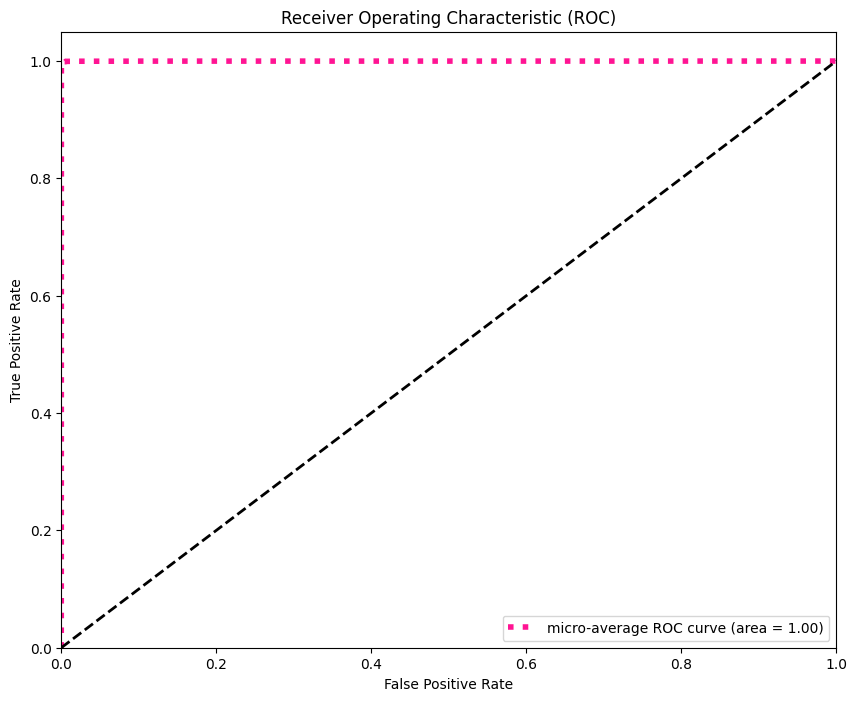

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# List of optimizers and batch sizes
optimizers = [tf.keras.optimizers.Adagrad()]
batch_sizes = [32]

# Loop through optimizers and batch sizes
for optimizer in optimizers:
    for batch_size in batch_sizes:
        print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
        model = create_compile_model(optimizer, batch_size)

        # Train the model
        history = model.fit(
            [x_train_balanced, x_train_balanced],
            y_train_encoded,
            batch_size=batch_size,
            epochs=10,
            validation_split=0.05,
            callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
        )

        # Evaluate the model
        print("Evaluating the model...")
        test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
        print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

        # Make predictions
        predictions = model.predict([x_test_balanced, x_test_balanced])
        predicted_classes = np.argmax(predictions, axis=1)

        # Calculate F1 score
        f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
        print("F1 Score:", f1)

        # Plot confusion matrix with classes indexed from 1 to 40
        cm = confusion_matrix(y_test_balanced, predicted_classes)
        plt.figure(figsize=(20, 15))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
        plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
        plt.show()

        # Generate classification report
        report = classification_report(y_test_balanced, predicted_classes)
        print("Classification Report:")
        print(report)

        # Plot ROC curve
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(num_classes):
            fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        plt.figure(figsize=(10, 8))
        plt.plot(fpr["micro"], tpr["micro"],
                 label=f'micro-average ROC curve (area = {roc_auc["micro"]:0.2f})',
                 color='deeppink', linestyle=':', linewidth=4)

        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC)')
        plt.legend(loc="lower right")
        plt.show()


# Adagrad 64


Training with optimizer: Adagrad, batch size: 64
Epoch 1/10
333/333 [==============================] - 19s 53ms/step - loss: 6.8344 - accuracy: 0.7490 - val_loss: 1.4001 - val_accuracy: 0.9696
Epoch 2/10
333/333 [==============================] - 18s 55ms/step - loss: 1.3378 - accuracy: 0.9862 - val_loss: 1.3040 - val_accuracy: 0.9911
Epoch 3/10
333/333 [==============================] - 18s 55ms/step - loss: 1.2828 - accuracy: 0.9965 - val_loss: 1.2874 - val_accuracy: 0.9929
Epoch 4/10
333/333 [==============================] - 17s 52ms/step - loss: 1.2657 - accuracy: 0.9985 - val_loss: 1.2701 - val_accuracy: 0.9937
Epoch 5/10
333/333 [==============================] - 17s 51ms/step - loss: 1.2555 - accuracy: 0.9990 - val_loss: 1.2628 - val_accuracy: 0.9946
Epoch 6/10
333/333 [==============================] - 18s 53ms/step - loss: 1.2496 - accuracy: 0.9988 - val_loss: 1.2564 - val_accuracy: 0.9946
Epoch 7/10
333/333 [==============================] - 18s 53ms/step - loss: 1.2437 - a

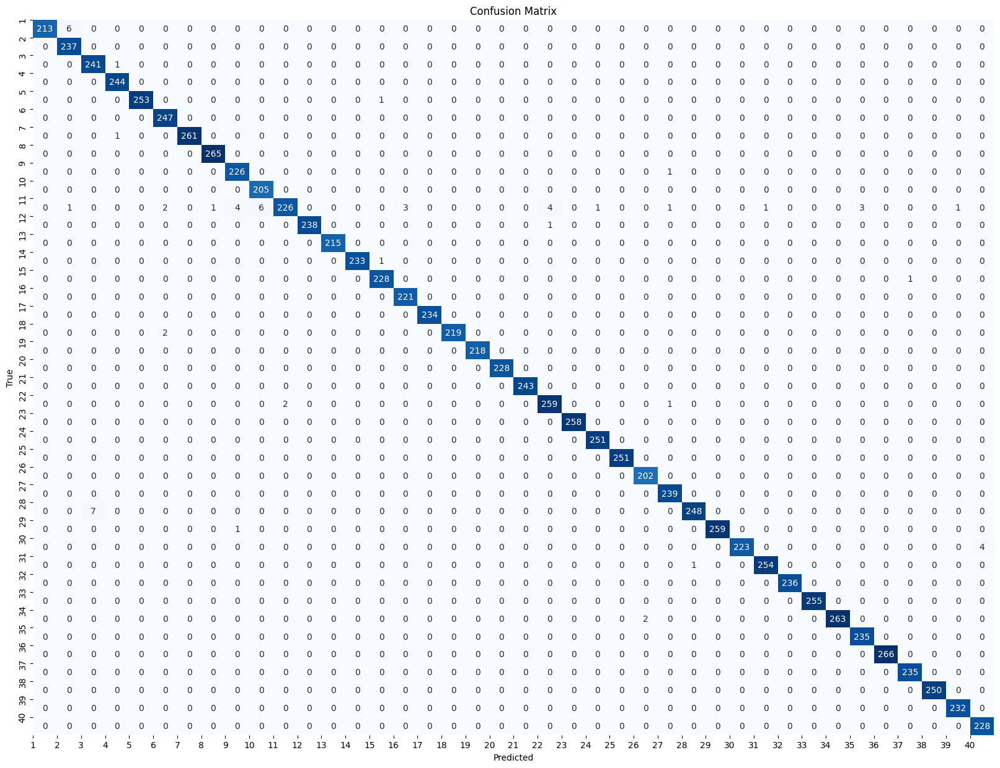

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.97      0.99       219
           2       0.97      1.00      0.99       237
           3       0.97      1.00      0.98       242
           4       0.99      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       0.98      1.00      0.99       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       0.98      1.00      0.99       227
          10       0.97      1.00      0.99       205
          11       0.99      0.89      0.94       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       0.99      1.00      0.99       229
          16       0.99      1.00      0.99       221
          17       1.00      1.00      1.00       234
    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


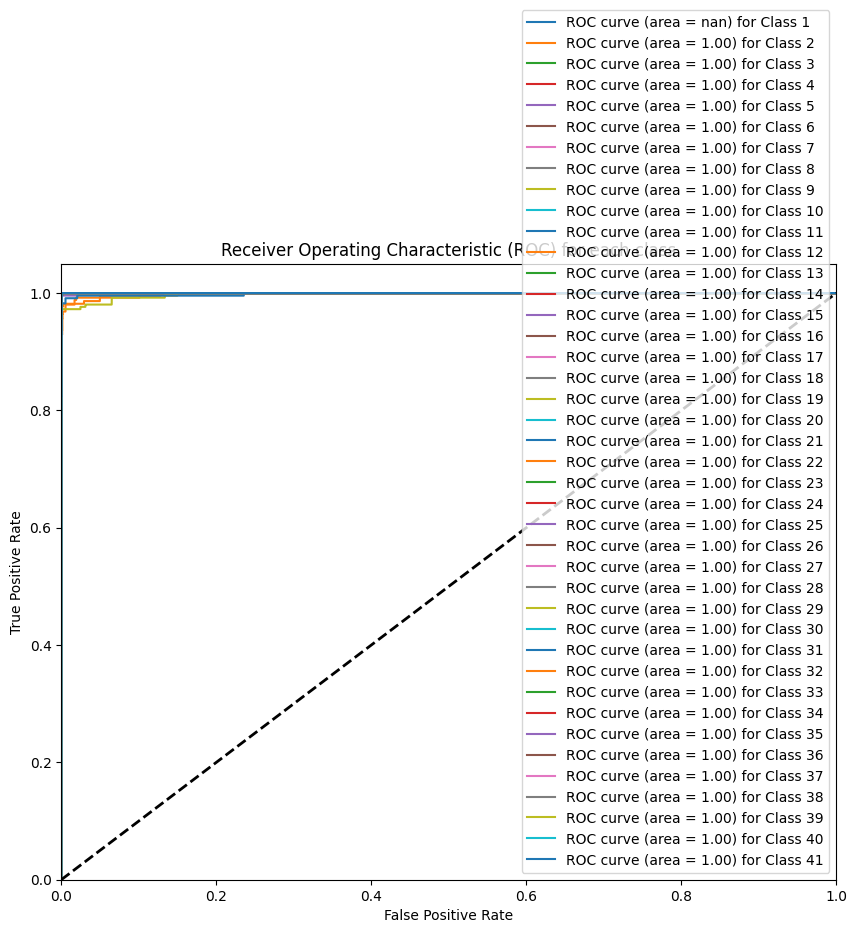

Predicted Classes for Batch Size 64: [38 36 36 ... 37 39 19]


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# List of optimizers and batch sizes
optimizers = [tf.keras.optimizers.Adagrad()]
# List of batch sizes
batch_sizes = [64]

# Loop through optimizers and batch sizes
for optimizer in optimizers:
    for batch_size in batch_sizes:
        print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
        model = create_compile_model(optimizer, batch_size)

        # Train the model
        history = model.fit(
            [x_train_balanced, x_train_balanced],
            y_train_encoded,
            batch_size=batch_size,
            epochs=10,
            validation_split=0.05,
            callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
        )

        # Evaluate the model
        print("Evaluating the model...")
        test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
        print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

        # Make predictions
        predictions = model.predict([x_test_balanced, x_test_balanced])
        predicted_classes = np.argmax(predictions, axis=1)

        # Calculate F1 score
        f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
        print("F1 Score:", f1)

        # Plot confusion matrix with classes indexed from 1 to 40
        cm = confusion_matrix(y_test_balanced, predicted_classes)
        plt.figure(figsize=(20, 15))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
        plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
        plt.show()

        # Generate classification report
        report = classification_report(y_test_balanced, predicted_classes)
        print("Classification Report:")
        print(report)

        # Plot ROC curve for each class
        plt.figure(figsize=(10, 8))
        for i in range(num_classes):
            fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i+1}')

        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) for each class')
        plt.legend(loc="lower right")
        plt.show()

        # Display predicted classes for a batch size of 64
        print("Predicted Classes for Batch Size 64:", predicted_classes)


# adagrad 128


Training with optimizer: Adagrad, batch size: 128
Epoch 1/10
167/167 [==============================] - 16s 90ms/step - loss: 15.1339 - accuracy: 0.5314 - val_loss: 1.9255 - val_accuracy: 0.8295
Epoch 2/10
167/167 [==============================] - 15s 89ms/step - loss: 1.5587 - accuracy: 0.9316 - val_loss: 1.4103 - val_accuracy: 0.9696
Epoch 3/10
167/167 [==============================] - 15s 90ms/step - loss: 1.3533 - accuracy: 0.9825 - val_loss: 1.3368 - val_accuracy: 0.9839
Epoch 4/10
167/167 [==============================] - 15s 91ms/step - loss: 1.3043 - accuracy: 0.9927 - val_loss: 1.3343 - val_accuracy: 0.9804
Epoch 5/10
167/167 [==============================] - 16s 93ms/step - loss: 1.2834 - accuracy: 0.9962 - val_loss: 1.2884 - val_accuracy: 0.9929
Epoch 6/10
167/167 [==============================] - 16s 94ms/step - loss: 1.2709 - accuracy: 0.9977 - val_loss: 1.2781 - val_accuracy: 0.9929
Epoch 7/10
167/167 [==============================] - 16s 94ms/step - loss: 1.2637 -

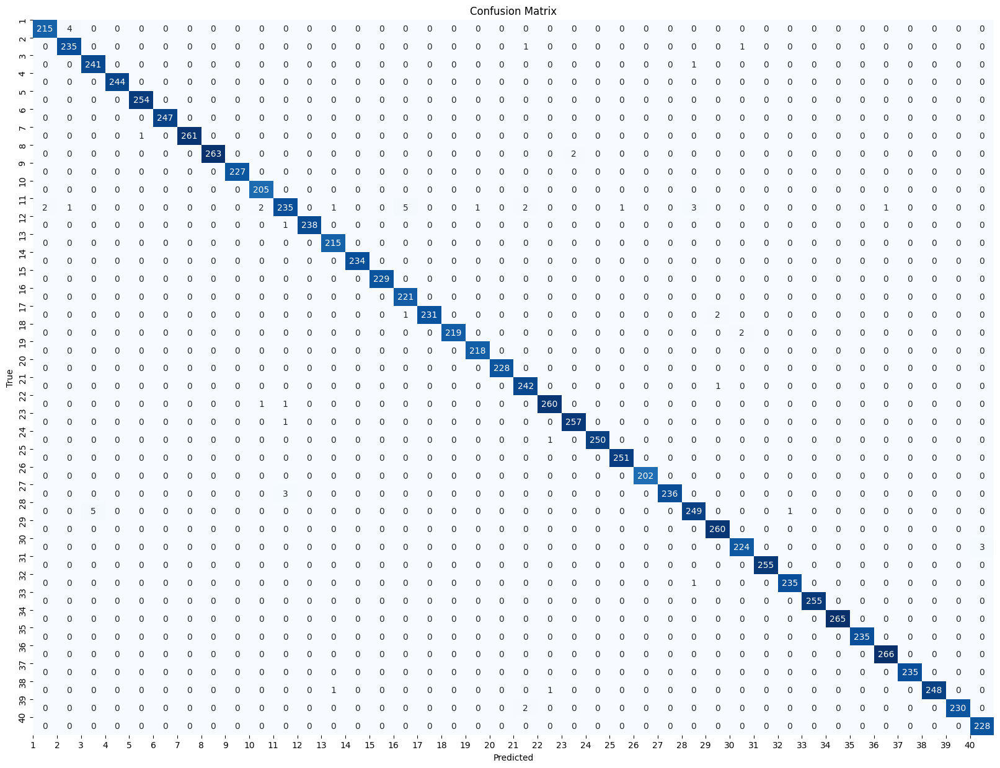

Classification Report:
              precision    recall  f1-score   support

           1       0.99      0.98      0.99       219
           2       0.98      0.99      0.99       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      0.99      1.00       265
           9       1.00      1.00      1.00       227
          10       0.99      1.00      0.99       205
          11       0.98      0.93      0.95       254
          12       1.00      1.00      1.00       239
          13       0.99      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       0.97      1.00      0.99       221
          17       1.00      0.99      0.99       234
    

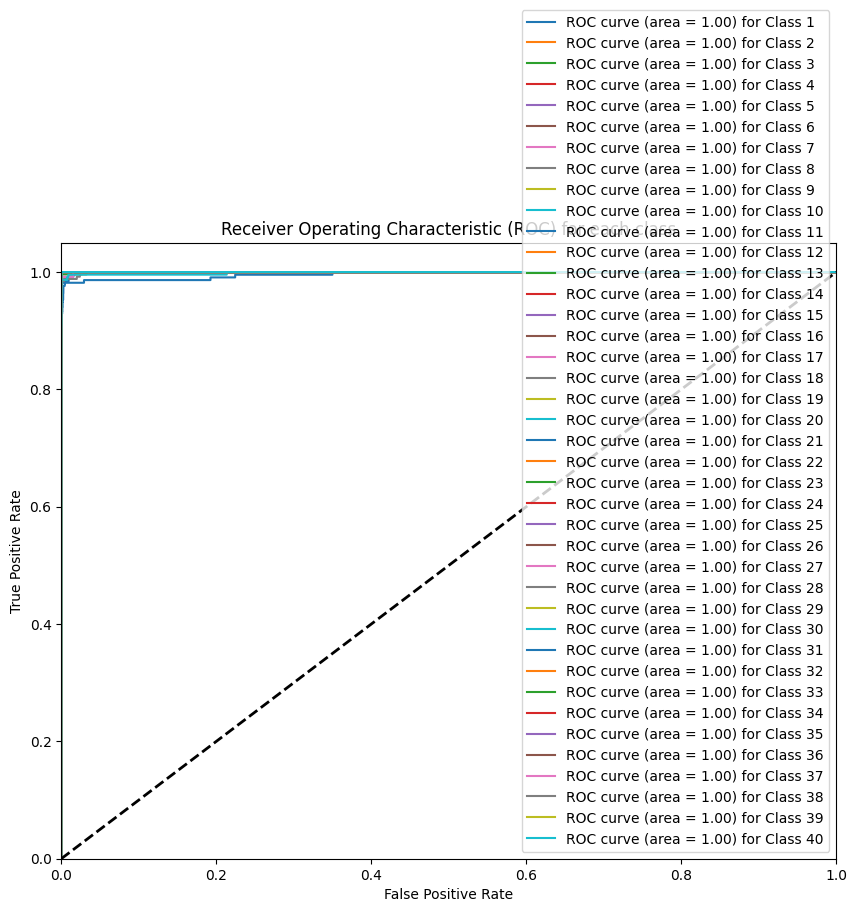

Predicted Classes for Batch Size 64: [38 36 36 ... 37 39 19]


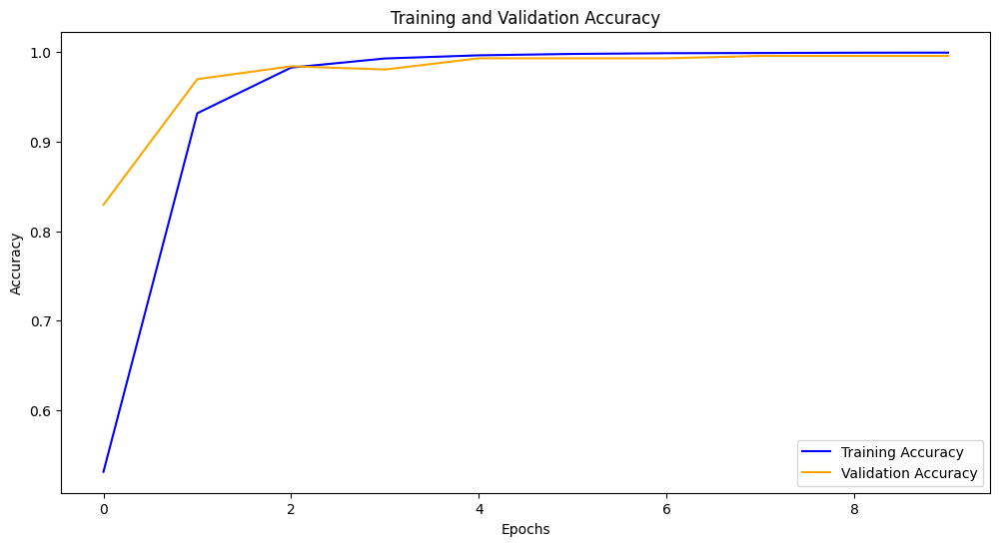

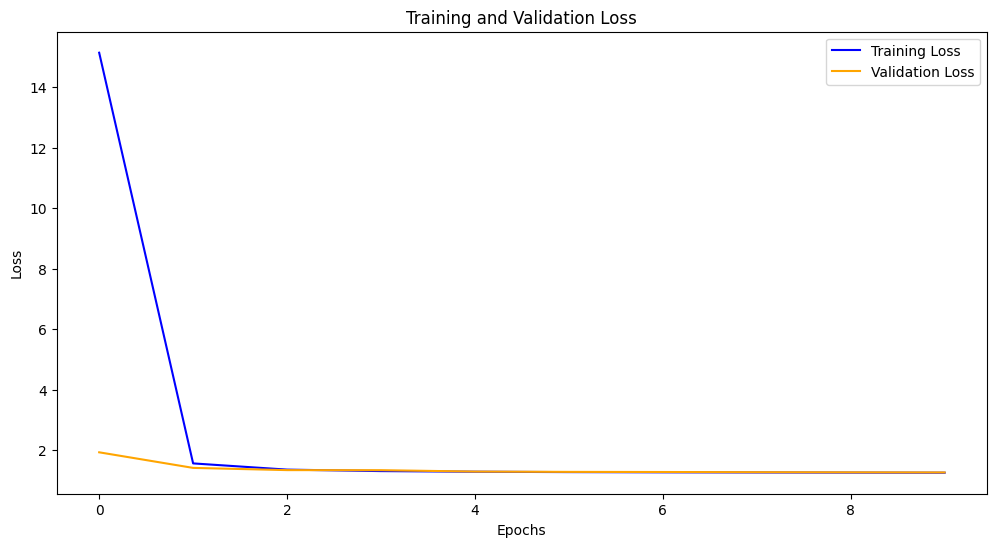

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# List of optimizers and batch sizes
optimizers = [tf.keras.optimizers.Adagrad()]
# List of batch sizes
batch_sizes = [128]

# Loop through optimizers and batch sizes
for optimizer in optimizers:
    for batch_size in batch_sizes:
        print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
        model = create_compile_model(optimizer, batch_size)

        # Train the model
        history = model.fit(
            [x_train_balanced, x_train_balanced],
            y_train_encoded,
            batch_size=batch_size,
            epochs=10,
            validation_split=0.05,
            callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
        )

        # Evaluate the model
        print("Evaluating the model...")
        test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
        print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

        # Make predictions
        predictions = model.predict([x_test_balanced, x_test_balanced])
        predicted_classes = np.argmax(predictions, axis=1)

        # Calculate F1 score
        f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
        print("F1 Score:", f1)

        # Plot confusion matrix with classes indexed from 1 to 40
        cm = confusion_matrix(y_test_balanced, predicted_classes)
        plt.figure(figsize=(20, 15))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
        plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
        plt.show()

        # Generate classification report
        report = classification_report(y_test_balanced, predicted_classes)
        print("Classification Report:")
        print(report)

        # Plot ROC curve for each class
        plt.figure(figsize=(10, 8))
        for i in range(1, num_classes):
            fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i}')

        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) for each class')
        plt.legend(loc="lower right")
        plt.show()

        # Display predicted classes for a batch size of 64
        print("Predicted Classes for Batch Size 64:", predicted_classes)

        # Plot training and validation accuracy curves
        train_accuracy = history.history['accuracy']
        val_accuracy = history.history['val_accuracy']
        plt.figure(figsize=(12, 6))
        plt.plot(train_accuracy, label='Training Accuracy', color='blue')
        plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.show()

        # Plot training and validation loss curves
        train_loss = history.history['loss']
        val_loss = history.history['val_loss']
        plt.figure(figsize=(12, 6))
        plt.plot(train_loss, label='Training Loss', color='blue')
        plt.plot(val_loss, label='Validation Loss', color='orange')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()


# Adagrad 16


Training with optimizer: Adagrad, batch size: 16
Epoch 1/10
1330/1330 [==============================] - 25s 18ms/step - loss: 2.4401 - accuracy: 0.8825 - val_loss: 1.3069 - val_accuracy: 0.9848
Epoch 2/10
1330/1330 [==============================] - 23s 18ms/step - loss: 1.2643 - accuracy: 0.9960 - val_loss: 1.2553 - val_accuracy: 0.9937
Epoch 3/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.2287 - accuracy: 0.9988 - val_loss: 1.2347 - val_accuracy: 0.9929
Epoch 4/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.2074 - accuracy: 0.9991 - val_loss: 1.2113 - val_accuracy: 0.9929
Epoch 5/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.1882 - accuracy: 0.9991 - val_loss: 1.1924 - val_accuracy: 0.9929
Epoch 6/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.1699 - accuracy: 0.9990 - val_loss: 1.1738 - val_accuracy: 0.9929
Epoch 7/10
1330/1330 [==============================] - 25s 19ms/step - lo

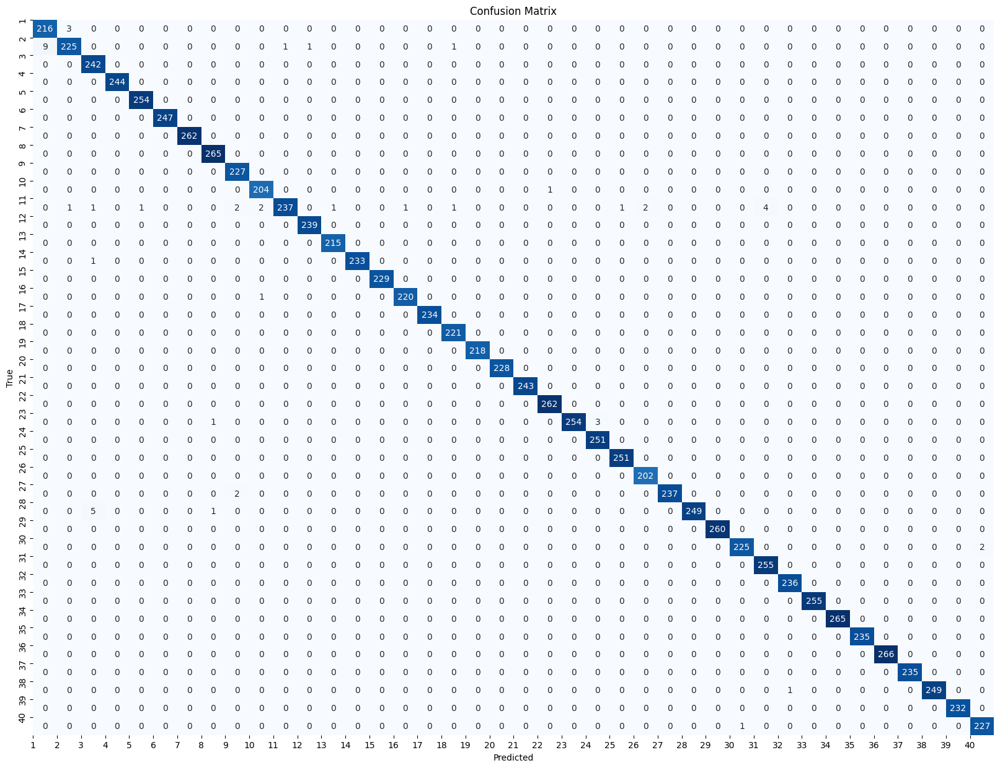

Classification Report:
              precision    recall  f1-score   support

           1       0.96      0.99      0.97       219
           2       0.98      0.95      0.97       237
           3       0.97      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       0.99      1.00      1.00       265
           9       0.98      1.00      0.99       227
          10       0.99      1.00      0.99       205
          11       1.00      0.93      0.96       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


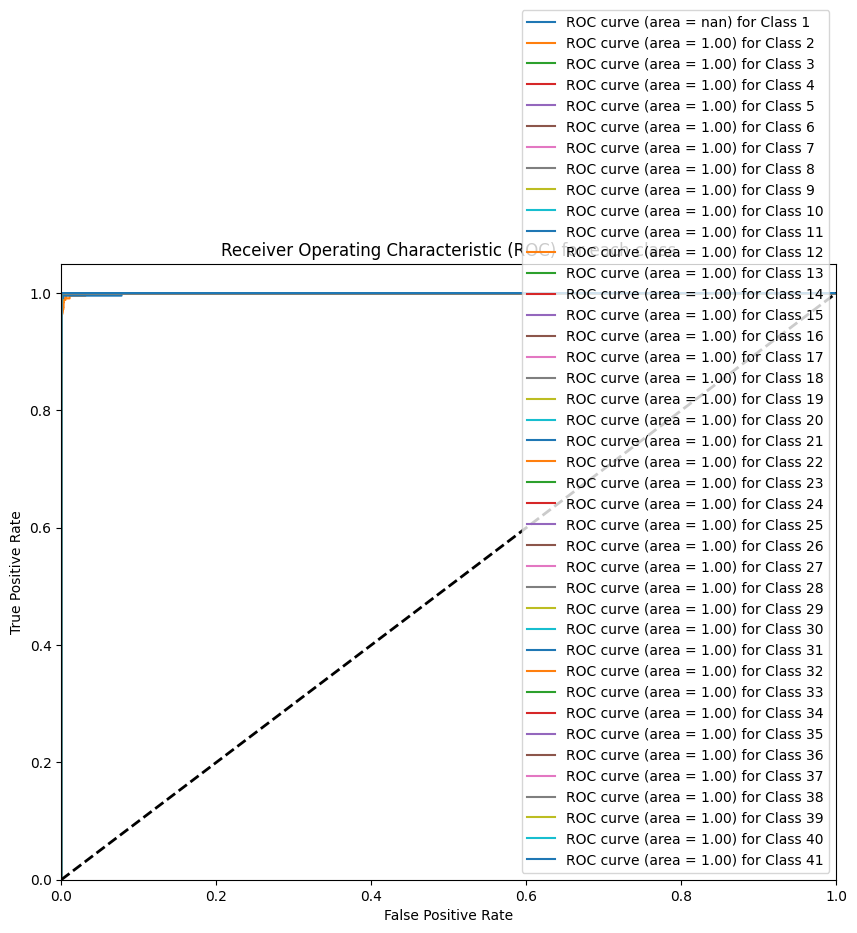

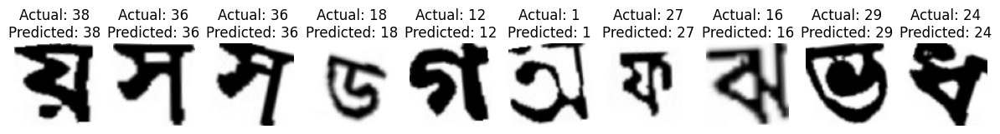


Training with optimizer: Adagrad, batch size: 128
Epoch 1/10


StagingError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/optimizer.py", line 225, in _update_step_xla  *
        return self._update_step(gradient, variable)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/optimizer.py", line 233, in _update_step  **
        raise KeyError(

    KeyError: 'The optimizer cannot recognize variable conv2d_24/kernel:0. This usually means you are trying to call the optimizer to update different parts of the model separately. Please call `optimizer.build(variables)` with the full list of trainable variables before the training loop or use legacy optimizer `tf.keras.optimizers.legacy.Adagrad.'


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# List of optimizers and batch sizes
optimizers = [tf.keras.optimizers.Adagrad()]
# List of batch sizes
# List of batch sizes
batch_sizes = [16]

# Loop through optimizers and batch sizes
for optimizer in optimizers:
    for batch_size in batch_sizes:
        print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
        model = create_compile_model(optimizer, batch_size)

        # Train the model
        history = model.fit(
            [x_train_balanced, x_train_balanced],
            y_train_encoded,
            batch_size=batch_size,
            epochs=10,
            validation_split=0.05,
            callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
        )

        # Evaluate the model
        print("Evaluating the model...")
        test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
        print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

        # Make predictions
        predictions = model.predict([x_test_balanced, x_test_balanced])
        predicted_classes = np.argmax(predictions, axis=1)

        # Calculate F1 score
        f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
        print("F1 Score:", f1)

        # Plot confusion matrix with classes indexed from 1 to 40
        cm = confusion_matrix(y_test_balanced, predicted_classes)
        plt.figure(figsize=(20, 15))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
        plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
        plt.show()

        # Generate classification report
        report = classification_report(y_test_balanced, predicted_classes)
        print("Classification Report:")
        print(report)

        # Plot ROC curve for each class
        plt.figure(figsize=(10, 8))
        for i in range(num_classes):
            fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i+1}')

        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) for each class')
        plt.legend(loc="lower right")
        plt.show()

        # Display sample images with actual and predicted classes
        def display_sample_images(images, actual_labels, predicted_labels, class_names, num_samples=10):
            plt.figure(figsize=(15, 8))
            for i in range(num_samples):
                plt.subplot(1, num_samples, i+1)
                plt.imshow(images[i])
                plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
                plt.axis('off')
            plt.show()

        # Display sample images
        display_sample_images(x_test_balanced, y_test_balanced, predicted_classes, class_names)


# SGD bt size 32


Training with optimizer: SGD, batch size: 32
Epoch 1/10
665/665 [==============================] - 20s 28ms/step - loss: 3769012231945729628700672.0000 - accuracy: 0.0490 - val_loss: 3.4583 - val_accuracy: 0.0491
Epoch 2/10
665/665 [==============================] - 19s 28ms/step - loss: 3.4129 - accuracy: 0.0612 - val_loss: 3.3080 - val_accuracy: 0.0839
Epoch 3/10
665/665 [==============================] - 19s 28ms/step - loss: 3.2678 - accuracy: 0.0993 - val_loss: 3.2706 - val_accuracy: 0.0616
Epoch 4/10
665/665 [==============================] - 18s 28ms/step - loss: 3.2633 - accuracy: 0.0806 - val_loss: 3.1883 - val_accuracy: 0.0875
Epoch 5/10
665/665 [==============================] - 18s 28ms/step - loss: 3.2844 - accuracy: 0.0858 - val_loss: 3.1647 - val_accuracy: 0.0857
Epoch 6/10
665/665 [==============================] - 18s 28ms/step - loss: 3.2094 - accuracy: 0.0878 - val_loss: 3.3085 - val_accuracy: 0.0759
Epoch 7/10
665/665 [==============================] - 18s 28ms/ste

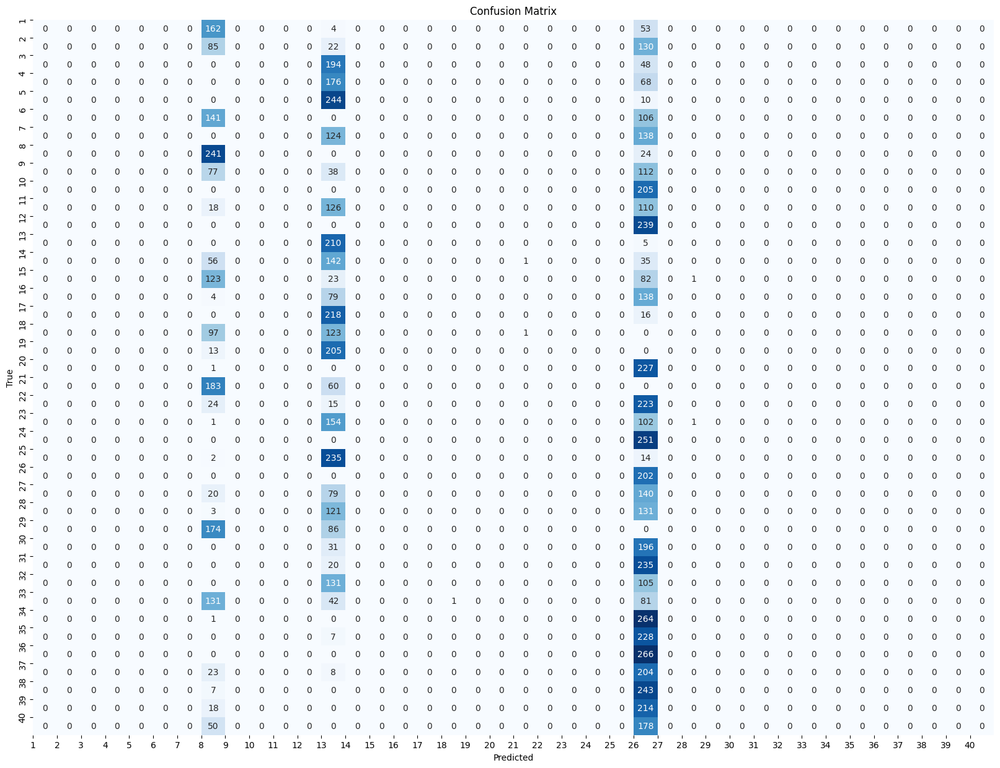

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       219
           2       0.00      0.00      0.00       237
           3       0.00      0.00      0.00       242
           4       0.00      0.00      0.00       244
           5       0.00      0.00      0.00       254
           6       0.00      0.00      0.00       247
           7       0.00      0.00      0.00       262
           8       0.15      0.91      0.25       265
           9       0.00      0.00      0.00       227
          10       0.00      0.00      0.00       205
          11       0.00      0.00      0.00       254
          12       0.00      0.00      0.00       239
          13       0.07      0.98      0.13       215
          14       0.00      0.00      0.00       234
          15       0.00      0.00      0.00       229
          16       0.00      0.00      0.00       221
          17       0.00      0.00      0.00       234
    

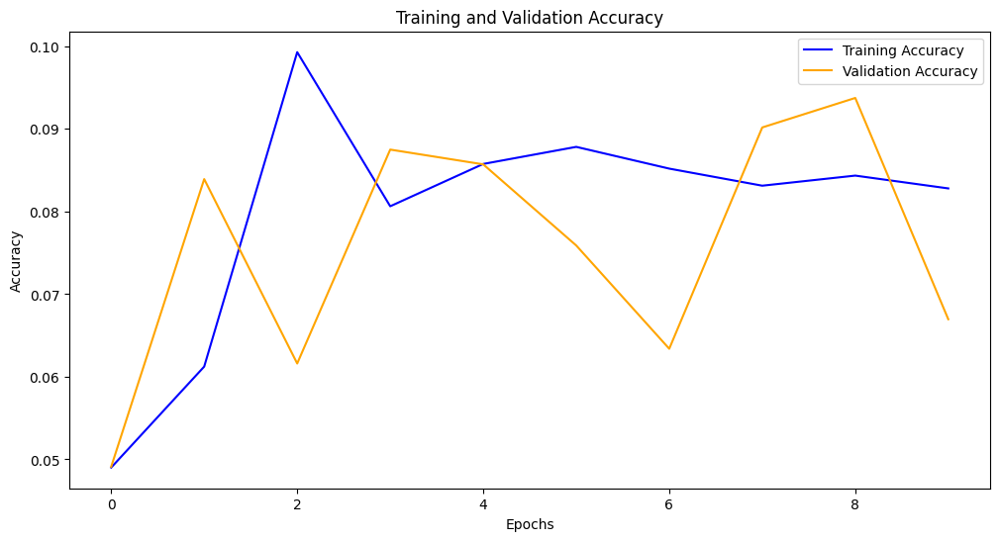

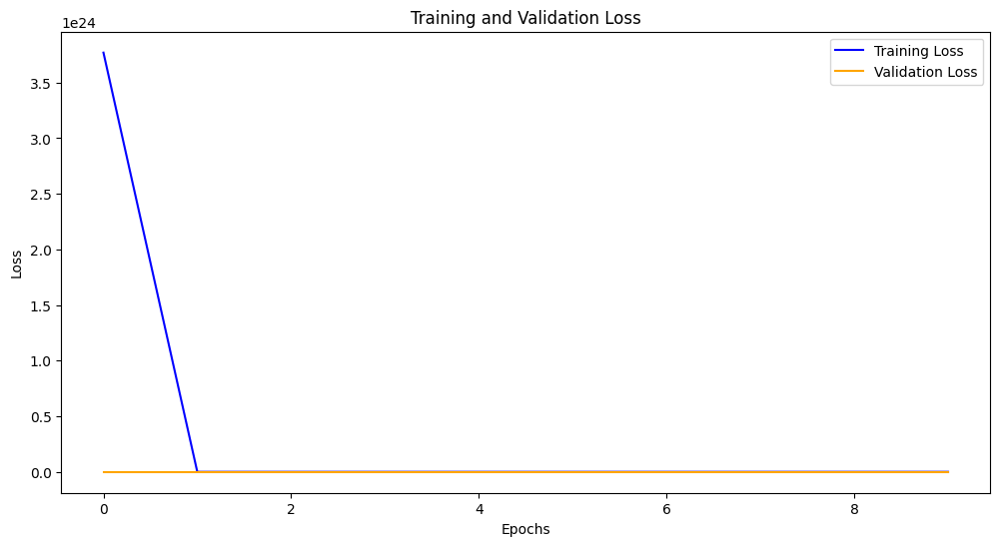

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from keras.optimizers import SGD
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu')(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu')(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu')(vgg_output)
    vgg_output = Dense(num_classes, activation='softmax')(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax')(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define SGD optimizer with tuned learning rate and momentum
optimizer = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
batch_size = 32

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
model = create_compile_model(optimizer, batch_size)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# sgd 32 epoch high


Training with optimizer: SGD
Epoch 1/30
350/350 [==============================] - 20s 52ms/step - loss: 7647411350405547684790272.0000 - accuracy: 0.1196 - val_loss: 3.6133 - val_accuracy: 0.1725
Epoch 2/30
350/350 [==============================] - 18s 50ms/step - loss: 3.5844 - accuracy: 0.1880 - val_loss: 3.5568 - val_accuracy: 0.1973
Epoch 3/30
350/350 [==============================] - 18s 50ms/step - loss: 3.5262 - accuracy: 0.2192 - val_loss: 3.4996 - val_accuracy: 0.2333
Epoch 4/30
350/350 [==============================] - 17s 49ms/step - loss: 3.4678 - accuracy: 0.2304 - val_loss: 3.4421 - val_accuracy: 0.2345
Epoch 5/30
350/350 [==============================] - 17s 49ms/step - loss: 3.4077 - accuracy: 0.2307 - val_loss: 3.3824 - val_accuracy: 0.2333
Epoch 6/30
350/350 [==============================] - 17s 49ms/step - loss: 3.3486 - accuracy: 0.2311 - val_loss: 3.3217 - val_accuracy: 0.2406
Epoch 7/30
350/350 [==============================] - 17s 50ms/step - loss: 3.2886

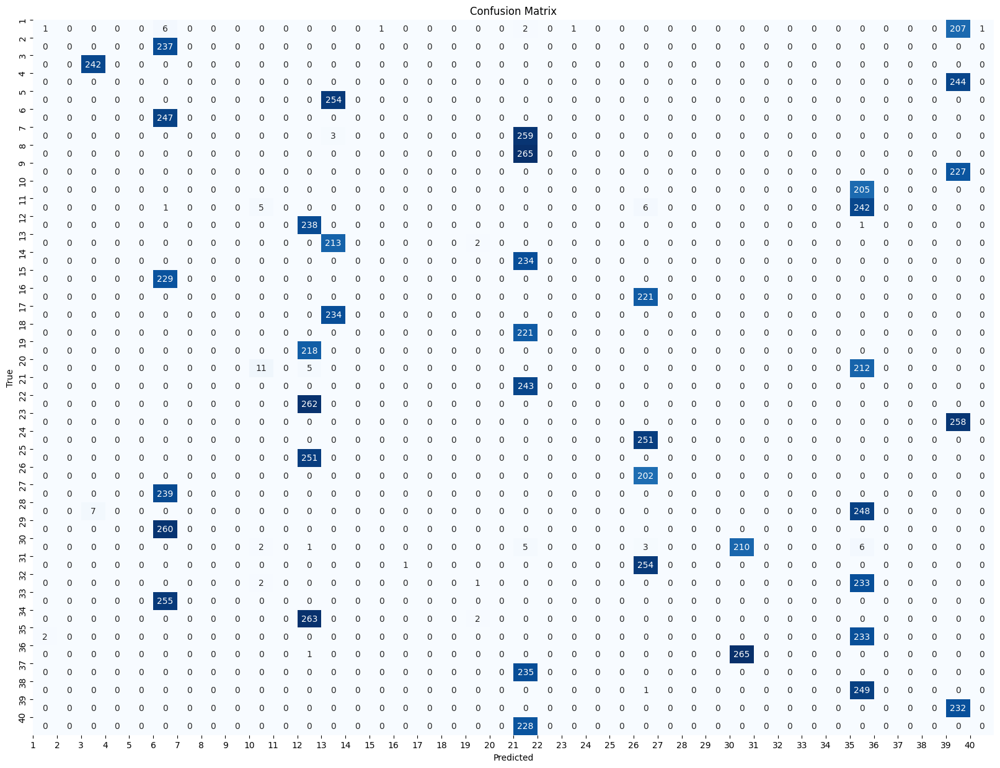

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

           1       0.33      0.00      0.01       219
           2       0.00      0.00      0.00       237
           3       0.97      1.00      0.99       242
           4       0.00      0.00      0.00       244
           5       0.00      0.00      0.00       254
           6       0.17      1.00      0.29       247
           7       0.00      0.00      0.00       262
           8       0.00      0.00      0.00       265
           9       0.00      0.00      0.00       227
          10       0.00      0.00      0.00       205
          11       0.00      0.00      0.00       254
          12       0.19      1.00      0.32       239
          13       0.30      0.99      0.46       215
          14       0.00      0.00      0.00       234
          15       0.00      0.00      0.00       229
          16       0.00      0.00      0.00       221
          17       0.00      0.00      0.00       234
    

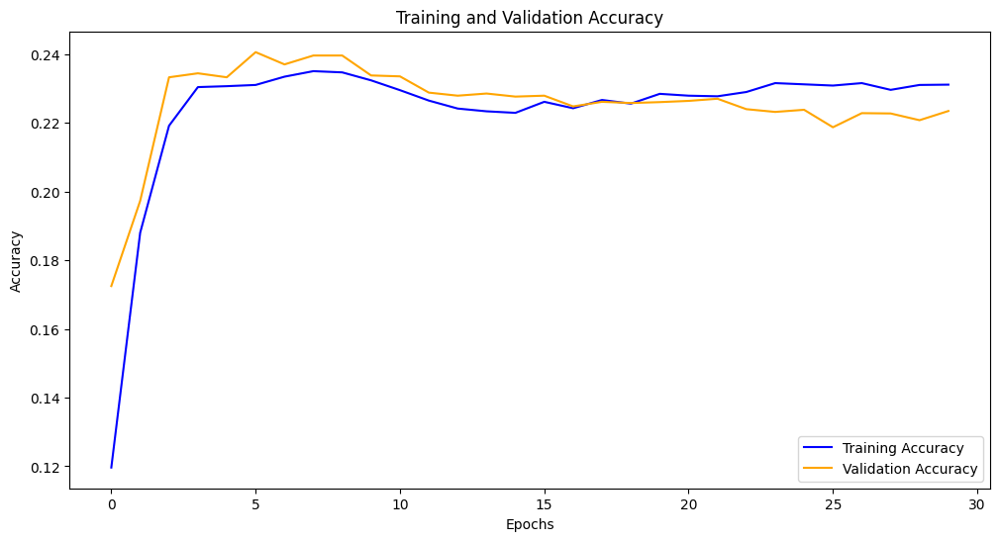

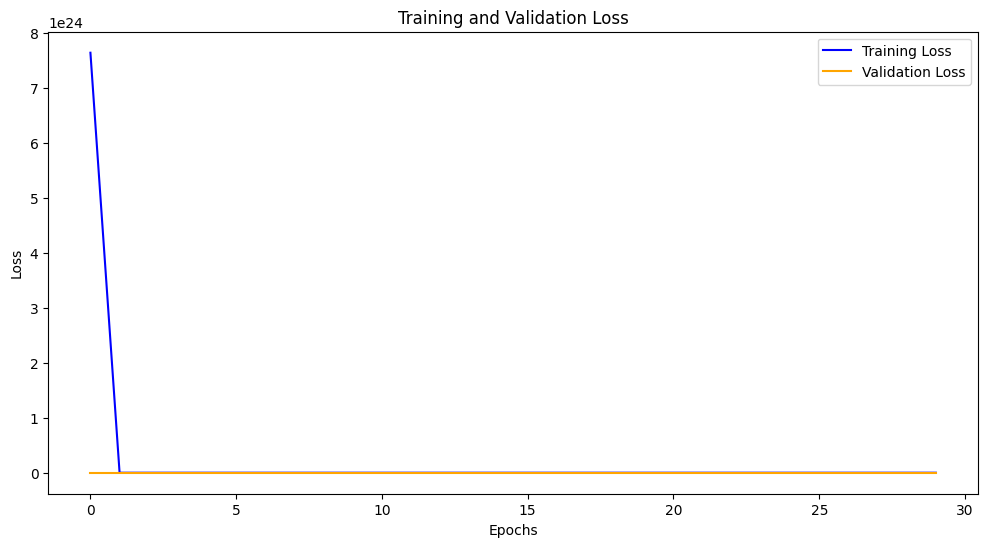

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu')(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu')(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom classification layers
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu')(vgg_output)
    vgg_output = Dense(num_classes, activation='softmax')(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax')(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define SGD optimizer with tuned learning rate and momentum
optimizer = SGD()

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}")
model = create_compile_model(optimizer)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=32,
    epochs=30,
    validation_split=0.5,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# SGD 64


Training with optimizer: SGD
Epoch 1/10
175/175 [==============================] - 18s 93ms/step - loss: 66521002106702806460137472.0000 - accuracy: 0.0467 - val_loss: 3.6441 - val_accuracy: 0.0668
Epoch 2/10
175/175 [==============================] - 15s 88ms/step - loss: 3.6280 - accuracy: 0.1047 - val_loss: 3.6146 - val_accuracy: 0.1270
Epoch 3/10
175/175 [==============================] - 15s 88ms/step - loss: 3.6003 - accuracy: 0.1500 - val_loss: 3.5883 - val_accuracy: 0.1561
Epoch 4/10
175/175 [==============================] - 15s 87ms/step - loss: 3.5735 - accuracy: 0.1716 - val_loss: 3.5632 - val_accuracy: 0.1764
Epoch 5/10
175/175 [==============================] - 15s 87ms/step - loss: 3.5468 - accuracy: 0.1970 - val_loss: 3.5370 - val_accuracy: 0.2020
Epoch 6/10
175/175 [==============================] - 15s 86ms/step - loss: 3.5201 - accuracy: 0.2143 - val_loss: 3.5096 - val_accuracy: 0.2329
Epoch 7/10
175/175 [==============================] - 15s 87ms/step - loss: 3.492

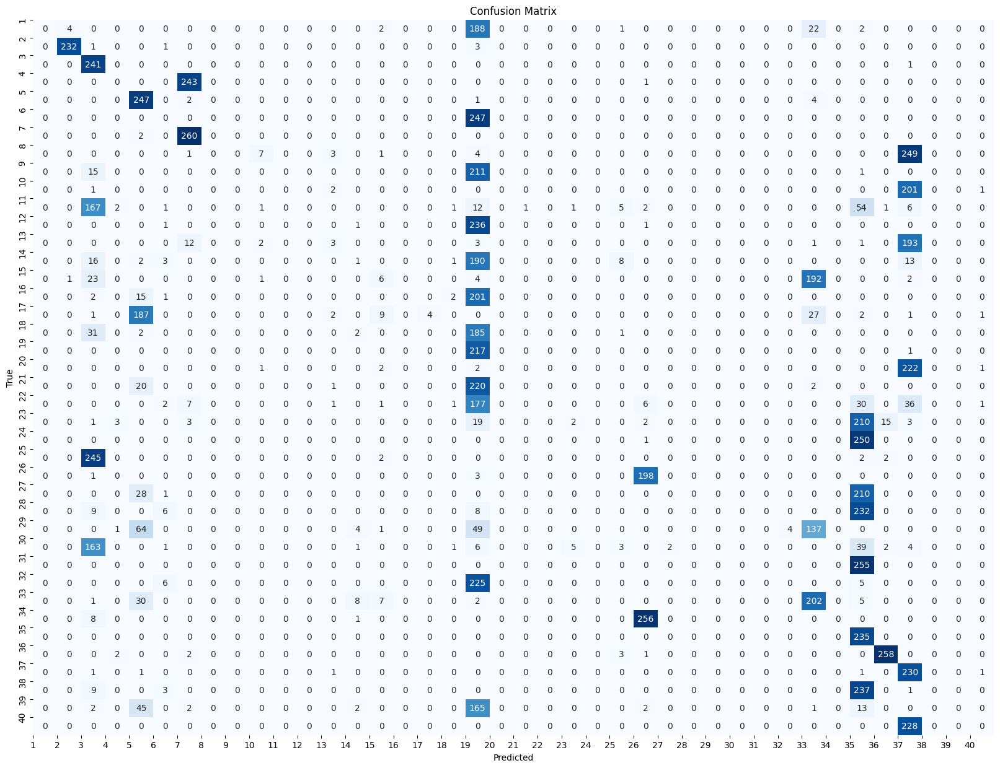

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       219
           2       0.98      0.98      0.98       237
           3       0.26      1.00      0.41       242
           4       0.00      0.00      0.00       244
           5       0.38      0.97      0.55       254
           6       0.00      0.00      0.00       247
           7       0.49      0.99      0.65       262
           8       0.00      0.00      0.00       265
           9       0.00      0.00      0.00       227
          10       0.00      0.00      0.00       205
          11       0.00      0.00      0.00       254
          12       0.00      0.00      0.00       239
          13       0.23      0.01      0.03       215
          14       0.05      0.00      0.01       234
          15       0.19      0.03      0.05       229
          16       0.00      0.00      0.00       221
          17       1.00      0.02      0.03       234
    

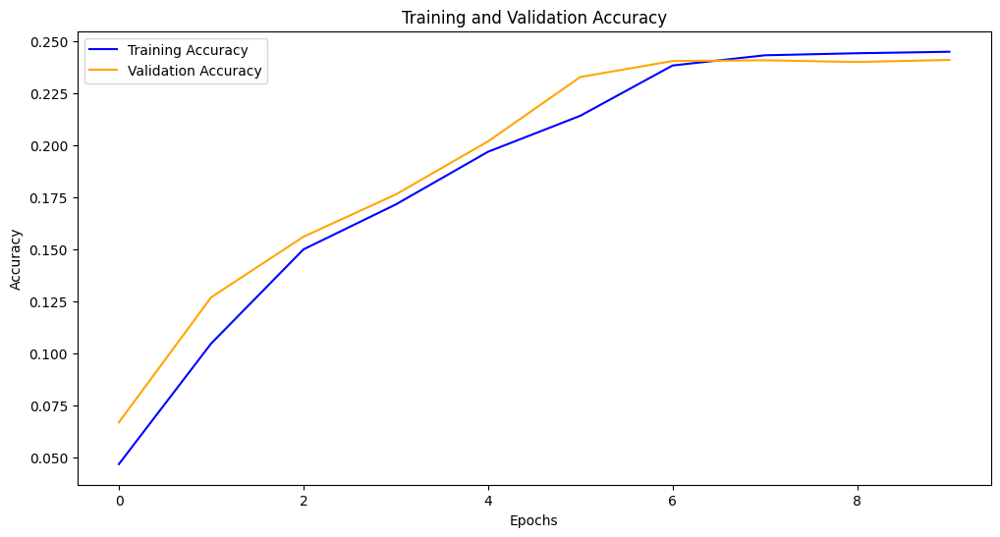

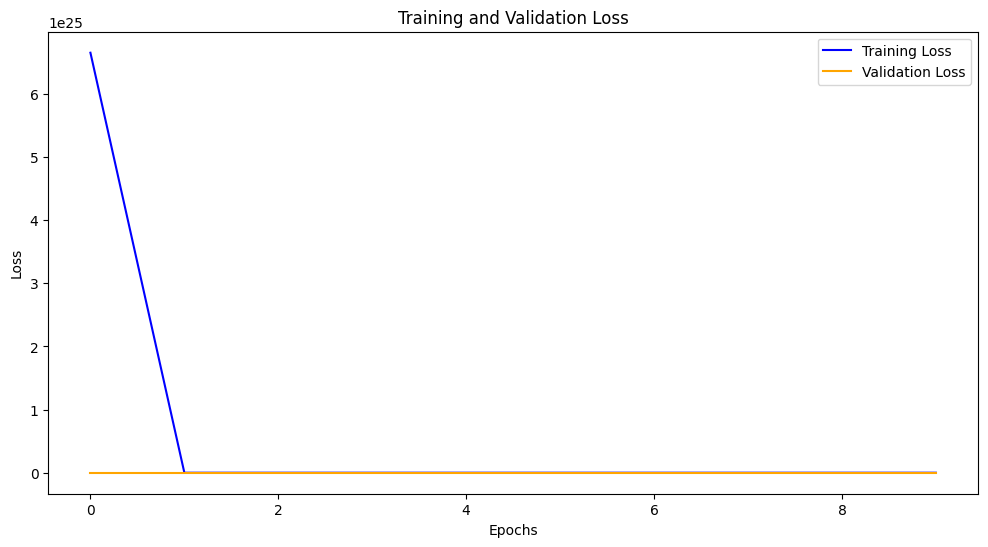

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu')(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu')(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom classification layers
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu')(vgg_output)
    vgg_output = Dense(num_classes, activation='softmax')(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax')(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define SGD optimizer with tuned learning rate and momentum
optimizer = SGD()

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}")
model = create_compile_model(optimizer)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=64,  # Changed batch size to 64
    epochs=10,
    validation_split=0.5,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy batch size 64', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


#sgd 128


Training with optimizer: SGD
Epoch 1/10
88/88 [==============================] - 16s 165ms/step - loss: 1810936318918656.0000 - accuracy: 0.0427 - val_loss: 3.6682 - val_accuracy: 0.0642
Epoch 2/10
88/88 [==============================] - 13s 152ms/step - loss: 3.6547 - accuracy: 0.0919 - val_loss: 3.6447 - val_accuracy: 0.1137
Epoch 3/10
88/88 [==============================] - 13s 153ms/step - loss: 3.6320 - accuracy: 0.1433 - val_loss: 3.6247 - val_accuracy: 0.1535
Epoch 4/10
88/88 [==============================] - 14s 155ms/step - loss: 3.6129 - accuracy: 0.1675 - val_loss: 3.6073 - val_accuracy: 0.1674
Epoch 5/10
88/88 [==============================] - 14s 155ms/step - loss: 3.5967 - accuracy: 0.1784 - val_loss: 3.5924 - val_accuracy: 0.1754
Epoch 6/10
88/88 [==============================] - 14s 158ms/step - loss: 3.5811 - accuracy: 0.1906 - val_loss: 3.5781 - val_accuracy: 0.1848
Epoch 7/10
88/88 [==============================] - 14s 161ms/step - loss: 3.5660 - accuracy: 0.1

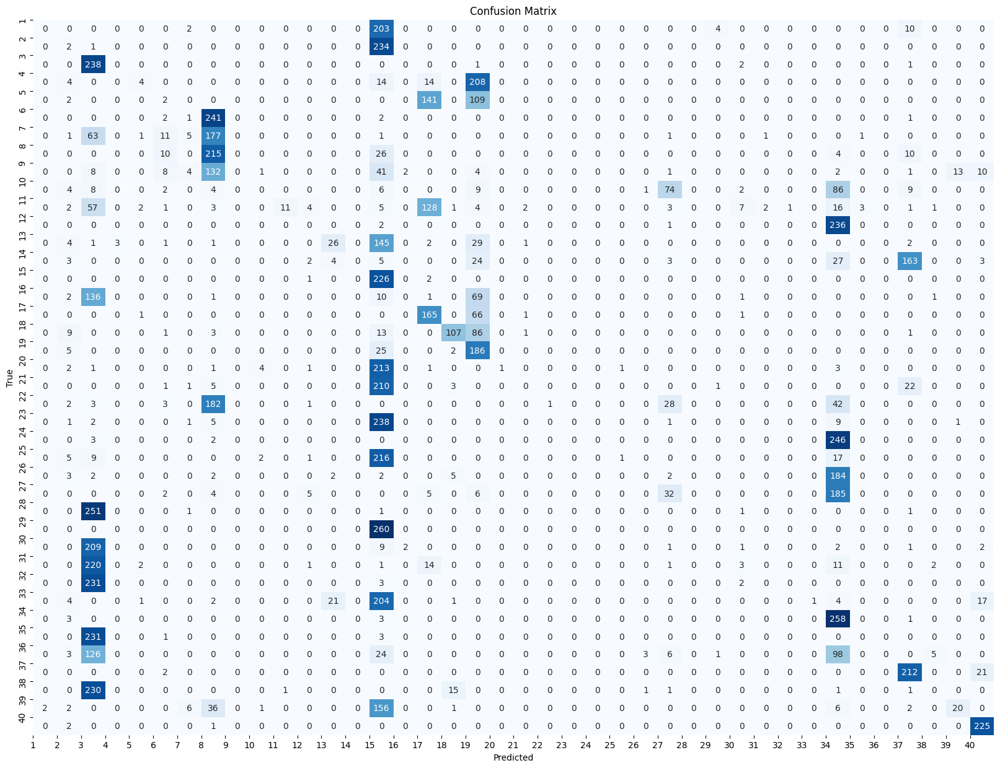

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       219
           2       0.03      0.01      0.01       237
           3       0.12      0.98      0.21       242
           4       0.00      0.00      0.00       244
           5       0.00      0.00      0.00       254
           6       0.04      0.01      0.01       247
           7       0.24      0.02      0.04       262
           8       0.21      0.81      0.34       265
           9       0.00      0.00      0.00       227
          10       0.00      0.00      0.00       205
          11       0.92      0.04      0.08       254
          12       0.00      0.00      0.00       239
          13       0.49      0.12      0.19       215
          14       0.00      0.00      0.00       234
          15       0.09      0.99      0.17       229
          16       0.00      0.00      0.00       221
          17       0.35      0.71      0.47       234
    

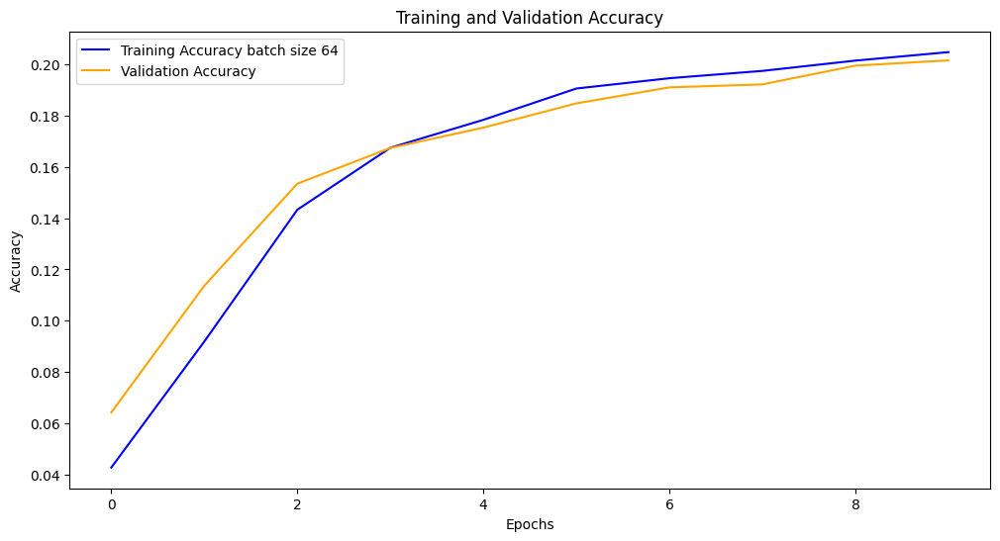

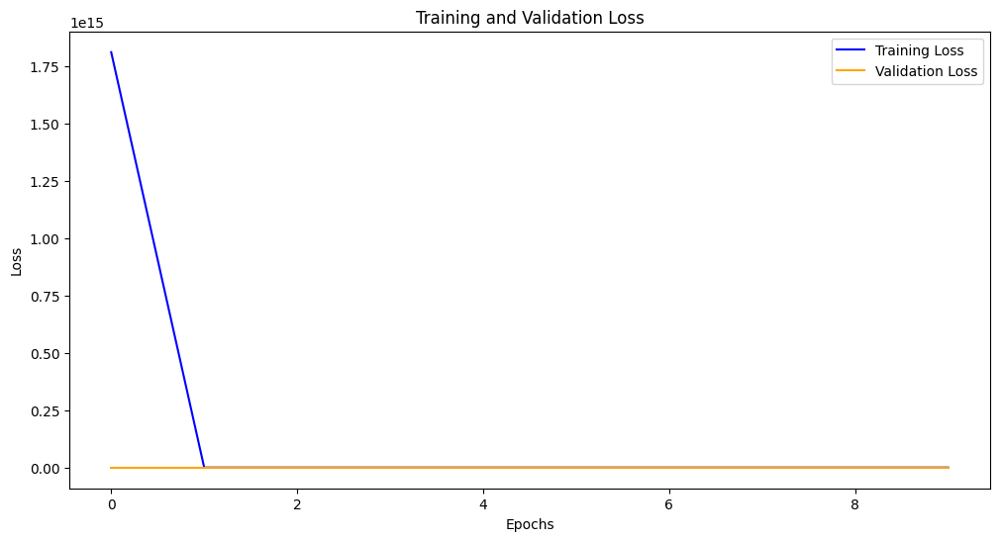

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu')(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu')(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom classification layers
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu')(vgg_output)
    vgg_output = Dense(num_classes, activation='softmax')(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax')(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define SGD optimizer with tuned learning rate and momentum
optimizer = SGD()

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}")
model = create_compile_model(optimizer)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=128,  # Changed batch size to 64
    epochs=10,
    validation_split=0.5,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy batch size 64', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# SGD 16


Training with optimizer: SGD
Epoch 1/10
700/700 [==============================] - 24s 32ms/step - loss: nan - accuracy: 1.7857e-04 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/10
700/700 [==============================] - 22s 31ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/10
700/700 [==============================] - 22s 31ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Evaluating the model...
300/300 [==============================] - 7s 24ms/step - loss: nan - accuracy: 0.0000e+00
Test Loss: nan, Test Accuracy: 0.0
300/300 [==============================] - 7s 22ms/step
F1 Score: 0.0


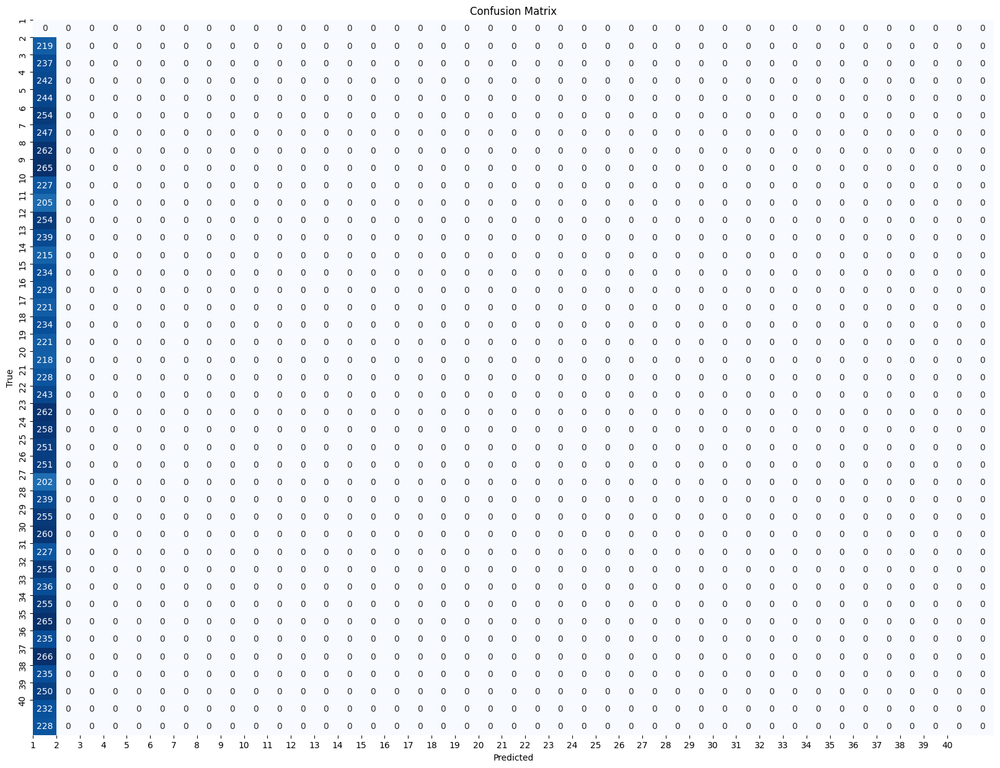

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       0.0
           1       0.00      0.00      0.00     219.0
           2       0.00      0.00      0.00     237.0
           3       0.00      0.00      0.00     242.0
           4       0.00      0.00      0.00     244.0
           5       0.00      0.00      0.00     254.0
           6       0.00      0.00      0.00     247.0
           7       0.00      0.00      0.00     262.0
           8       0.00      0.00      0.00     265.0
           9       0.00      0.00      0.00     227.0
          10       0.00      0.00      0.00     205.0
          11       0.00      0.00      0.00     254.0
          12       0.00      0.00      0.00     239.0
          13       0.00      0.00      0.00     215.0
          14       0.00      0.00      0.00     234.0
          15       0.00      0.00      0.00     229.0
          16       0.00      0.00      0.00     221.0
    

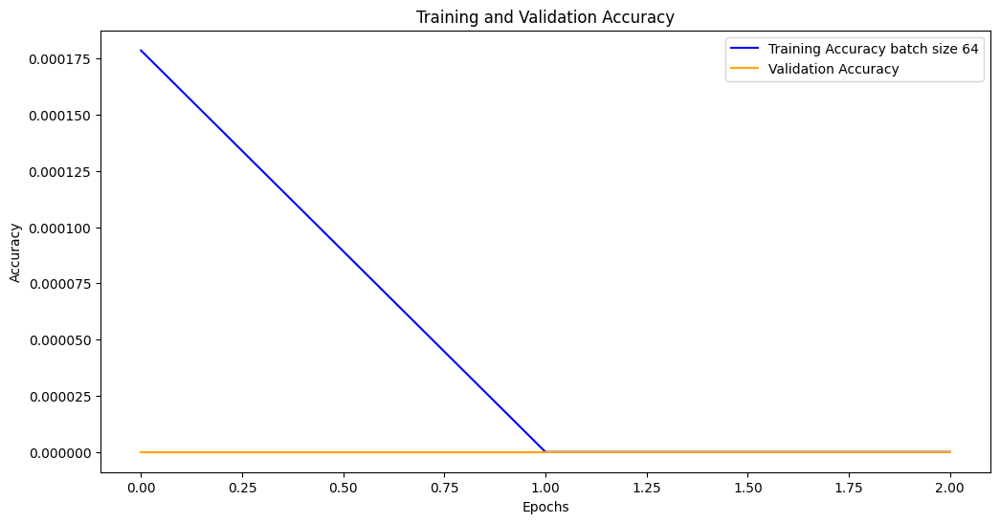

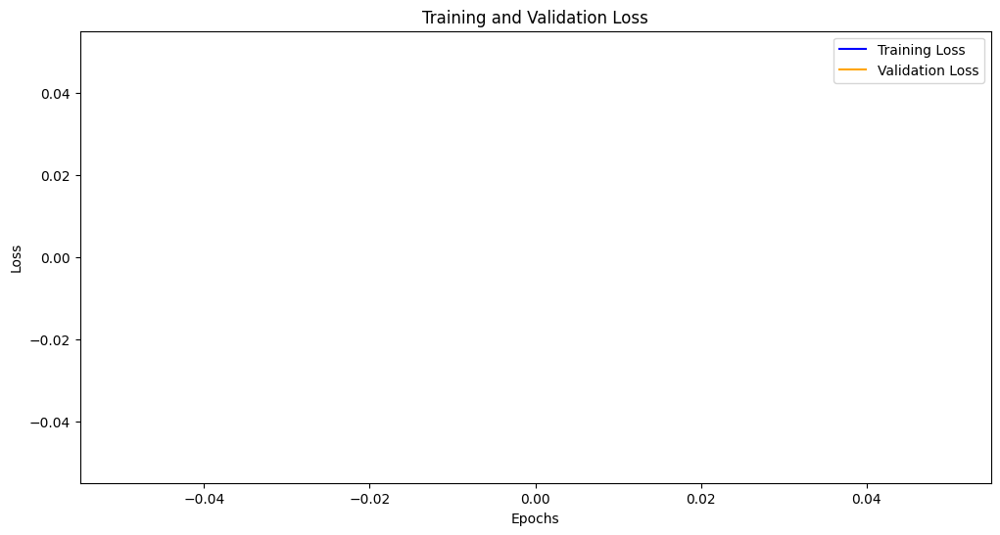

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu')(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu')(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom classification layers
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu')(vgg_output)
    vgg_output = Dense(num_classes, activation='softmax')(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax')(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define SGD optimizer with tuned learning rate and momentum
optimizer = SGD()

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}")
model = create_compile_model(optimizer)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=16,  # Changed batch size to 16
    epochs=10,
    validation_split=0.5,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy batch size 64', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Rmsprop batch size **16**


Training with optimizer: RMSprop, batch size: 16
Epoch 1/10
1330/1330 [==============================] - 26s 18ms/step - loss: 2.2423 - accuracy: 0.9357 - val_loss: 0.1198 - val_accuracy: 0.9830
Epoch 2/10
1330/1330 [==============================] - 24s 18ms/step - loss: 0.1004 - accuracy: 0.9868 - val_loss: 0.1180 - val_accuracy: 0.9777
Epoch 3/10
1330/1330 [==============================] - 24s 18ms/step - loss: 0.0850 - accuracy: 0.9891 - val_loss: 0.0546 - val_accuracy: 0.9937
Epoch 4/10
1330/1330 [==============================] - 24s 18ms/step - loss: 0.0763 - accuracy: 0.9903 - val_loss: 0.0739 - val_accuracy: 0.9911
Epoch 5/10
1330/1330 [==============================] - 24s 18ms/step - loss: 0.0751 - accuracy: 0.9897 - val_loss: 0.0765 - val_accuracy: 0.9893
Epoch 6/10
1330/1330 [==============================] - 24s 18ms/step - loss: 0.0715 - accuracy: 0.9912 - val_loss: 0.0915 - val_accuracy: 0.9777
Evaluating the model...
300/300 [==============================] - 7s 23ms

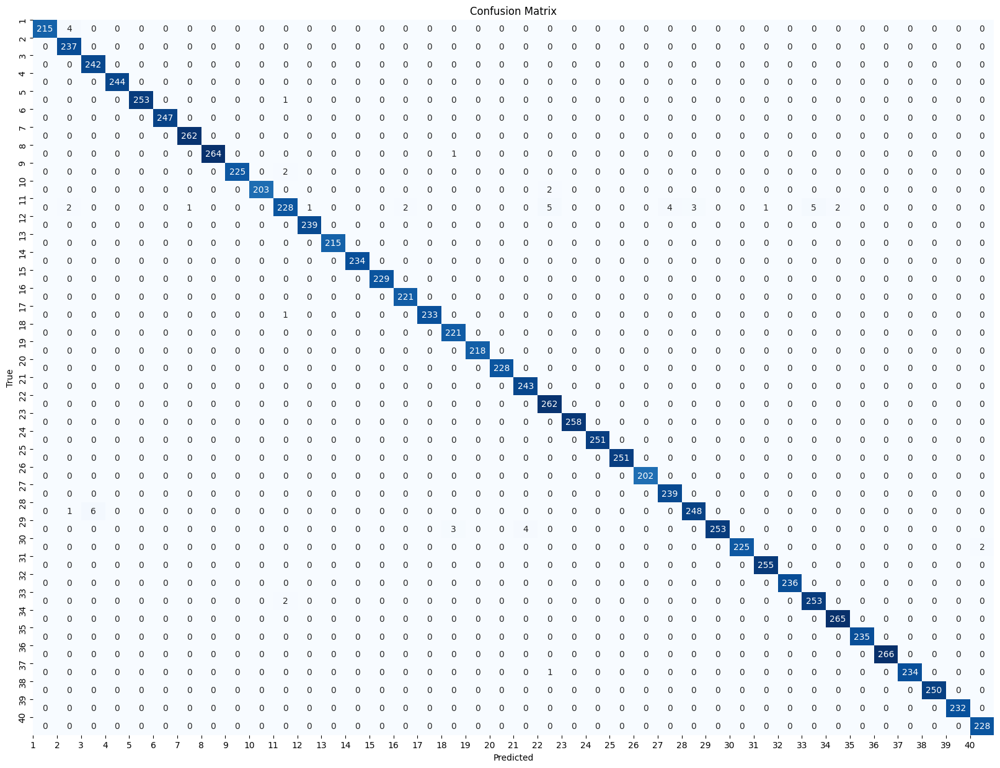

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.98      0.99       219
           2       0.97      1.00      0.99       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      0.99      1.00       227
          10       1.00      0.99      1.00       205
          11       0.97      0.90      0.93       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       0.99      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

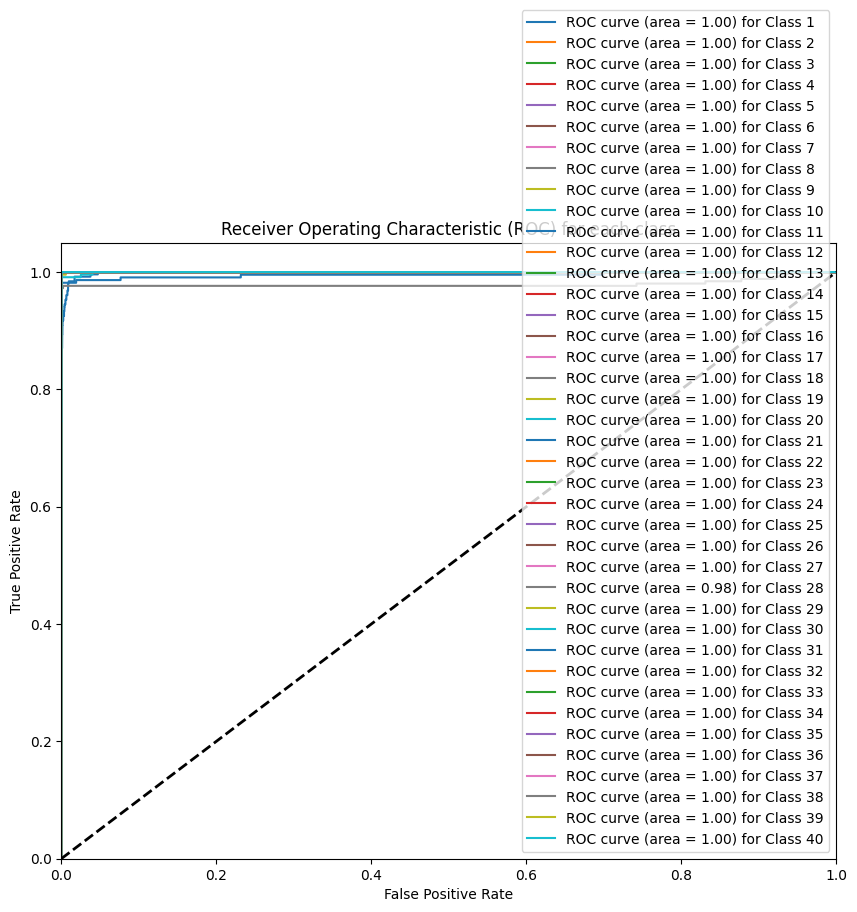

Predicted Classes for Batch Size 16: [38 36 36 ... 37 39 19]


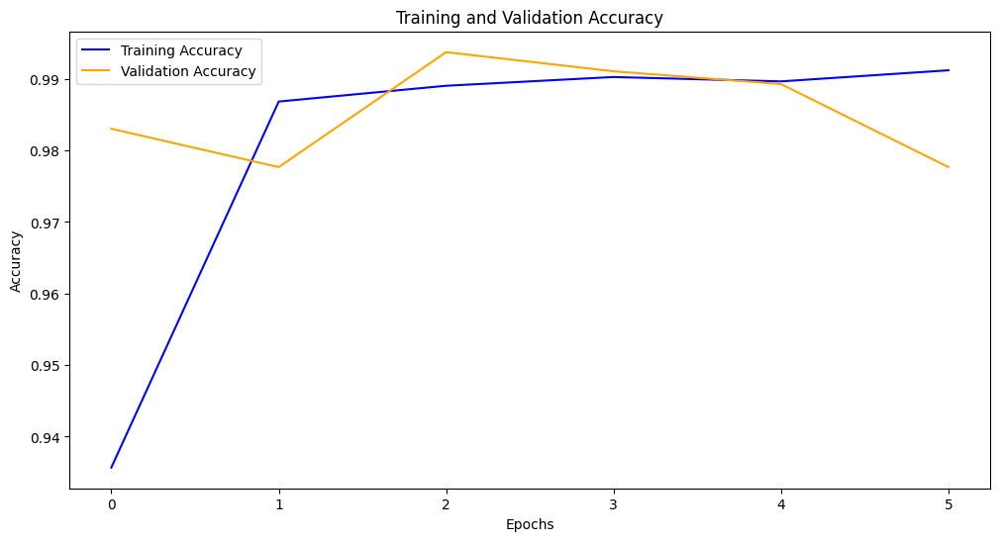

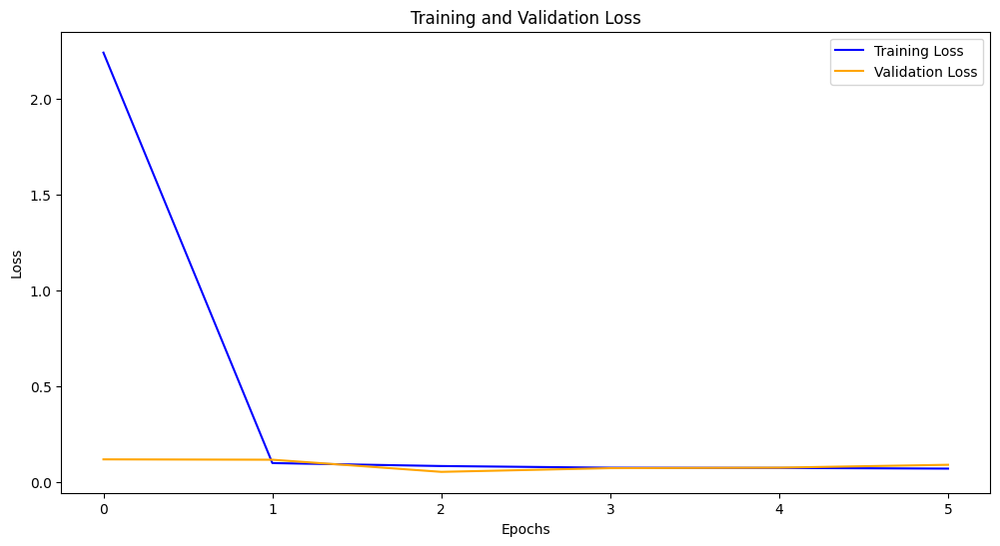

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define RMSprop optimizer
optimizer = tf.keras.optimizers.RMSprop()

# Define batch size
batch_size = 16

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
model = create_compile_model(optimizer, batch_size)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(1, num_classes):
    fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for each class')
plt.legend(loc="lower right")
plt.show()

# Display predicted classes for a batch size of 16
print("Predicted Classes for Batch Size 16:", predicted_classes)

# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Rmsprop batch size 32


Training with optimizer: RMSprop, batch size: 32
Epoch 1/10
665/665 [==============================] - 21s 29ms/step - loss: 2.7532 - accuracy: 0.9301 - val_loss: 0.1103 - val_accuracy: 0.9929
Epoch 2/10
665/665 [==============================] - 19s 29ms/step - loss: 0.1491 - accuracy: 0.9881 - val_loss: 0.0865 - val_accuracy: 0.9911
Epoch 3/10
665/665 [==============================] - 19s 29ms/step - loss: 0.0737 - accuracy: 0.9927 - val_loss: 0.0478 - val_accuracy: 0.9964
Epoch 4/10
665/665 [==============================] - 19s 29ms/step - loss: 0.0610 - accuracy: 0.9929 - val_loss: 0.0373 - val_accuracy: 0.9964
Epoch 5/10
665/665 [==============================] - 19s 28ms/step - loss: 0.0551 - accuracy: 0.9940 - val_loss: 0.0283 - val_accuracy: 0.9991
Epoch 6/10
665/665 [==============================] - 19s 28ms/step - loss: 0.0502 - accuracy: 0.9940 - val_loss: 0.0402 - val_accuracy: 0.9973
Epoch 7/10
665/665 [==============================] - 19s 28ms/step - loss: 0.0455 - a

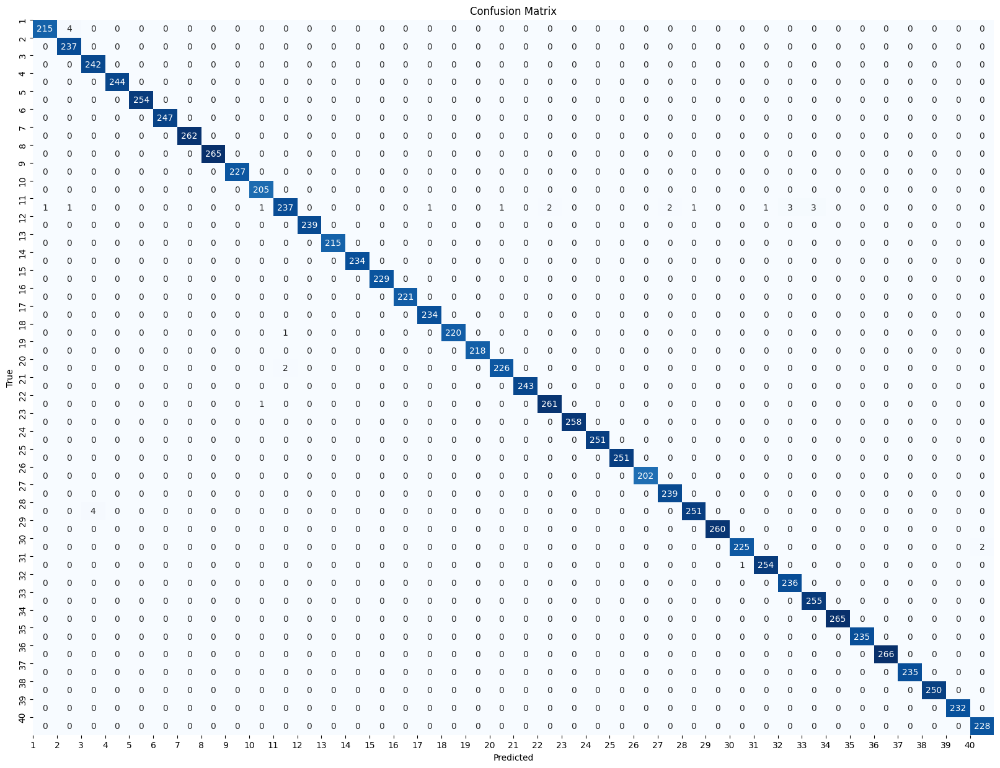

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.98      0.99       219
           2       0.98      1.00      0.99       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      1.00      1.00       227
          10       0.99      1.00      1.00       205
          11       0.99      0.93      0.96       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

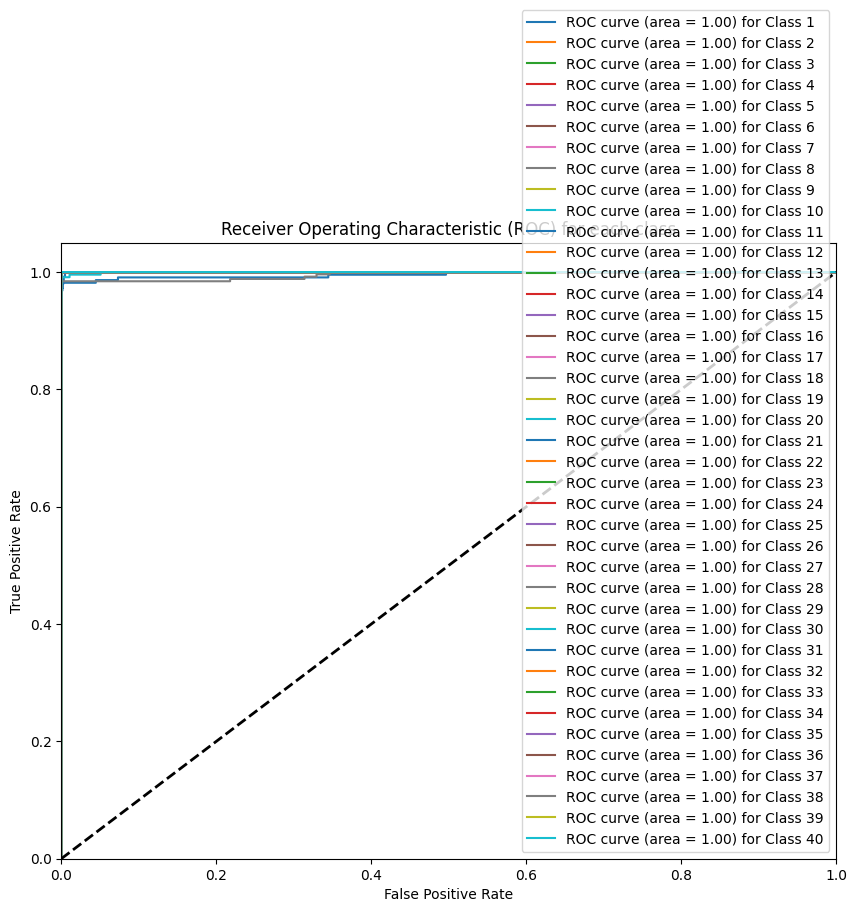

Predicted Classes for Batch Size 16: [38 36 36 ... 37 39 19]


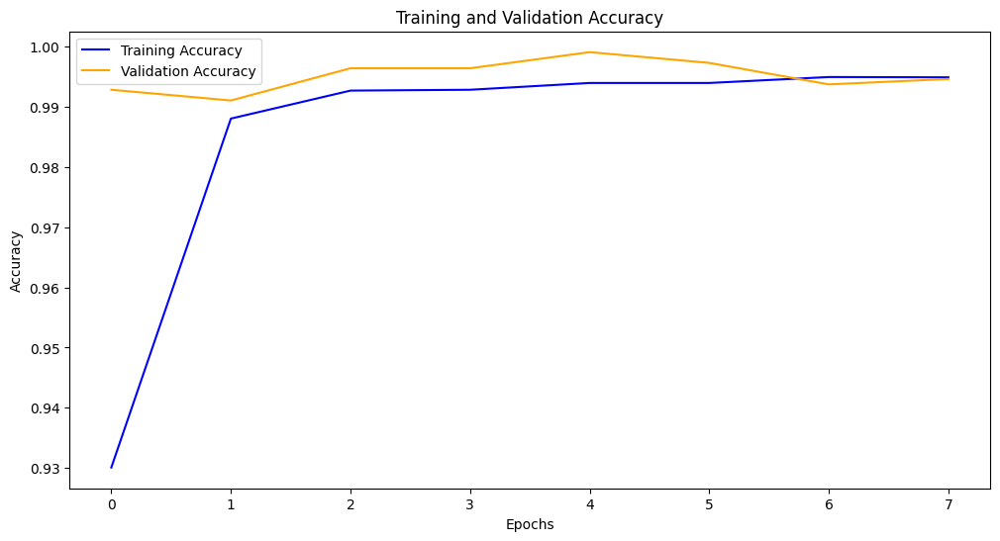

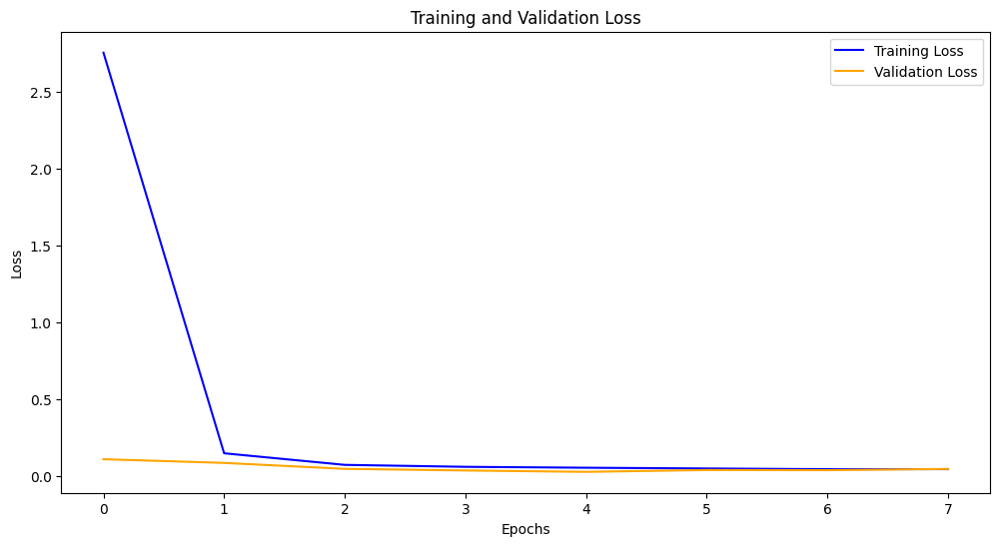

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define RMSprop optimizer
optimizer = tf.keras.optimizers.RMSprop()

# Define batch size
batch_size = 32

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
model = create_compile_model(optimizer, batch_size)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(1, num_classes):
    fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for each class')
plt.legend(loc="lower right")
plt.show()

# Display predicted classes for a batch size of 16
print("Predicted Classes for Batch Size 16:", predicted_classes)

# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# **Rmsprop 64**


Training with optimizer: RMSprop, batch size: 64
Epoch 1/10
333/333 [==============================] - 19s 50ms/step - loss: 4.6363 - accuracy: 0.9226 - val_loss: 0.1745 - val_accuracy: 0.9937
Epoch 2/10
333/333 [==============================] - 17s 50ms/step - loss: 0.1277 - accuracy: 0.9914 - val_loss: 0.1247 - val_accuracy: 0.9929
Epoch 3/10
333/333 [==============================] - 17s 50ms/step - loss: 0.0827 - accuracy: 0.9942 - val_loss: 0.0782 - val_accuracy: 0.9955
Epoch 4/10
333/333 [==============================] - 16s 49ms/step - loss: 0.0591 - accuracy: 0.9958 - val_loss: 0.1216 - val_accuracy: 0.9848
Epoch 5/10
333/333 [==============================] - 16s 49ms/step - loss: 0.0505 - accuracy: 0.9960 - val_loss: 0.0638 - val_accuracy: 0.9955
Epoch 6/10
333/333 [==============================] - 16s 49ms/step - loss: 0.0443 - accuracy: 0.9969 - val_loss: 0.0884 - val_accuracy: 0.9893
Epoch 7/10
333/333 [==============================] - 16s 49ms/step - loss: 0.0422 - a

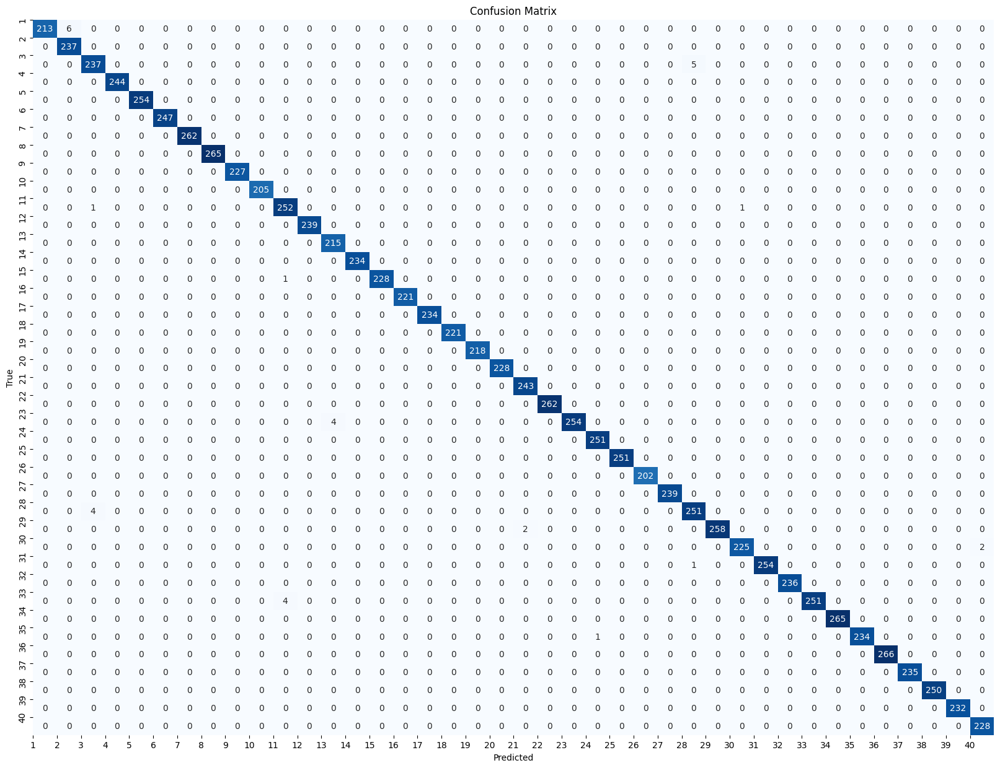

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.97      0.99       219
           2       0.98      1.00      0.99       237
           3       0.98      0.98      0.98       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      1.00      1.00       227
          10       1.00      1.00      1.00       205
          11       0.98      0.99      0.99       254
          12       1.00      1.00      1.00       239
          13       0.98      1.00      0.99       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

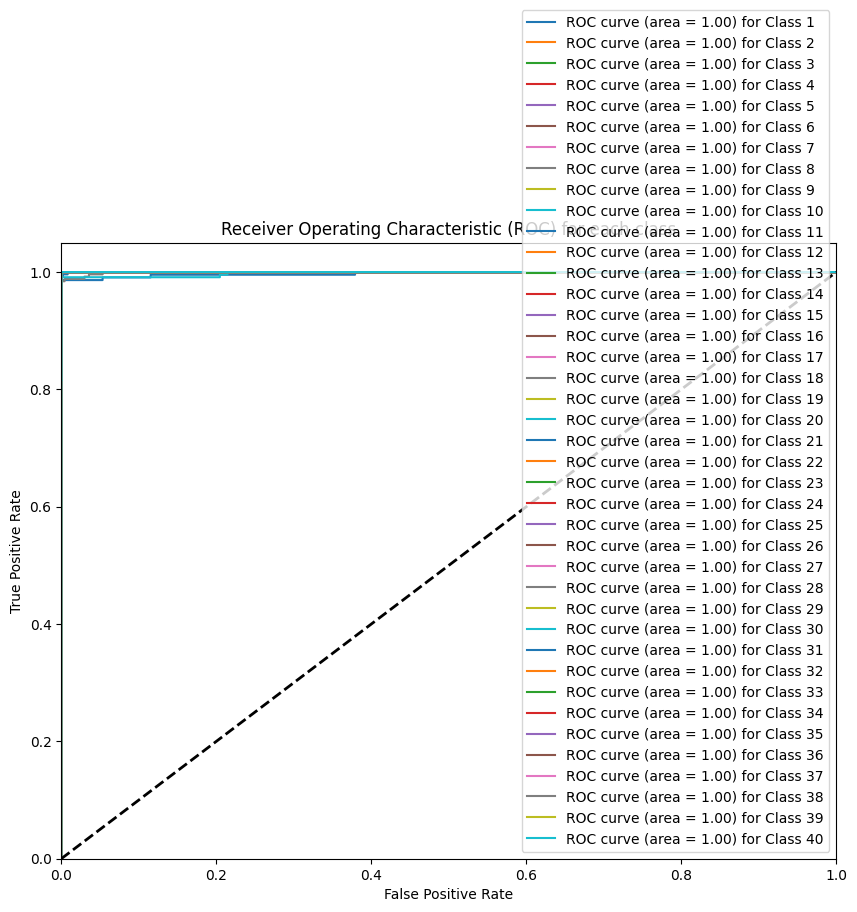

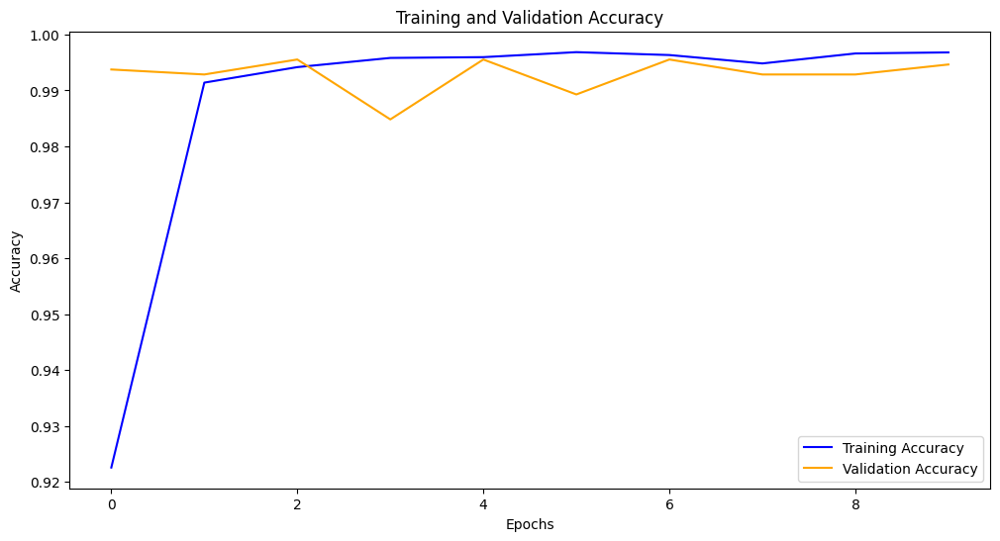

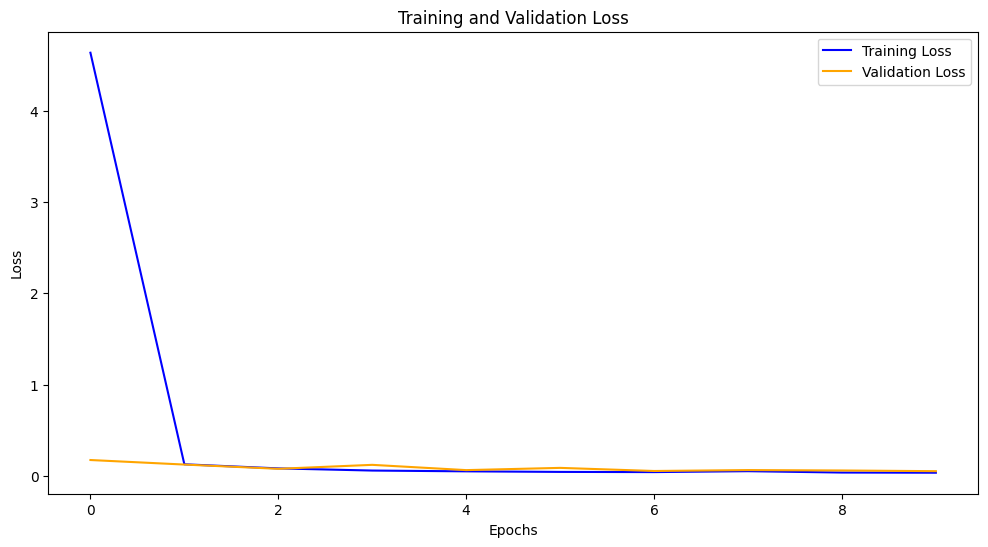

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define RMSprop optimizer
optimizer = tf.keras.optimizers.RMSprop()

# Define batch size
batch_size = 64

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
model = create_compile_model(optimizer, batch_size)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(1, num_classes):
    fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for each class')
plt.legend(loc="lower right")
plt.show()



# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Rmsprop 128


Training with optimizer: RMSprop, batch size: 128
Epoch 1/10
167/167 [==============================] - 21s 115ms/step - loss: 13.3821 - accuracy: 0.8719 - val_loss: 0.4101 - val_accuracy: 0.9920
Epoch 2/10
167/167 [==============================] - 16s 95ms/step - loss: 0.3094 - accuracy: 0.9891 - val_loss: 0.1427 - val_accuracy: 0.9946
Epoch 3/10
167/167 [==============================] - 16s 95ms/step - loss: 0.1892 - accuracy: 0.9860 - val_loss: 0.0881 - val_accuracy: 0.9991
Epoch 4/10
167/167 [==============================] - 15s 93ms/step - loss: 0.1149 - accuracy: 0.9930 - val_loss: 0.0733 - val_accuracy: 0.9973
Epoch 5/10
167/167 [==============================] - 15s 92ms/step - loss: 0.0803 - accuracy: 0.9944 - val_loss: 0.0522 - val_accuracy: 0.9973
Epoch 6/10
167/167 [==============================] - 15s 92ms/step - loss: 0.0571 - accuracy: 0.9963 - val_loss: 0.0487 - val_accuracy: 0.9982
Epoch 7/10
167/167 [==============================] - 15s 92ms/step - loss: 0.0482 

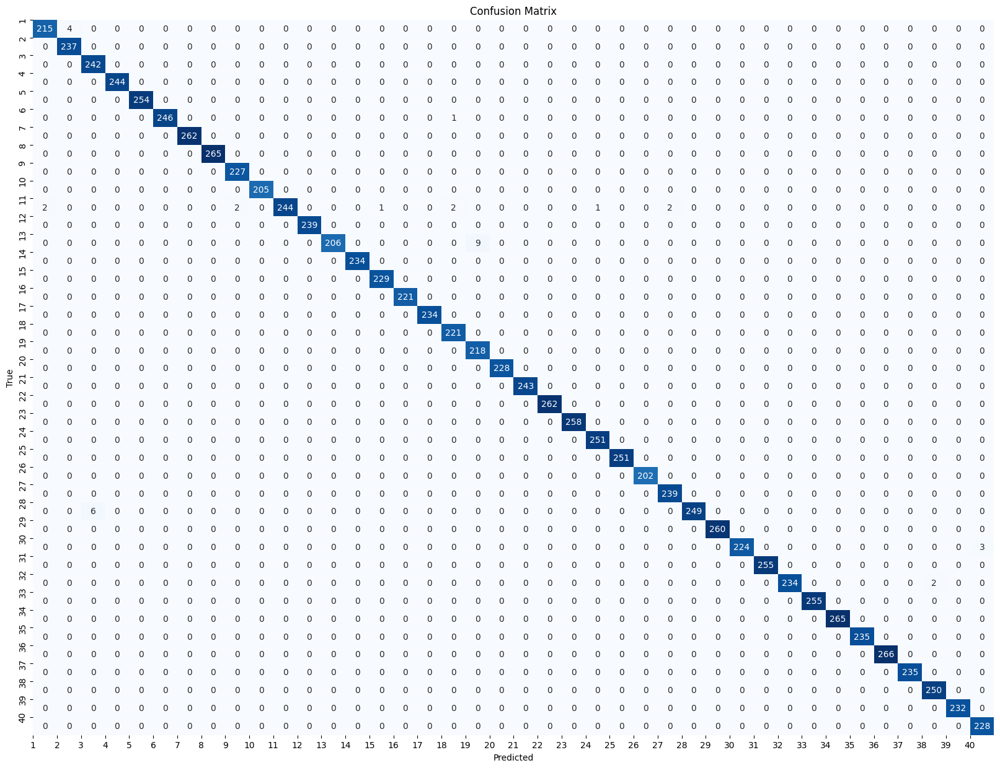

Classification Report:
              precision    recall  f1-score   support

           1       0.99      0.98      0.99       219
           2       0.98      1.00      0.99       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       0.99      1.00      1.00       227
          10       1.00      1.00      1.00       205
          11       1.00      0.96      0.98       254
          12       1.00      1.00      1.00       239
          13       1.00      0.96      0.98       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

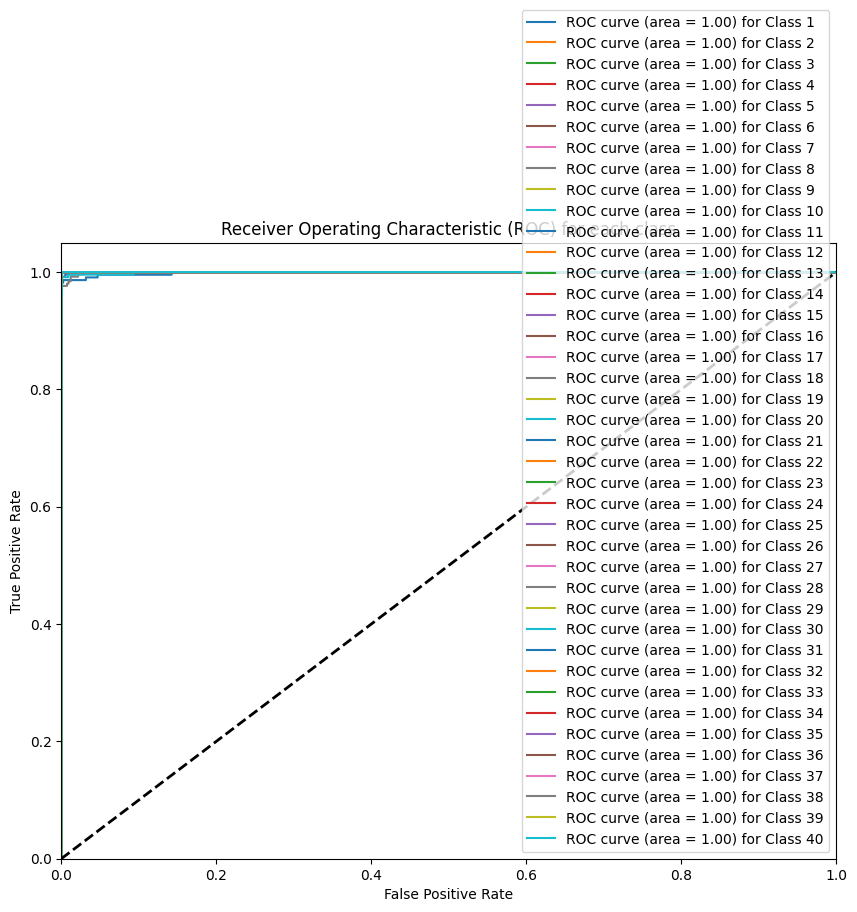

Predicted Classes for Batch Size 16: [38 36 36 ... 37 39 19]


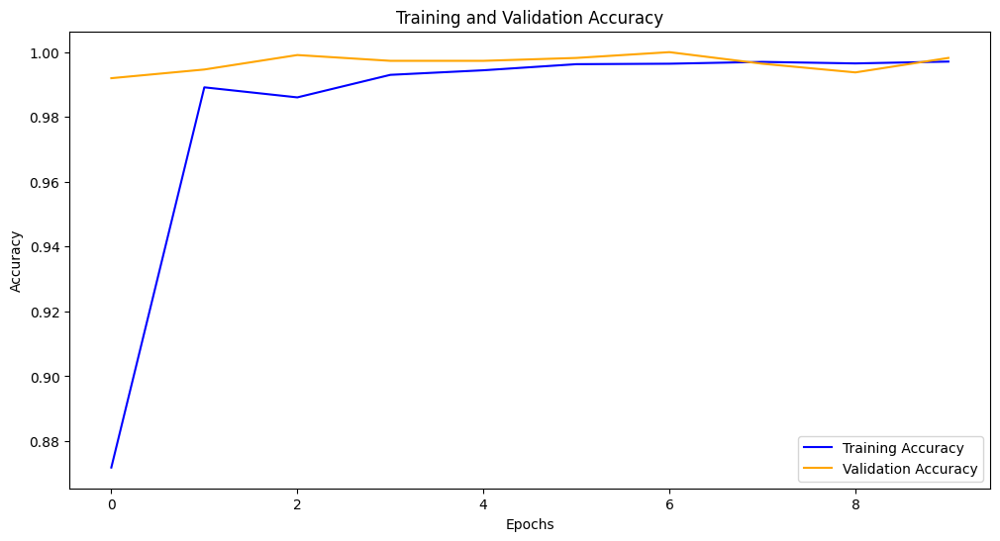

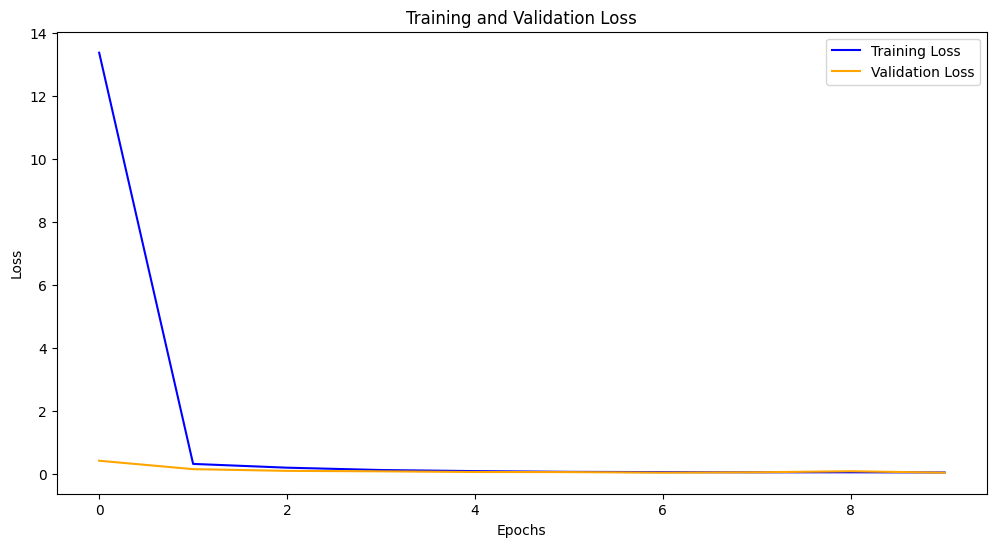

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define RMSprop optimizer
optimizer = tf.keras.optimizers.RMSprop()

# Define batch size
batch_size = 128

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
model = create_compile_model(optimizer, batch_size)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(1, num_classes):
    fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for each class')
plt.legend(loc="lower right")
plt.show()

# Display predicted classes for a batch size of 16
print("Predicted Classes for Batch Size 16:", predicted_classes)

# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Agagrad 128


Training with optimizer: Adagrad, batch size: 128
Epoch 1/10
167/167 [==============================] - 17s 92ms/step - loss: 8.2373 - accuracy: 0.7136 - val_loss: 1.4533 - val_accuracy: 0.9589
Epoch 2/10
167/167 [==============================] - 15s 92ms/step - loss: 1.3709 - accuracy: 0.9812 - val_loss: 1.3309 - val_accuracy: 0.9866
Epoch 3/10
167/167 [==============================] - 16s 95ms/step - loss: 1.3041 - accuracy: 0.9941 - val_loss: 1.3013 - val_accuracy: 0.9902
Epoch 4/10
167/167 [==============================] - 16s 95ms/step - loss: 1.2829 - accuracy: 0.9972 - val_loss: 1.2936 - val_accuracy: 0.9911
Epoch 5/10
167/167 [==============================] - 16s 93ms/step - loss: 1.2724 - accuracy: 0.9984 - val_loss: 1.2774 - val_accuracy: 0.9955
Epoch 6/10
167/167 [==============================] - 15s 92ms/step - loss: 1.2652 - accuracy: 0.9991 - val_loss: 1.2757 - val_accuracy: 0.9955
Epoch 7/10
167/167 [==============================] - 15s 93ms/step - loss: 1.2606 - 

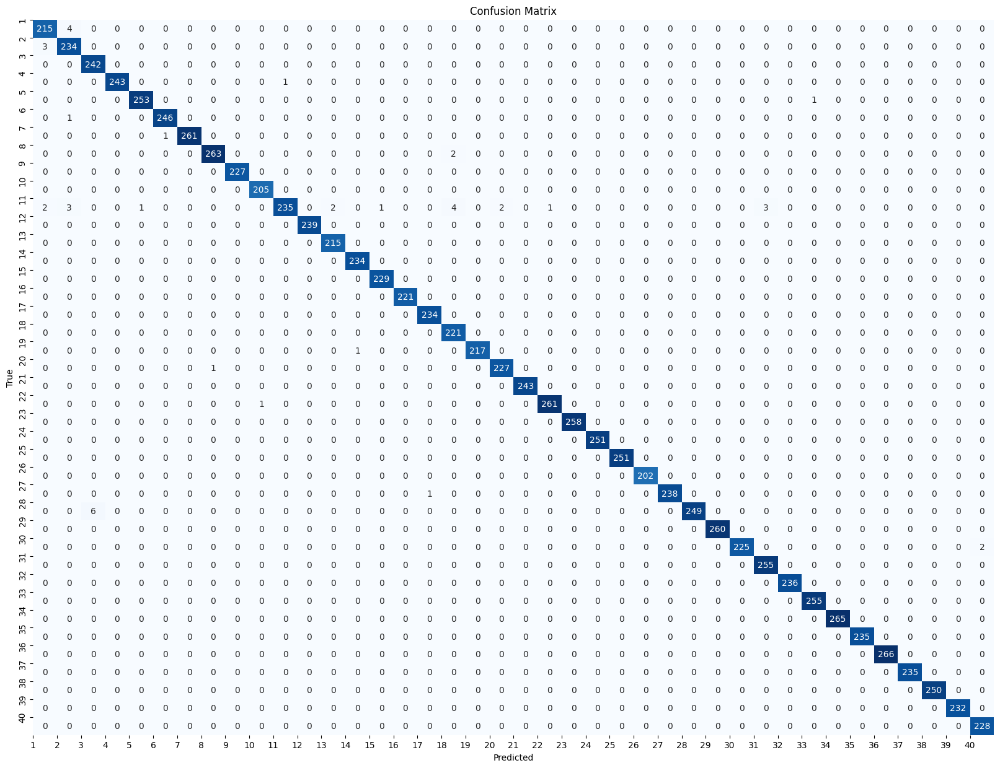

Classification Report:
              precision    recall  f1-score   support

           1       0.98      0.98      0.98       219
           2       0.97      0.99      0.98       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      0.99      0.99       265
           9       1.00      1.00      1.00       227
          10       1.00      1.00      1.00       205
          11       1.00      0.93      0.96       254
          12       1.00      1.00      1.00       239
          13       0.99      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

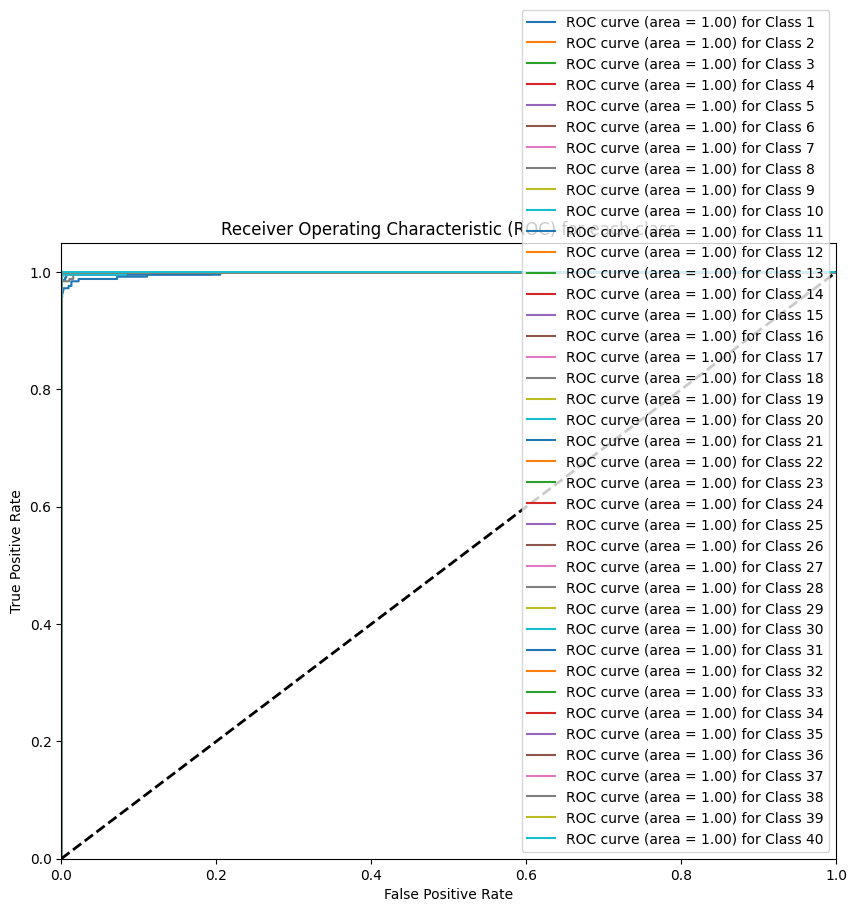

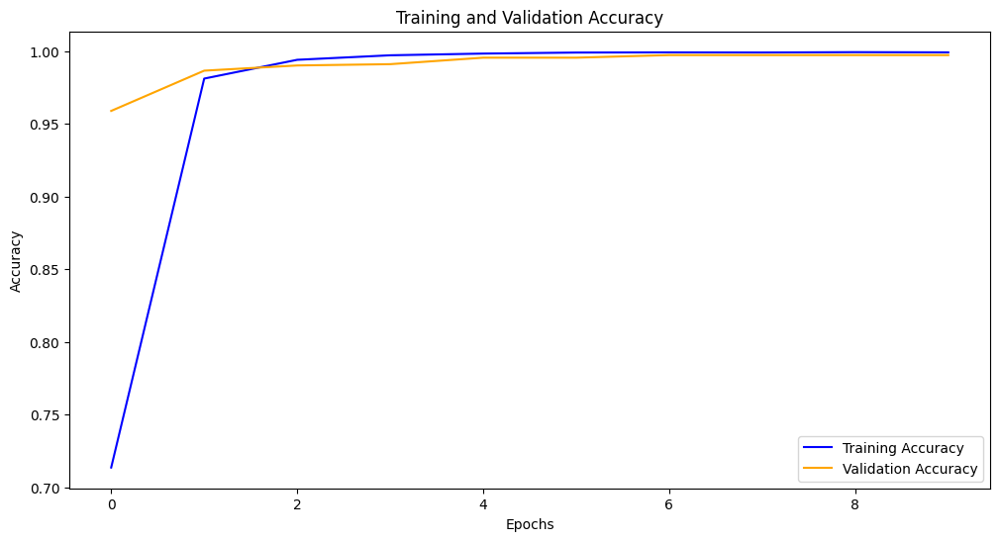

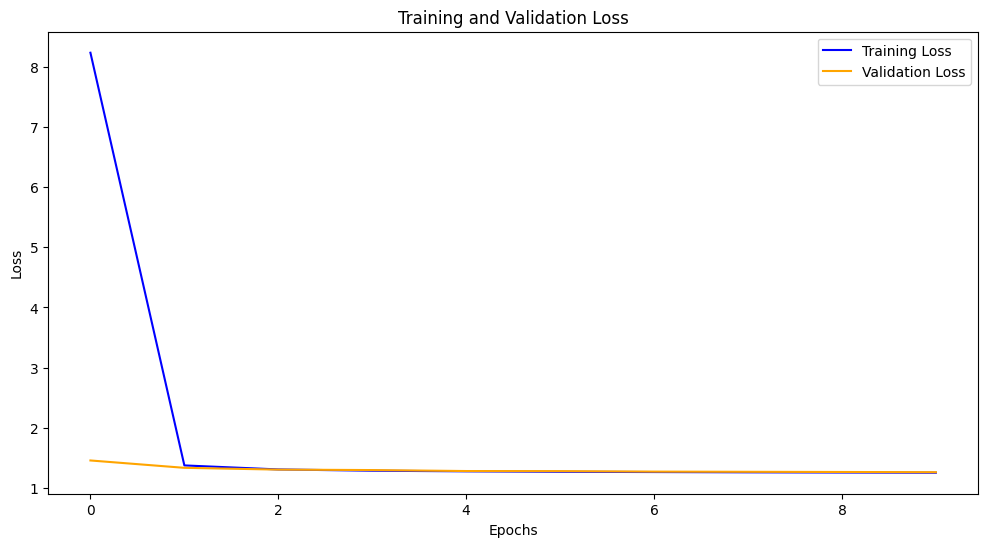

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define Adagrad optimizer
optimizer = tf.keras.optimizers.Adagrad()

# Define batch size
batch_size = 128

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
model = create_compile_model(optimizer, batch_size)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(1, num_classes):
    fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for each class')
plt.legend(loc="lower right")
plt.show()



# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Adagrad batch size 64


Training with optimizer: Adagrad, batch size: 64
Epoch 1/10
333/333 [==============================] - 18s 50ms/step - loss: 6.1516 - accuracy: 0.8039 - val_loss: 1.3572 - val_accuracy: 0.9821
Epoch 2/10
333/333 [==============================] - 17s 50ms/step - loss: 1.3192 - accuracy: 0.9898 - val_loss: 1.2945 - val_accuracy: 0.9955
Epoch 3/10
333/333 [==============================] - 17s 50ms/step - loss: 1.2788 - accuracy: 0.9969 - val_loss: 1.2732 - val_accuracy: 0.9991
Epoch 4/10
333/333 [==============================] - 16s 50ms/step - loss: 1.2652 - accuracy: 0.9983 - val_loss: 1.2631 - val_accuracy: 0.9991
Epoch 5/10
333/333 [==============================] - 16s 49ms/step - loss: 1.2569 - accuracy: 0.9984 - val_loss: 1.2518 - val_accuracy: 1.0000
Epoch 6/10
333/333 [==============================] - 16s 49ms/step - loss: 1.2501 - accuracy: 0.9988 - val_loss: 1.2507 - val_accuracy: 0.9982
Epoch 7/10
333/333 [==============================] - 16s 49ms/step - loss: 1.2438 - a

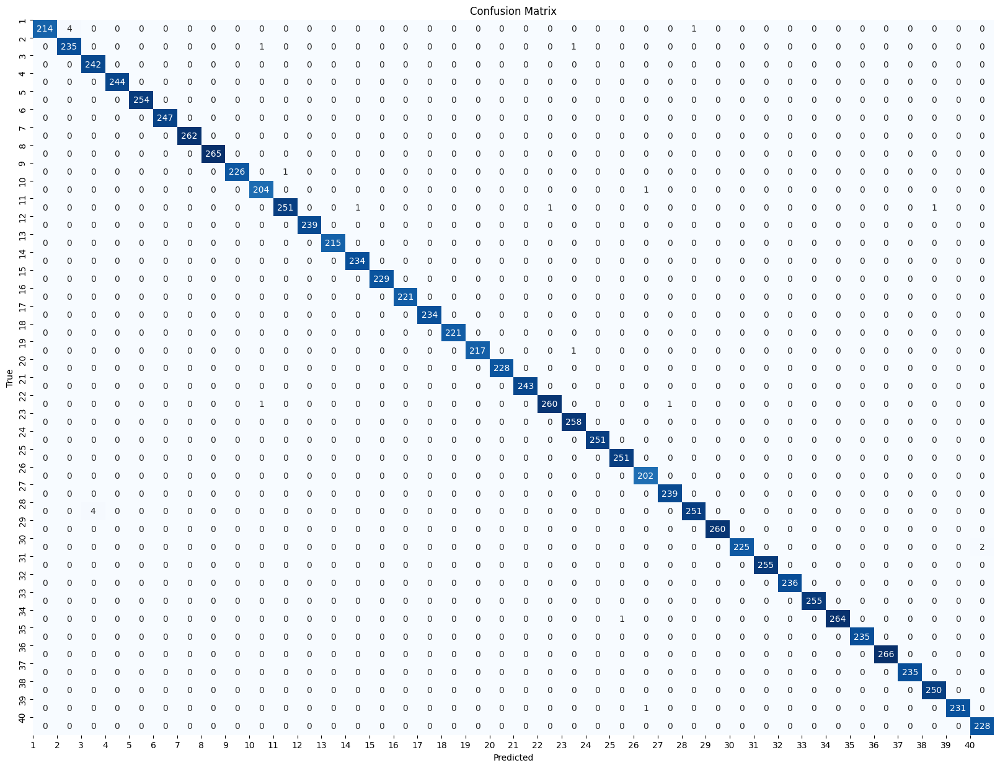

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.98      0.99       219
           2       0.98      0.99      0.99       237
           3       0.98      1.00      0.99       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      1.00      1.00       227
          10       0.99      1.00      0.99       205
          11       1.00      0.99      0.99       254
          12       1.00      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

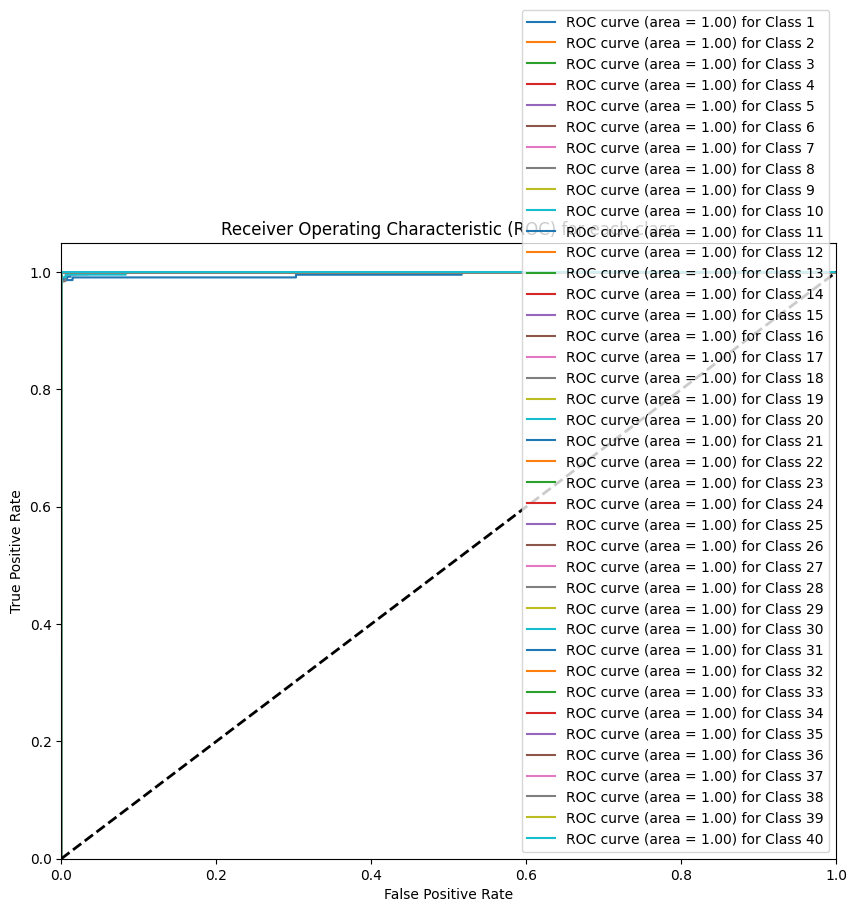

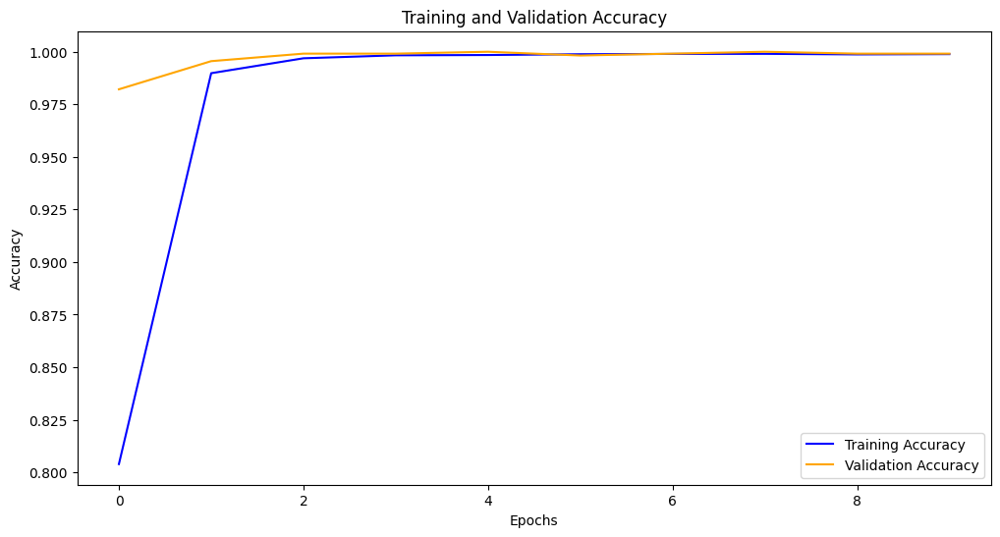

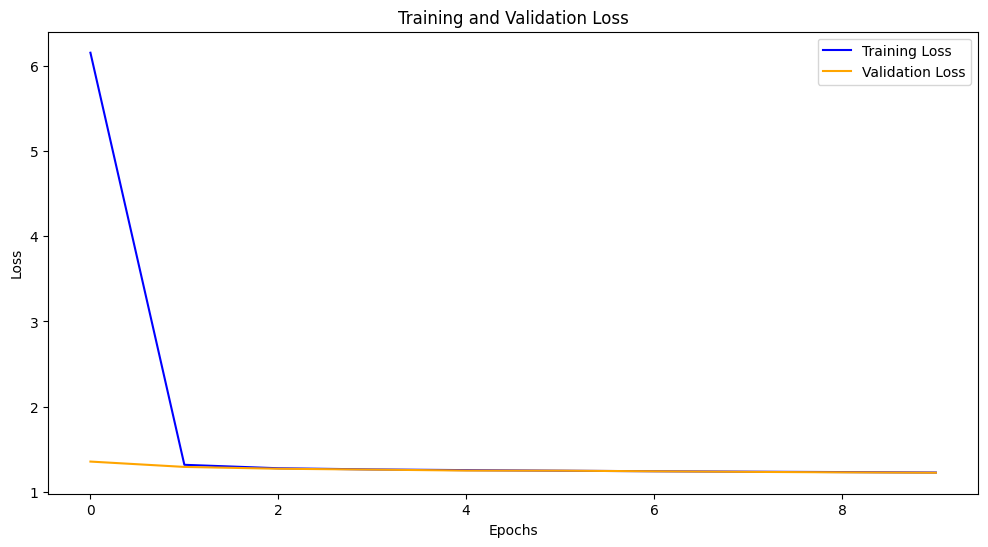

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define Adagrad optimizer
optimizer = tf.keras.optimizers.Adagrad()

# Define batch size
batch_size = 64

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
model = create_compile_model(optimizer, batch_size)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(1, num_classes):
    fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for each class')
plt.legend(loc="lower right")
plt.show()



# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# adagrad 32


Training with optimizer: Adagrad, batch size: 32
Epoch 1/10
665/665 [==============================] - 20s 29ms/step - loss: 4.6086 - accuracy: 0.7730 - val_loss: 1.4191 - val_accuracy: 0.9705
Epoch 2/10
665/665 [==============================] - 19s 29ms/step - loss: 1.3397 - accuracy: 0.9837 - val_loss: 1.3301 - val_accuracy: 0.9866
Epoch 3/10
665/665 [==============================] - 19s 29ms/step - loss: 1.2782 - accuracy: 0.9961 - val_loss: 1.2761 - val_accuracy: 0.9911
Epoch 4/10
665/665 [==============================] - 19s 29ms/step - loss: 1.2544 - accuracy: 0.9983 - val_loss: 1.2585 - val_accuracy: 0.9946
Epoch 5/10
665/665 [==============================] - 19s 28ms/step - loss: 1.2399 - accuracy: 0.9989 - val_loss: 1.2447 - val_accuracy: 0.9964
Epoch 6/10
665/665 [==============================] - 19s 28ms/step - loss: 1.2279 - accuracy: 0.9989 - val_loss: 1.2349 - val_accuracy: 0.9964
Epoch 7/10
665/665 [==============================] - 19s 28ms/step - loss: 1.2170 - a

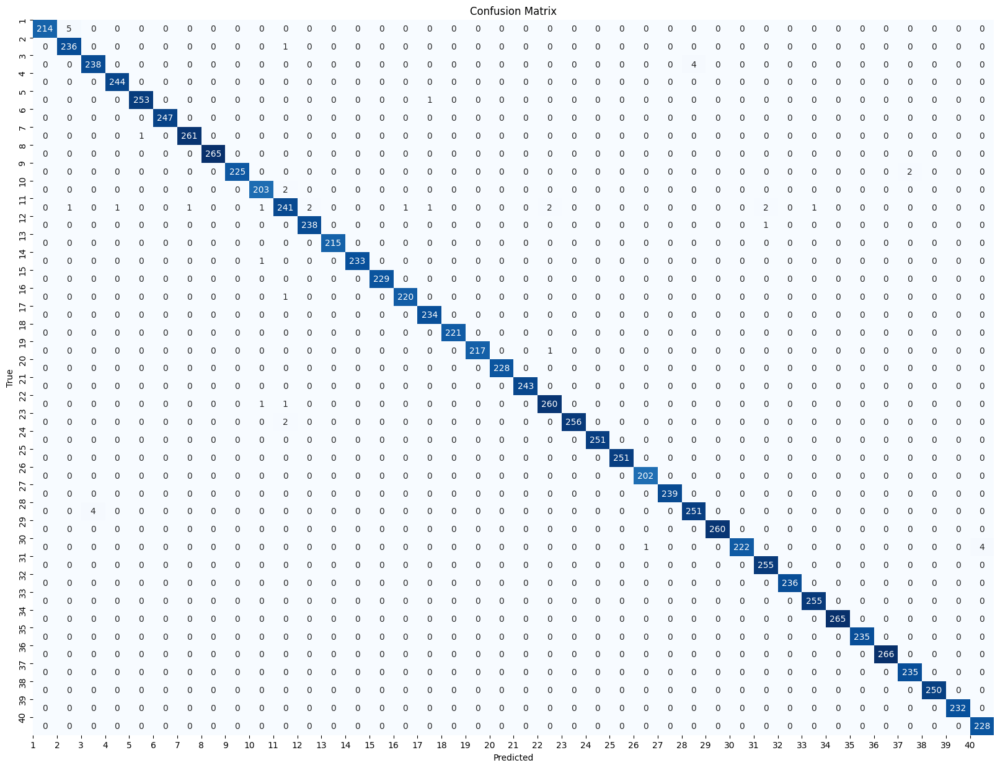

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.98      0.99       219
           2       0.98      1.00      0.99       237
           3       0.98      0.98      0.98       242
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       1.00      0.99      1.00       227
          10       0.99      0.99      0.99       205
          11       0.97      0.95      0.96       254
          12       0.99      1.00      0.99       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       0.99      1.00      1.00       234
    

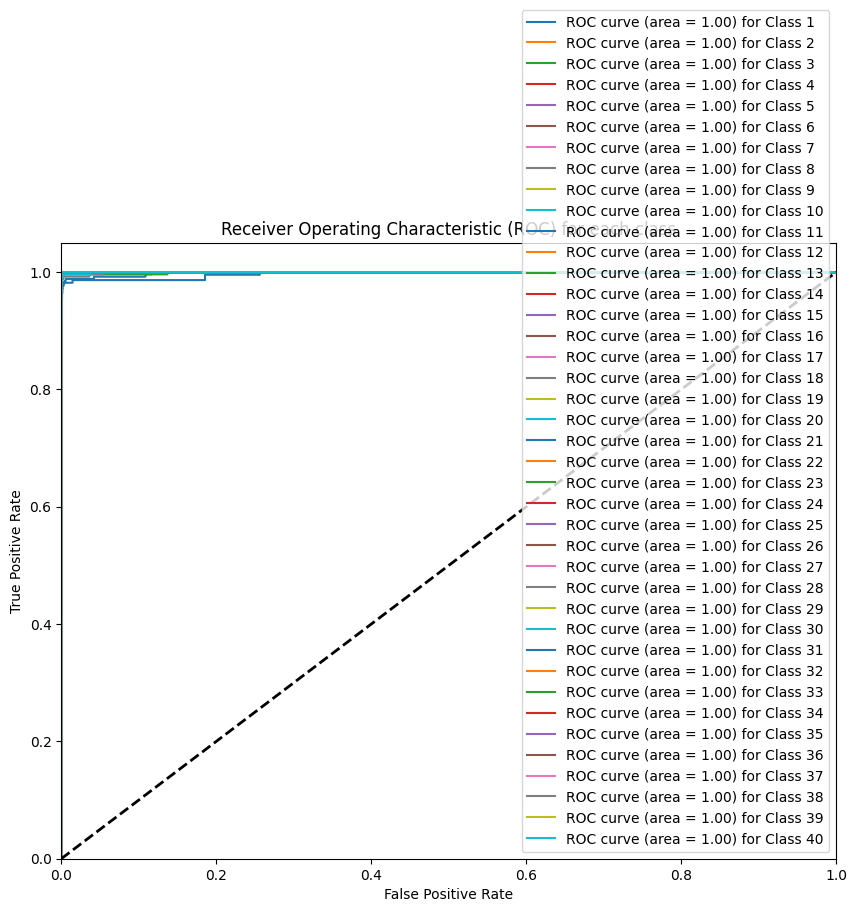

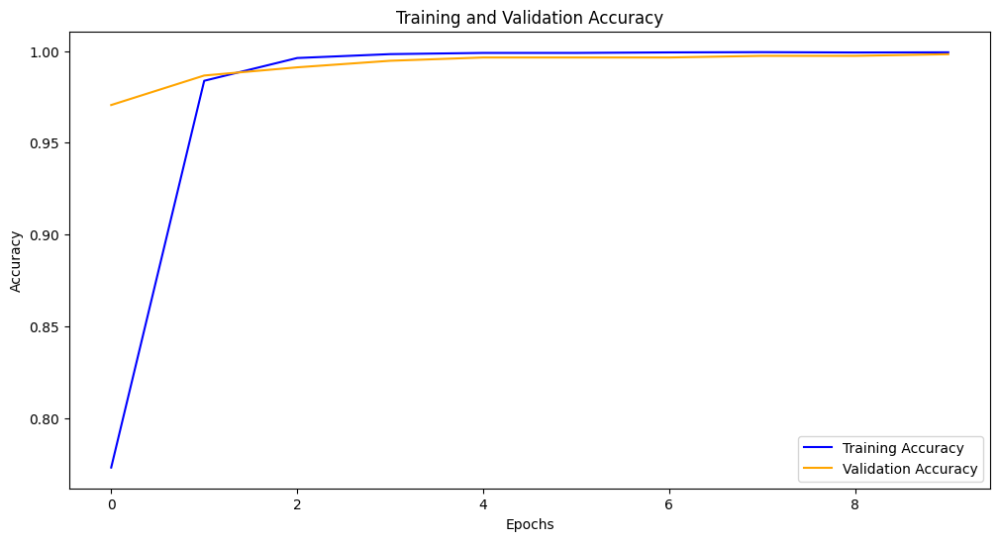

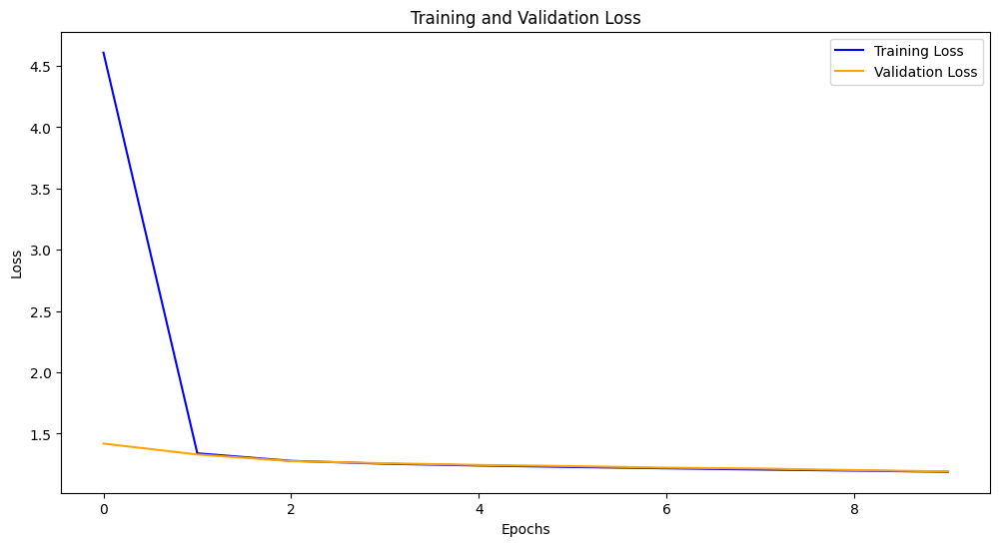

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define Adagrad optimizer
optimizer = tf.keras.optimizers.Adagrad()

# Define batch size
batch_size = 32

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
model = create_compile_model(optimizer, batch_size)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(1, num_classes):
    fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for each class')
plt.legend(loc="lower right")
plt.show()



# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Adagrad 16


Training with optimizer: Adagrad, batch size: 16
Epoch 1/10
1330/1330 [==============================] - 26s 18ms/step - loss: 3.8403 - accuracy: 0.7697 - val_loss: 1.4194 - val_accuracy: 0.9589
Epoch 2/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.3177 - accuracy: 0.9854 - val_loss: 1.2916 - val_accuracy: 0.9857
Epoch 3/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.2495 - accuracy: 0.9967 - val_loss: 1.2451 - val_accuracy: 0.9929
Epoch 4/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.2198 - accuracy: 0.9983 - val_loss: 1.2249 - val_accuracy: 0.9929
Epoch 5/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.1989 - accuracy: 0.9988 - val_loss: 1.1965 - val_accuracy: 0.9955
Epoch 6/10
1330/1330 [==============================] - 24s 18ms/step - loss: 1.1804 - accuracy: 0.9988 - val_loss: 1.1775 - val_accuracy: 0.9955
Epoch 7/10
1330/1330 [==============================] - 24s 18ms/step - lo

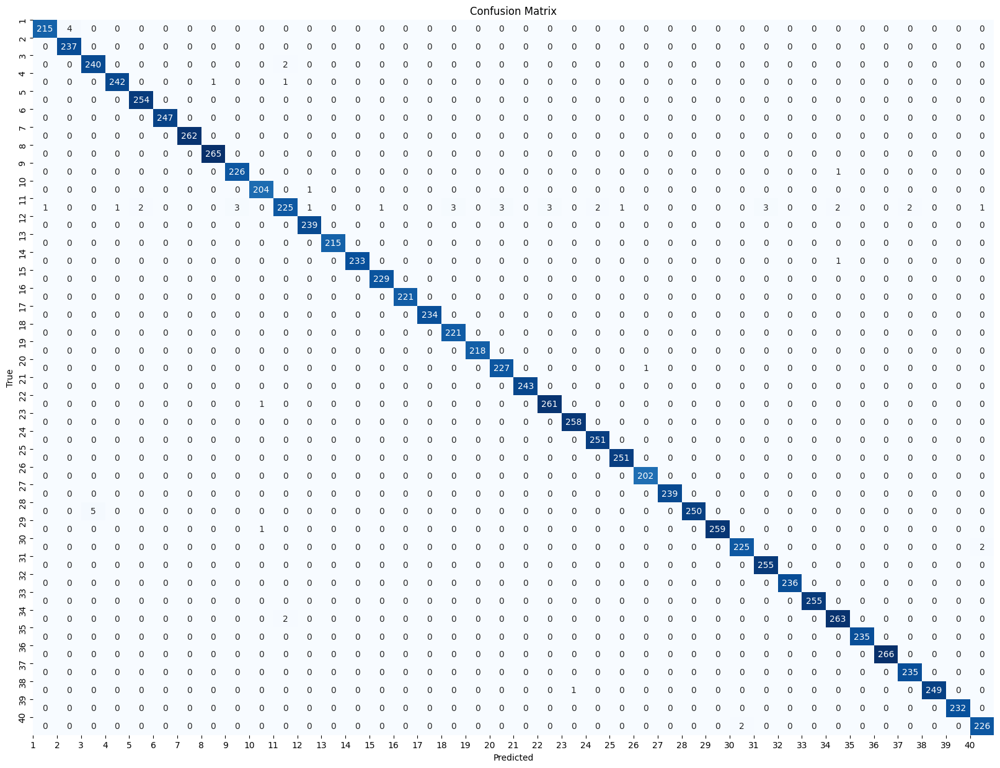

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.98      0.99       219
           2       0.98      1.00      0.99       237
           3       0.98      0.99      0.99       242
           4       1.00      0.99      0.99       244
           5       0.99      1.00      1.00       254
           6       1.00      1.00      1.00       247
           7       1.00      1.00      1.00       262
           8       1.00      1.00      1.00       265
           9       0.99      1.00      0.99       227
          10       0.99      1.00      0.99       205
          11       0.98      0.89      0.93       254
          12       0.99      1.00      1.00       239
          13       1.00      1.00      1.00       215
          14       1.00      1.00      1.00       234
          15       1.00      1.00      1.00       229
          16       1.00      1.00      1.00       221
          17       1.00      1.00      1.00       234
    

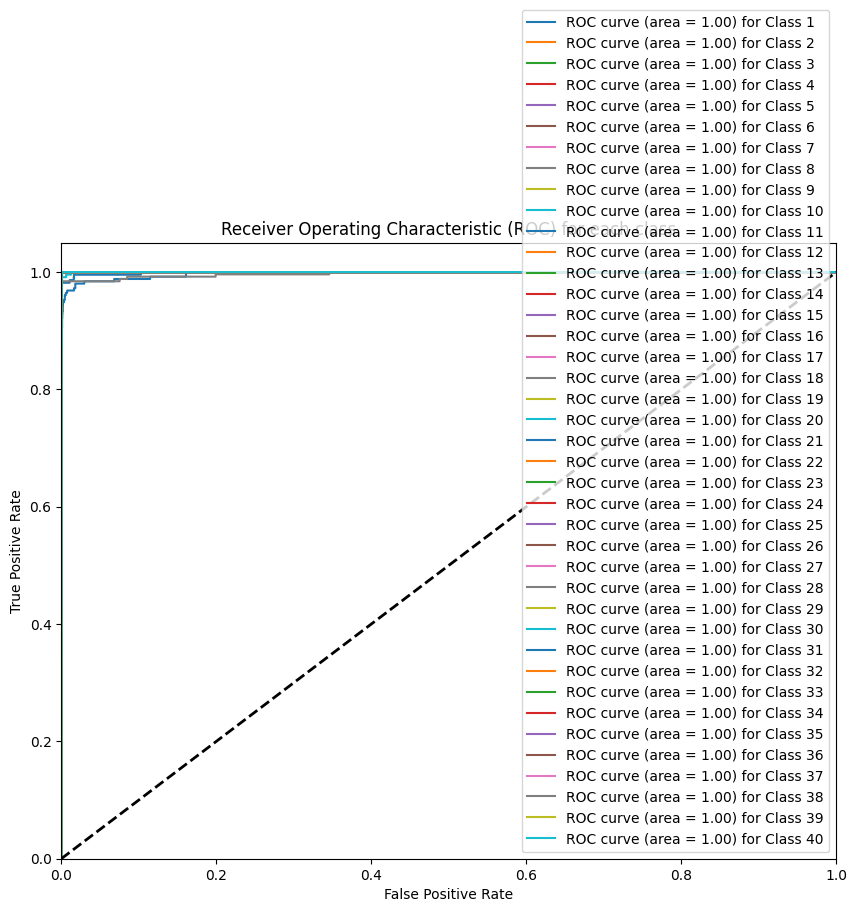

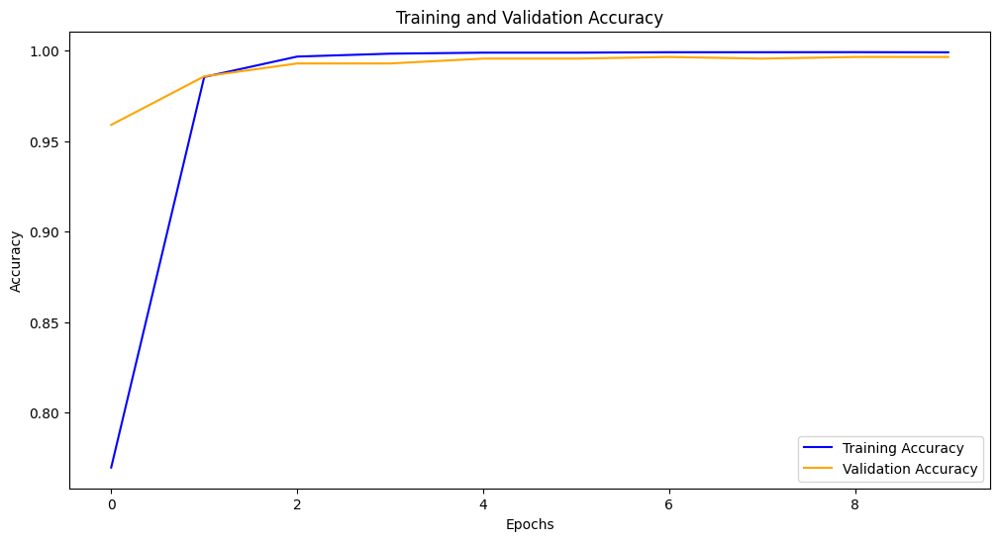

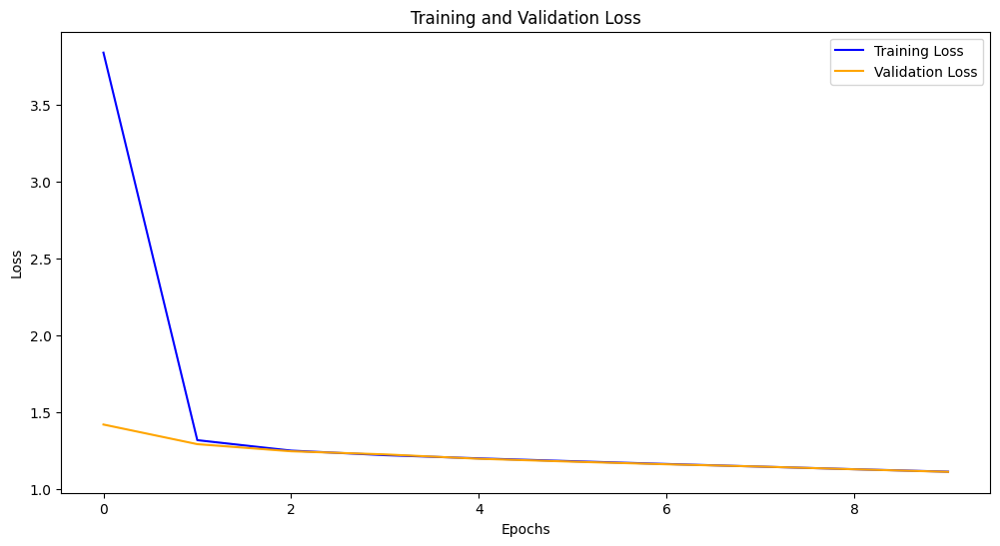

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix, roc_curve, auc
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with different optimizers and batch sizes
def create_compile_model(optimizer, batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define Adagrad optimizer
optimizer = tf.keras.optimizers.Adagrad()

# Define batch size
batch_size = 16

print(f"\nTraining with optimizer: {optimizer.__class__.__name__}, batch size: {batch_size}")
model = create_compile_model(optimizer, batch_size)

# Train the model
history = model.fit(
    [x_train_balanced, x_train_balanced],
    y_train_encoded,
    batch_size=batch_size,
    epochs=10,
    validation_split=0.05,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
)

# Evaluate the model
print("Evaluating the model...")
test_loss, test_accuracy = model.evaluate([x_test_balanced, x_test_balanced], y_test_encoded)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict([x_test_balanced, x_test_balanced])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test_balanced, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 1 to 40
cm = confusion_matrix(y_test_balanced, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(40), np.arange(1, 41))  # Adjust x-axis labels
plt.yticks(np.arange(40), np.arange(1, 41))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test_balanced, predicted_classes)
print("Classification Report:")
print(report)

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(1, num_classes):
    fpr, tpr, _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:0.2f}) for Class {i}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for each class')
plt.legend(loc="lower right")
plt.show()



# Plot training and validation accuracy curves
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.figure(figsize=(12, 6))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss curves
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(12, 6))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
from imblearn.over_sampling import RandomOverSampler

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to 80x80
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Reshape the images to 80x80x3
images_resized = np.array([cv2.resize(img, (80, 80)) for img in images])

# Initialize RandomOverSampler
oversample = RandomOverSampler()

# Reshape the images for oversampling
images_reshaped = images_resized.reshape(images_resized.shape[0], -1)

# Oversample the dataset to balance the classes
images_balanced, labels_balanced = oversample.fit_resample(images_reshaped, labels)

# Reshape the images back to 80x80x3
images_balanced = images_balanced.reshape(images_balanced.shape[0], 80, 80, 3)

# Split the balanced dataset into training and testing sets
x_train_balanced, x_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    images_balanced, labels_balanced, test_size=0.3, random_state=1
)

# One-hot encode the labels
num_classes = 41
y_train_encoded = to_categorical(y_train_balanced, num_classes)
y_test_encoded = to_categorical(y_test_balanced, num_classes)

# Define function to create and compile model with SGD optimizer and different batch sizes
def create_compile_model(batch_size):
    # Define CNN model
    cnn_input = Input(shape=(80, 80, 3))
    cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
    cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
    cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
    cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
    cnn_layer5 = Flatten()(cnn_layer4)
    cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

    # Load pre-trained VGG16 model without fully connected layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

    # Add custom classification layers with dropout
    vgg_output = Flatten()(base_model.output)
    vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
    vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
    vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

    # Merge CNN and VGG16 models
    merged_model = concatenate([cnn_output, vgg_output])

    # Create the final model
    output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
    model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

    # Freeze the weights of the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model with SGD optimizer
    sgd = SGD(lr=0.01, momentum=0.9)
    model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define batch sizes
batch_sizes = [16, 32, 64, 128]

# Loop through batch sizes
for batch_size in batch_sizes:
    print(f"\nTraining with SGD optimizer, batch size: {batch_size}")
    model = create_compile_model(batch_size)

    # Train the model
    history = model.fit(
        [x_train_balanced, x_train_balanced],
        y_train_encoded,
        batch_size=batch_size,
        epochs=10,
        validation_split=0.05,
        callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)]
    )



Training with SGD optimizer, batch size: 16


Epoch 1/10
1330/1330 [==============================] - 27s 19ms/step - loss: 82867.1016 - accuracy: 0.0392 - val_loss: 63757.7656 - val_accuracy: 0.0429
Epoch 2/10
1330/1330 [==============================] - 25s 19ms/step - loss: 49432.7812 - accuracy: 0.0427 - val_loss: 37416.8828 - val_accuracy: 0.0375
Epoch 3/10
1330/1330 [==============================] - 24s 18ms/step - loss: 29010.3730 - accuracy: 0.0452 - val_loss: 21959.0332 - val_accuracy: 0.0437
Epoch 4/10
1330/1330 [==============================] - 24s 18ms/step - loss: 17025.7656 - accuracy: 0.0453 - val_loss: 12887.7246 - val_accuracy: 0.0473
Epoch 5/10
1330/1330 [==============================] - 25s 19ms/step - loss: 9992.8779 - accuracy: 0.0405 - val_loss: 7564.6250 - val_accuracy: 0.0286
Epoch 6/10
1330/1330 [==============================] - 24s 18ms/step - loss: 5865.7207 - accuracy: 0.0381 - val_loss: 4440.7305 - val_accuracy: 0.0464
Epoch 7/10
1330/1330 [==============================] - 24s 18ms/step - loss: 34

Epoch 1/10
665/665 [==============================] - 21s 30ms/step - loss: inf - accuracy: 0.0867 - val_loss: inf - val_accuracy: 0.1152
Epoch 2/10
665/665 [==============================] - 20s 29ms/step - loss: inf - accuracy: 0.0938 - val_loss: inf - val_accuracy: 0.1027
Epoch 3/10
665/665 [==============================] - 20s 29ms/step - loss: inf - accuracy: 0.0778 - val_loss: inf - val_accuracy: 0.0768

Training with SGD optimizer, batch size: 64


Epoch 1/10
333/333 [==============================] - 22s 53ms/step - loss: 598745857990502375697154048.0000 - accuracy: 0.0919 - val_loss: 593447436583698928605593600.0000 - val_accuracy: 0.1250
Epoch 2/10
333/333 [==============================] - 17s 53ms/step - loss: 555718200249276340428079104.0000 - accuracy: 0.1388 - val_loss: 519306393483109941007876096.0000 - val_accuracy: 0.1437
Epoch 3/10
333/333 [==============================] - 18s 53ms/step - loss: 486291038129283091650314240.0000 - accuracy: 0.1416 - val_loss: 454428161558205320239513600.0000 - val_accuracy: 0.1259
Epoch 4/10
333/333 [==============================] - 17s 52ms/step - loss: 425537350605307336946876416.0000 - accuracy: 0.1362 - val_loss: 397655170724871644517498880.0000 - val_accuracy: 0.1375
Epoch 5/10
333/333 [==============================] - 17s 52ms/step - loss: 372373871078364556608667648.0000 - accuracy: 0.1180 - val_loss: 347975174348808175906455552.0000 - val_accuracy: 0.1027
Epoch 6/10
333/333 [

Epoch 1/10
167/167 [==============================] - 18s 101ms/step - loss: 2513266685247488.0000 - accuracy: 0.0798 - val_loss: 2725615237070848.0000 - val_accuracy: 0.1473
Epoch 2/10
167/167 [==============================] - 17s 101ms/step - loss: 2637327620898816.0000 - accuracy: 0.1701 - val_loss: 2549168048439296.0000 - val_accuracy: 0.1768
Epoch 3/10
167/167 [==============================] - 17s 100ms/step - loss: 2466594886254592.0000 - accuracy: 0.1883 - val_loss: 2384142788460544.0000 - val_accuracy: 0.1786
Epoch 4/10
167/167 [==============================] - 17s 99ms/step - loss: 2306914981511168.0000 - accuracy: 0.1982 - val_loss: 2229800991195136.0000 - val_accuracy: 0.1804
Epoch 5/10
167/167 [==============================] - 17s 99ms/step - loss: 2157573734137856.0000 - accuracy: 0.1977 - val_loss: 2085450630037504.0000 - val_accuracy: 0.1750
Epoch 6/10
167/167 [==============================] - 17s 100ms/step - loss: 2017898310664192.0000 - accuracy: 0.1966 - val_los